# Library Imports

In [45]:
import pandas as pd
# Import duckdb module to help us query our dataframe
import duckdb
import numpy as np
from dateutil import parser
import datetime
import isodate
import itertools
import pprint
import re
import requests
import time
from func_timeout import func_set_timeout# Decorator to prevent quota exhaustion
from datetime import date, datetime, timezone

# Data visualization libraries
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Plotly imports
import plotly.express as px
import plotly.graph_objects as go

# Seaborn plotting library
import seaborn as sns
sns.set(style="darkgrid", color_codes=True)

# Google API
from googleapiclient.discovery import build
from IPython.display import display, JSON, Image

# Beautiful Soup
from bs4 import BeautifulSoup

# Inverse model imports
from scipy.optimize import curve_fit

from IPython.display import display, JSON
# json_dict = {"my data":{1:"this", 2:"is", 3:"a", 4:"test"}}
# display(JSON(json_dict, expanded=True))

# Copy on Write
pd.options.mode.copy_on_write = True

# NLP libraries for wordcloud and text processing
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')
from wordcloud import WordCloud

# Setting Pandas options to change maximum number of dataframe rows to display.
from pandas import option_context
pd.set_option('display.min_rows', 300)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# Load environment variables from .env.
from dotenv import dotenv_values
config = dotenv_values(".env") 

# Import language detection libraries
from langdetect import detect, DetectorFactory
DetectorFactory.seed = 0

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lover\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lover\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Functions

# Database

`Duckdb` is an in-memory analytical database we can use to facilite rapid querying of our dataframe to locate rows that are not within the scope of our analysis.

In [104]:
# Create persistent DB connection.
con = duckdb.connect("./db/file.db")

# 1. Introduction

### Objective  
To explore Football Manager YouTube content trends, evaluate engagement metrics, and provide actionable insights for both creators and analysts. The project focuses on channel growth, viewer engagement, and popular content categories for "monetizable" Football Manager YouTube channels.  

### Key Questions  
- What types of content perform best in terms of views, likes, and comments?  
- How do engagement metrics correlate with content categories?  
- What role do seasonality and video length play in video performance?  

# 2. Data Collection

## 2.1 Overview

### Data Selection

We will source our own dataset using the [Google YouTube API version 3.0](https://developers.google.com/apis-explorer/?hl=en_US#p/youtube/v3/) in conjuction with appropriate search terms to isolate channels that create content related the Football Manager video game,  with elaboration on that process detailed in [Dataset Creation](#dataset-creation) section.  

### Limitations

As this project relies on data provisioned by YouTube and content generated by disparate content creators, there may be challenges with isolating which channels are appropriate to deem as "Football Manager" channels in theme and topic. There may exist videos that provide Football Manager content, yet lack the necessary tags, branding keywords, and description text to ensure the YouTube algorithm has the necessary metadata to properly present this content in API search results. This may lead to unintentional omissions of videos and content creators who meet our criteria for inclusion in the dataset. Individual channels may have their own sets of fluid practices and coventions related to how videos are described, annotated, and published. This unstandardized metadata will present challenges in isolating and filtering videos appropriate for dataset inclusion.

The selection of channels creating "top performing" Football Manager content will be based on quantitive aspects of the data provided by the YouTube Data API, as well as qualitative determinations based on domain knowledge and exposure to this gaming community and its contributors. We will strive to avoid unintentionally leveling any unfounded or negative assertions about content and content creators. There is no implication that channels with lower levels of engagement or subscribers are "underperforming" in any way.

The YouTube API guide articulates this service is free of charge, within the constraints of the specified quota limit. To ensure there is no uninentional or malicious abuse of the API, YouTube enforces a 10,000 point quota limit, with requests generally, valid or not, incurring one-point quota cost. It is possible to obtain every aspect of every YouTube channel's video data and metadata, but the sourcing will be constrained by this quota limit, unless exceptions are requested and granted by YouTube on request.

### Ethics

Information gleaned from the YouTube Data API is public data, with no known privacy or security implications. The data sourced or this project will be used only for personal research purposes and will not be utilized in any commercial endeavor. 

## 2.2 API Integration
This section details how we utilized the YouTube Data API to extract channel and video metadata.  

### Roadmap

Consulting the [YouTube Data API Overview ](https://developers.google.com/youtube/v3/getting-started), the general plan to utilize this API is as follows:

* Use a Google Account to access the Google API Console.
* Request an API key and register a new application.
* Create a new project for the new application in the [Google Developers Console](https://console.cloud.google.com/).
* Generate and configure authorization credentials to enable API requests by the application.
* Enable the YouTube Data API as a service the application is registered to use.

### API Credentials
To prevent data leakage of API credentials, we use the [dotenv](https://pypi.org/project/python-dotenv/) python module. This module enables the use of a localized `.env` file to store key-value pairs of environmental variables; these `.env` files can subsequently be secured from inclusion in version control operations by changes to the `.gitignore` file.

In [433]:
# Use dotenv-loaded configuration to import API.
api_key = config['API_KEY']

### API Service Object

After setting up our library imports, creating a new application in [Google Cloud Console](https://cloud.google.com), and generating an API key, we add the credential information into our environment. Subsequently, we implement our Python client to interact with the API via a service object.

In [434]:
# Build the YouTube Data API v3 service object using the API key.
youtube = build("youtube", "v3", developerKey=api_key)

## 2.3 Custom Functions

After creating our service object to access the YouTube Data API, we now create functions to search and fetch the data. Since the API has pagination, we must craft code able to utilize the `next_page_token` to navigate to the next page of results to capture the complete search results.

In [7]:
# Function to search for channels by keywords and retrieve statistics and branding settings
def search_channels_by_keyword_with_details(youtube, keywords, max_results=5000): 
    """
    Search for YouTube channels using specified keywords.
    
    Parameters:
    -----------
    
    youtube: The build object from googleapiclient.discovery.
    keywords: Search terms we are looking for related to YouTube channels.
    max_results: Maximum number of responses to be returned from YouTube Data API.
    
    Returns:
    Dataframe with YouTubechannel metadata, subscriber count, video count, and branding information.
    
    """
    all_channels = []
    next_page_token = None
    results_fetched = 0
    batch_size = 50  # API's maxResults limit per request

    # Continue fetching results until we have reached the maximum results desired.
    while results_fetched < max_results:
        response = youtube.search().list(
            q=keywords,  # Search query
            type="channel",  # Limit results to channels
            part="id,snippet",  # Initial parts to fetch
            maxResults=min(batch_size, max_results - results_fetched),
            pageToken=next_page_token  # Use the next page token to paginate
        ).execute()

        # Extract channel IDs from search results
        channel_ids = [item["id"]["channelId"] for item in response.get("items", [])]
        
        # Fetch additional details (statistics, brandingSettings) for these channels
        if channel_ids:
            details_response = youtube.channels().list(
                id=",".join(channel_ids),  # Pass the channel IDs
                part="snippet,statistics,brandingSettings"  # Include additional details
            ).execute()

            # Collect channel details
            for item in details_response.get("items", []):
                channel_data = {
                    "channelId": item["id"],
                    "channelTitle": item["snippet"]["title"],
                    "description": item["snippet"].get("description", ""),
                    "subscriberCount": int(item["statistics"].get("subscriberCount", 0)),
                    "viewCount": int(item["statistics"].get("viewCount", 0)),
                    "videoCount": int(item["statistics"].get("videoCount", 0)),
                    "brandingTitle": item["brandingSettings"]["channel"].get("title", ""),
                    "brandingDescription": item["brandingSettings"]["channel"].get("description", ""),
                    "brandingKeywords": item["brandingSettings"]["channel"].get("keywords", ""),
                }
                all_channels.append(channel_data)

        # Update token and count
        next_page_token = response.get("nextPageToken")
        results_fetched += len(channel_ids)

        # Break out of the while loop if no more pages.
        if not next_page_token:
            break

    # Convert the list into a dataframe
    all_channels_df = pd.DataFrame(all_channels, columns=[
                        "channelId",
                        "channelTitle",
                        "description",
                        "subscriberCount",
                        "viewCount",
                        "videoCount",
                        "brandingTitle",
                        "brandingDescription",
                        "brandingKeywords"
                        ])
    return all_channels_df


def numeric_and_gt_zero(num):
    """
    Determines if a given number is valid (positive integer), negative, or invalid.

    Parameters:
    -----------
    num : any
        The value to be checked.

    Returns:
    --------
    str
        - "Valid" if the input is a positive integer.
        - "Negative" if the input is a negative number.
        - "Invalid" if the input is not an integer or is non-positive.

    Example:
    --------
    >>> numeric_and_gt_zero(5)
    'Valid'
    >>> numeric_and_gt_zero(-3)
    'Negative'
    >>> numeric_and_gt_zero(0)
    'Invalid'
    >>> numeric_and_gt_zero("string")
    'Invalid'
    """
    if isinstance(num, int) and num > 0:
        return "Valid"
    elif isinstance(num, int) and num < 0:
        return "Negative"
    else:
        failure_string = f"Invalid: {num}"
        return failure_string


def parse_keywords_to_list(keyword_string):
    """
    Parses a given string containing keywords into a list of individual keywords, 
    preserving quoted substrings as single entries.

    Parameters:
    -----------
    keyword_string : str
        The string containing keywords, with or without quotes.

    Returns:
    --------
    listdic
        A list of keywords extracted from the input string. Quoted substrings are 
        treated as single entries, and unquoted words are split by whitespace.

    Example:
    --------
    >>> parse_keywords_to_list('FM22 "Football Manager 2022" "Football Manager" FM22')
    ['FM22', 'Football Manager 2022', 'Football Manager', 'FM22']
    """

    pattern = r'(?<!\S)"(.*?)"(?!\S)|(\S+)'
    matches = re.findall(pattern, keyword_string)
    keywords_list = [match[0] or match[1] for match in matches if match[0] or match[1]]
    return keywords_list


In [ ]:
def channel_search(channel_name):
    search_string = f"""SELECT channelTitle, channel_url, subscriberCount FROM cleaned_fm_channels
            WHERE channelTitle ILIKE '%{channel_name}%' """
    
    return duckdb.sql(search_string).df()

def channel_sum(channel_name):
    search_string = f"""SELECT ANY_VALUE(channelTitle), sum(viewsCount) FROM cleaned_fm_channels
            WHERE channelTitle ILIKE '%{channel_name}%' """
    
    return duckdb.sql(search_string).df()

chan_search_term = 'Zea'
yt_search = channel_search(chan_search_term)
print(yt_search)
yt_sum = channel_sum(chan_search_term)
print(yt_sum)

In [44]:
def get_channel_stats(youtube, channel_ids):
    """
    Get channel statistics: title, subscriber count, view count, video count, upload playlist
    Params:
    
    youtube: the build object from googleapiclient.discovery
    channels_ids: list of channel IDs
    
    Returns:
    Dataframe containing the channel statistics for all channels in the provided list: title, subscriber count, view count, video count, upload playlist
    
    """
    all_data = []
    request = youtube.channels().list(
                part='snippet,contentDetails,statistics',
                id=','.join(channel_ids))
    response = request.execute() 
    
    for i in range(len(response['items'])):
        data = dict(channelId = response['items'][i]['id'],
                    # country = response['items'][i]['snippet']['country'],
                    publishedAt = response['items'][i]['snippet']['publishedAt'],
                    thumbnail_url = response['items'][i]['snippet']['thumbnails']['default']['url'],
                    channelName = response['items'][i]['snippet']['title'],
                    subscribers = response['items'][i]['statistics']['subscriberCount'],
                    views = response['items'][i]['statistics']['viewCount'],
                    totalVideos = response['items'][i]['statistics']['videoCount'],
                    playlistId = response['items'][i]['contentDetails']['relatedPlaylists']['uploads'])
        all_data.append(data)

    # Create Dataframe from response information
    all_data = pd.DataFrame(all_data)
    
    # Coerce known numeric columns into numeric datatype 
    numeric_cols = ['totalVideos', 'views', 'subscribers']
    all_data = convert_cols_numeric(all_data, numeric_cols)

    # Parse `publishedAt`
    all_data['publishedAt'] =  all_data['publishedAt'].apply(lambda x: parser.parse(x)) 

    return (all_data)


def get_video_details(youtube, video_ids):
    """
    Get video statistics of all videos with given IDs
    Params:
    
    youtube: the build object from googleapiclient.discovery
    video_ids: list of video IDs
    
    Returns:
    Dataframe with statistics of videos, i.e.:
        'channelTitle', 'title', 'description', 'tags', 'publishedAt'
        'viewCount', 'likeCount', 'favoriteCount', 'commentCount'
        'duration', 'definition', 'caption'
    """
        
    all_video_info = []
    
    for i in range(0, len(video_ids), 50):
        request = youtube.videos().list(
            part="snippet,contentDetails,statistics",
            id=','.join(video_ids[i:i+50])
        )
        response = request.execute() 

        for video in response['items']:
            stats_to_keep = {'snippet': ['channelTitle', 'title', 'description', 'tags', 'publishedAt'],
                             'statistics': ['viewCount', 'likeCount', 'favouriteCount', 'commentCount'],
                             'contentDetails': ['duration', 'definition', 'caption']
                            }
            video_info = {}
            video_info['video_id'] = video['id']
            # Set the channel ID
            # video_info['channel_id'] = response['items']['id']
            for k in stats_to_keep.keys():
                for v in stats_to_keep[k]:
                    try:
                        video_info[v] = video[k][v]
                    except:
                        video_info[v] = None

            all_video_info.append(video_info)
    
    # Convert list to dataframe.
    all_video_info = pd.DataFrame(all_video_info)

    # Coerce specified columns into numeric format.
    numeric_cols =  ['viewCount', 'likeCount', 'favouriteCount', 'commentCount']
    all_video_info = convert_cols_numeric(all_video_info, numeric_cols)

    # Parse `publishedAt`
    all_video_info['publishedAt'] =  all_video_info['publishedAt'].apply(lambda x: parser.parse(x))
    
    # Return altered dataframe
    return all_video_info


def get_comments_in_videos(youtube, video_ids):
    """
    Get top level comments as text from all videos with given IDs (only the first 10 comments due to quote limit of Youtube API)
    Params:
    
    youtube: the build object from googleapiclient.discovery
    video_ids: list of video IDs
    
    Returns:
    Dataframe with video IDs and associated top level comment in text.
    
    """
    all_comments = []
    
    for video_id in video_ids:
        try:   
            request = youtube.commentThreads().list(
                part="snippet,replies",
                videoId=video_id
            )
            response = request.execute()
        
            comments_in_video = [comment['snippet']['topLevelComment']['snippet']['textOriginal'] for comment in response['items'][0:10]]
            comments_in_video_info = {'video_id': video_id, 'comments': comments_in_video}

            all_comments.append(comments_in_video_info)
            
        except: 
            # When error occurs - most likely because comments are disabled on a video
            print(f"Could not get comments for video: {video_id}")
        
    return pd.DataFrame(all_comments)


def convert_cols_numeric(df, numeric_cols):
    """
    Convert columns specified in `numeric_cols` to numeric data type. Otherwise, these will be `object' by default
    Params:
    
    df: The dataframe we want to change columns numerically
    video_ids: List of named columns we wish to change from `object` or other datatype to numeric
        Ex: numeric_cols = ['viewCount', 'likeCount', 'favouriteCount', 'commentCount']    
    Returns:
    Dataframe with specified columns cast into numeric datatype.
    
    """    
    df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors = 'coerce', axis = "columns")
    return df


def convert_ts_to_utc(ts):
    """
    Convert a Timestamp object to coordinate universal time or UTC.
    
    Params:
    
    ts: The original Timestamp data from YouTube API.

    Returns:
    ts_utc: Timestamp converted to UTC.
        
    """    
    stamp = pd.Timestamp(ts)
    stamp_utc = stamp.tz_convert("utc")
    return stamp_utc



from datetime import date, datetime, timezone

Y = 2000 # dummy leap year to allow input X-02-29 (leap day)
seasons = [('Winter', (date(Y,  1,  1),  date(Y,  3, 20))),
           ('Spring', (date(Y,  3, 21),  date(Y,  6, 20))),
           ('Summer', (date(Y,  6, 21),  date(Y,  9, 22))),
           ('Autumn', (date(Y,  9, 23),  date(Y, 12, 20))),
           ('Winter', (date(Y, 12, 21),  date(Y, 12, 31)))]

def get_season(now):
    if isinstance(now, datetime):
        now = now.date()
    now = now.replace(year=Y)
    return next(season for season, (start, end) in seasons
                if start <= now <= end)

## 2.4 Understanding Channel Resources

As our research is based on the concept of YouTube "channels,"  we must understand how channel information is represented via the resources returned as results from our API requests.  The [`channel` resource](https://developers.google.com/youtube/v3/docs/channels) containing information about a YouTube channel appears as detailed below:

This specific portions of the `channel` resource of interest are:
* **snippet**: Basic channel details, title, description, and thumbnail
* **statistics**: Statistics for the channel
* **brandingSettings**: Branding information for the channel.

### Get Channel Statistics

We use the YouTube Data API  `search` method invoked in our `search_channels_by_keyword_with_details` function to find channels associated the terms "FM24" and "Football Manager." As we are not aware of how many total channels on YouTube providing content in this niche, we are aggressive with our maximum result limit. If 5000 channels are found, we will know there are more channels matching our criteria. If there are less than 5000, we can use the amount found in search to refine our future queries.

In [8]:
# Find all YouTube channels with Football Manager related keywords. We use "AND" to to restrict results to the game and game release desired.
all_fm_channels = search_channels_by_keyword_with_details(youtube, "Football Manager AND FM24", max_results=5000)
print(f"Retrieved {len(all_fm_channels)} channels")

Retrieved 504 channels


We do a shallow validation of the first five channels using the `head()` function on the dataframe. 

In [9]:
print(f"Retrieved {len(all_fm_channels)} channels")
display(all_fm_channels.head(5))

Retrieved 504 channels


,channelId,channelTitle,description,subscriberCount,viewCount,videoCount,brandingTitle,brandingDescription,brandingKeywords
0,UCanvn-ZdqKp9GiwVkHSHL_A,Moneyball_FM,"📈 #FootballManager24 | No soy Brad Pitt, dejad...",1220,46692,80,Moneyball_FM,"📈 #FootballManager24 | No soy Brad Pitt, dejad...","Moneyball Moneyball_fm footballmanager24 ""foot..."
1,UCZ7umxF5sRT5bkJQH8ZYK_g,RDF Tactics,"Hello, football managers! I'm RDF Tactics, an ...",69100,11319687,334,RDF Tactics,"Hello, football managers! I'm RDF Tactics, an ...","""rdf tactics"" ""football manager 2024"" ""fm24 ta..."
2,UCe_heL31hYCMDOdxn-g12GQ,Avgdad,"Overthinking Football Manager, one illogical s...",6100,406418,26,Avgdad,"Overthinking Football Manager, one illogical s...",
3,UC-rJ_c0v5_rhoiRMT8ZlO1w,The Cult of FM,"Jack, 30, UEFA B Licenced coach.\nMatch Engine...",8950,856754,363,The Cult of FM,"Jack, 30, UEFA B Licenced coach.\nMatch Engine...",
4,UCKvJ62LDqb3uhQaqOzkkqVg,Chroo,I make fictional football stories\n\nBusiness ...,87100,11087394,143,Chroo,I make fictional football stories\n\nBusiness ...,"soccer football ""video essay"" FIFA sports ""ea ..."


# 3. Data Cleaning and Preprocessing

As we are interested in statistics for monetizable channels, let's find how many of the channels in our dataframe have 1000 or more subscribers.

In [57]:
monetizable_fm_channels = all_fm_channels.query('subscriberCount >= 1000')
len(monetizable_fm_channels)

232

In [11]:
232 / 504

0.4603174603174603

Only 46.03% percent of all channels found with our search terms appear monetizable. 

The `all_fm_channels` dataframe columns with counts are numeric in nature, while textual columns have defaulted to type `object`. 

In [27]:
monetizable_fm_channels.dtypes

channelId              object
channelTitle           object
description            object
subscriberCount         int64
viewCount               int64
videoCount              int64
brandingTitle          object
brandingDescription    object
brandingKeywords       object
channel_url            object
dtype: object

### Removing Non-FM Channels

Of the remaining monetizable channels, we need to use our domain knowledge of the gaming industry and the Football simulation topic to remove channels erroneously discovered via our search. Game titles such as "Top Eleven" and "FC" are Football simulation games that may use overlapping branding keywords and tags in our current dataframe. In addition, content creators may also stream, or have streamed in the past, alternative game titles outside of Football Manager. An example of such a content creator that streams both categories equally is [Chesnoid Gaming](https://www.youtube.com/@ChesnoidGaming).  We want to exclude channels that are primarily dedicated to games other than Football Manager to preserve the integrity of our analysis.

In [311]:
# Create a query to search the dataframe to search for channels with branding keywords indicative of games *other* than Football Manager.
suspect_non_fm_channels = duckdb.sql("""SELECT channelTitle, channel_url, brandingKeywords FROM monetizable_fm_channels
            WHERE brandingKeywords ILIKE '%FC%' OR brandingKeywords ILIKE '%FIFA%'
            OR brandingKeywords ILIKE '%FIFA%' OR brandingKeywords ILIKE '%Top Eleven%' 
            """).df()

In [49]:
missing_fm_kw_channels = duckdb.sql("""SELECT channelTitle, channel_url FROM monetizable_fm_channels
            WHERE brandingKeywords NOT ILIKE '%Football Manager%' OR brandingKeywords NOT ILIKE '%FM24%'
            """).df()

In [ ]:
# Analyze the dataframe with suspected non-FM channels
with option_context('display.max_colwidth', None):
    display(suspect_non_fm_channels)

In [ ]:
# Analyze the dataframe with suspected non-FM channels
with option_context('display.min_rows', None):
    display(missing_fm_kw_channels)

Our domain knowledge comes into play for analyzing these sets of channels missing keywords or "appearing" to not be Football Manager related:

* `Chroo`, `DarkHorseFM`, and `BTN Live` are well-known Football Manager content creators, in spite of the lack of branding keywords indicating as much.
* `Manar Hidayat` in spite of lacking any keywords, is a Football Manager 2024 World Cup Winner.
* `NickRTM` and `Nick28T` (no relation) are renown FIFA/FC24 content creators who have taken up Football Manager for the first time this year. This may mean that the bulk of their respective  audiences may derive from their FIFA/FC24 gaming fanbase; there may also be crossover subscribers/views from users who focus on Football Manager predominately. 
* In spite of any keywords, there is a convention of Football Manager content creators having channel titles branded with `FM`, to indicate their speciality.
* Some channels may engage in streaming of numerous games in addition to Football Manager.

We will remove the invalid channels and then reassess if more preprocessing is needed. To simplify manual validation, we used a context manager to temporarily remove maximum column width from the display of dataframes in our notebook. This enables full view of the keywords and URLs are involved for our manual validation efforts; we will need to introspect the YouTube channel content and ensure we have the best possible matches to our analysis criteria.

In [ ]:
# View the monetizable channels dataframe in full detail.
#with option_context('display.max_colwidth', None):
with option_context('display.min_rows', 400):
    display(monetizable_fm_channels[['channelId', 'channelTitle', 'brandingKeywords','channel_url']])

#### Channels To Remove From Dataset


|Channel Title|Reason to remove|
|------------|------|
| FifaMat| FC24 game content.|
| aruldagul| FC24 game content.|
| Bit Fut| FC24 game content.|
| Football Manager| Game Publisher channel.|


In [313]:
# We need to remove invalid channels we located manually. We will confirm their index values in our data frame.

# First Method
# mask = monetizable_fm_channels['channelTitle'].values == 'Bit Fut'
# monetizable_fm_channels[mask]

# Second Method
# monetizable_fm_channels.query('channelTitle == "Football Manager"')

# Results
# 
# Channel Title: Index
# aruldagul: 361
# FifaMat: 268
# Bit Fut: 254 

# Drop the non-FM related channels from the dataframe.
cleaned_fm_channels = monetizable_fm_channels.drop(index=[361, 268, 254, 11])

# Print how many channels remain after removing false-positives
len(cleaned_fm_channels)

228

### Removing Duplicate Columns

After removing non-FM related video channels, we turn our attention to column redundancy. The column pairs of `description`/`brandingDescription` and `channelTitle`/`brandingTitle` are duplicative content, so we drop the `description` and `brandingTitle` columns.

In [83]:
with option_context('display.max_colwidth', None):
    display(cleaned_fm_channels[['description', 'brandingDescription']].head(3))

,description,brandingDescription
0,"📈 #FootballManager24 | No soy Brad Pitt, dejad de preguntar.","📈 #FootballManager24 | No soy Brad Pitt, dejad de preguntar."
1,"Hello, football managers! I'm RDF Tactics, an FM content creator and aspiring football analyst/scout. This channel is your premier source for Football Manager, tactical analysis, and FM Tactics. This channel is not just a destination for virtual football gurus but also a bridge between the digital and real football worlds. With a background at Dinamo Tbilisi, my experience in the beautiful game spans from the virtual pitch to the real one.\n\nTo contact, please email rdftactics@gmail.com\n","Hello, football managers! I'm RDF Tactics, an FM content creator and aspiring football analyst/scout. This channel is your premier source for Football Manager, tactical analysis, and FM Tactics. This channel is not just a destination for virtual football gurus but also a bridge between the digital and real football worlds. With a background at Dinamo Tbilisi, my experience in the beautiful game spans from the virtual pitch to the real one.\n\nTo contact, please email rdftactics@gmail.com\n"
2,"Overthinking Football Manager, one illogical step at a time and hopefully flattening that difficulty curve just a little bit! This channel is all about the religion, er, video game that is the Football Manager series, going through various aspects of it in detail and with a realism bias rather than anything meta.","Overthinking Football Manager, one illogical step at a time and hopefully flattening that difficulty curve just a little bit! This channel is all about the religion, er, video game that is the Football Manager series, going through various aspects of it in detail and with a realism bias rather than anything meta."


In [84]:
with option_context('display.max_colwidth', None):
    display(cleaned_fm_channels[['channelTitle', 'brandingTitle']].head(3))

,channelTitle,brandingTitle
0,Moneyball_FM,Moneyball_FM
1,RDF Tactics,RDF Tactics
2,Avgdad,Avgdad


In [ ]:
# Remove duplicate `description` and `brandingTitle` columns 
cleaned_fm_channels = cleaned_fm_channels.drop(columns=['description', 'brandingTitle'])

In [89]:
cleaned_fm_channels.head(1)

,channelId,channelTitle,subscriberCount,viewCount,videoCount,brandingDescription,brandingKeywords,channel_url
0,UCanvn-ZdqKp9GiwVkHSHL_A,Moneyball_FM,1220,46692,80,"📈 #FootballManager24 | No soy Brad Pitt, dejad...","Moneyball Moneyball_fm footballmanager24 ""foot...",https://www.youtube.com/channel/UCanvn-ZdqKp9G...


In [91]:
# Confirm columns removed.
cleaned_fm_channels.columns

Index(['channelId', 'channelTitle', 'subscriberCount', 'viewCount',
       'videoCount', 'brandingDescription', 'brandingKeywords', 'channel_url'],
      dtype='object')

### Confirm Valid Count Columns

With the `channelId` and `channelTitle` being unique columns, we turn attention the dataframe columns related to counts. 
* subscriberCount
* viewCount
* videoCount

All of the data in these columns must be numeric and greater than zero.  We use `apply` along with a small function to detect non-negative integers for these columns. If the `unique()` methods returns anything other than `Valid`, we know there may be a negative number or a non-integer in these columns.

In [96]:
# Valid subscriber Count
valid_sub_count = cleaned_fm_channels['subscriberCount'].apply(numeric_and_gt_zero)
valid_sub_count.unique()

array(['Valid'], dtype=object)

In [104]:
# Valid views Count
valid_viewer_count = cleaned_fm_channels['viewCount'].apply(numeric_and_gt_zero)
valid_viewer_count.unique()

array(['Valid', 'Invalid: 0'], dtype=object)

In [105]:
# Valid videos count
valid_videos_count = cleaned_fm_channels['videoCount'].apply(numeric_and_gt_zero)
valid_videos_count.unique()

array(['Valid', 'Invalid: 0'], dtype=object)

#### Removing Autogenerated YouTube Channels

We appear to have some issues with our `viewCount` and `videoCount` so we must investigate further. There appear to be one or more channels with no views and no videos.

In [106]:
cleaned_fm_channels.query('viewCount == 0')

,channelId,channelTitle,subscriberCount,viewCount,videoCount,brandingDescription,brandingKeywords,channel_url
47,UCQJrYbskjw0NTT0Wp9XSBXw,Football Manager 2024 - Topic,4390,0,0,soccer games 2024 has playing instructions gui...,,https://www.youtube.com/channel/UCQJrYbskjw0NT...


In [107]:
cleaned_fm_channels.query('videoCount == 0')

,channelId,channelTitle,subscriberCount,viewCount,videoCount,brandingDescription,brandingKeywords,channel_url
47,UCQJrYbskjw0NTT0Wp9XSBXw,Football Manager 2024 - Topic,4390,0,0,soccer games 2024 has playing instructions gui...,,https://www.youtube.com/channel/UCQJrYbskjw0NT...


This channel is auto-generated by the YouTube platform itself to enable viewers to surface Football Manager 2024 content itself. Since there is no person generating content, and the channel acts as a content aggregator, this would explain why there are subscribers present, but no views or video data. We can safely remove this from our dataset.

In [315]:
cleaned_fm_channels = cleaned_fm_channels.drop(index=[47])

### Check For Null Values

In [146]:
# Check for the presence of any Null values in our dataframe
print(cleaned_fm_channels.isnull().values.any())

# If there were nulls, we could use the following to present counts
print(cleaned_fm_channels.isnull().sum())

False
channelId              0
channelTitle           0
description            0
subscriberCount        0
viewCount              0
videoCount             0
brandingTitle          0
brandingDescription    0
brandingKeywords       0
channel_url            0
keyword_list           0
dtype: int64


### Standardize `brandingKeywords` Column Values

With the count columns validated, we turn attention to the `brandingKeywords` column. We want to convert the string value into a list, so we can individually consider each term separately and consistently. Some keywords are currently double quoted, others lacking in quotes. We use the `parse_keywords_to_list` function to return a list and create a new column to store the output.

In [145]:
# Create a new column called `keyword_list` to store the tokenization output.
cleaned_fm_channels['keyword_list'] = cleaned_fm_channels['brandingKeywords'].apply(parse_keywords_to_list)

In [113]:
# Sample the cleaned `keyword_list` column.
cleaned_fm_channels['keyword_list'].head(3)

0    [Moneyball, Moneyball_fm, footballmanager24, f...
1    [rdf tactics, football manager 2024, fm24 tact...
2                                                   []
Name: keyword_list, dtype: object

In [154]:
# Create new column called `kword_list_length` to measure how many elements are in the `keyword_list` column.
cleaned_fm_channels['kword_list_length'] = cleaned_fm_channels['keyword_list'].apply(len)

In [155]:
# Sample keyword list length
cleaned_fm_channels[['keyword_list', 'kword_list_length']].head()

,keyword_list,kword_list_length
0,"[Moneyball, Moneyball_fm, footballmanager24, f...",15
1,"[rdf tactics, football manager 2024, fm24 tact...",4
2,[],0
3,[],0
4,"[soccer, football, video essay, FIFA, sports, ...",9


### Adding Channel URLs

As each `channelId` acts as a unique identifier for the YouTube channels in our dataframe, we can augment the dataframe with a new column of channel URLs. We add this column at this stage since we may need to manually verify channel content. 

In [58]:
# Add a new field called `channel_url` by prepending the standard YouTube URL prefix.
cleaned_fm_channels['channel_url'] = 'https://www.youtube.com/channel/' + cleaned_fm_channels['channelId']
cleaned_fm_channels['channel_url'].head(2)

0    https://www.youtube.com/channel/UCanvn-ZdqKp9G...
1    https://www.youtube.com/channel/UCZ7umxF5sRT5b...
Name: channel_url, dtype: object

## Create Database Tables

As we approach having to download large amounts of data that we wish to analyze, we must interface with our data and persist it well enough to avoid having to replicate the automated process of acquiring video IDs. First, we will persist the `cleaned_fm_channels` data.

#### Create `videos` Table

In [755]:
# Create the `videos` table to store video data
con.sql("""CREATE TABLE videos (video_id VARCHAR, 
                              channelTitle VARCHAR,
                              title VARCHAR,
                              description VARCHAR,
                              tags VARCHAR[],
                              publishedAt TIMESTAMP WITH TIME ZONE,
                              viewCount DOUBLE,
                              likeCount DOUBLE,
                              favouriteCount DOUBLE,
                              commentCount DOUBLE,
                              duration VARCHAR,
                              definition VARCHAR,
                              caption VARCHAR,
                              channelId VARCHAR)""")

# Create unique index on video_id
con.sql("CREATE UNIQUE INDEX video_unique ON videos (video_id)")

In [13]:
con.sql("DESCRIBE TABLE videos")

┌──────────────────┬──────────────────────────┬─────────┬─────────┬─────────┬─────────┐
│   column_name    │       column_type        │  null   │   key   │ default │  extra  │
│     varchar      │         varchar          │ varchar │ varchar │ varchar │ varchar │
├──────────────────┼──────────────────────────┼─────────┼─────────┼─────────┼─────────┤
│ video_id         │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelTitle     │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ title            │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ description      │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ tags             │ VARCHAR[]                │ YES     │ NULL    │ NULL    │ NULL    │
│ publishedAt      │ TIMESTAMP WITH TIME ZONE │ YES     │ NULL    │ NULL    │ NULL    │
│ viewCount        │ DOUBLE                   │ YES     │ NULL    │ NULL    │ NULL    │
│ likeCount        │ DOUBLE     

#### Create `yt_channels` Table

In [595]:
# Create a DB table called 'yt_channels' from cleaned_fm_channels dataframe
con.execute("CREATE TABLE yt_channels AS SELECT * FROM cleaned_fm_channels")

#### Discovering Duplicate Channel Entries

In [617]:
# Search for duplicate entries for channelID in our table.
con.sql("SELECT channelID, COUNT(channelId) FROM yt_channels GROUP BY channelId HAVING COUNT(channelId) > 1")

┌──────────────────────────┬──────────────────┐
│        channelId         │ count(channelId) │
│         varchar          │      int64       │
├──────────────────────────┼──────────────────┤
│ UChjSn0ZLprnZafK3BgB9lXA │                2 │
│ UC9uIA5ZKQWCBUfvr4rh6iYg │                2 │
│ UCwkYDxngAh7vSSBLfg36mXQ │                2 │
└──────────────────────────┴──────────────────┘

As our database import has revealed we have redundant rows, we can check the database contents to confirm this.

In [619]:
# Inspect the duplicates inside of the `yt_channels` table more closely
con.sql("SELECT * FROM yt_channels WHERE channelId = 'UChjSn0ZLprnZafK3BgB9lXA'")

┌──────────────────────────┬──────────────┬───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┬─────────────────┬───────────┬────────────┬───────────────┬───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┬──────────────────┬──────────────────────────────────────────────────────────┬──────────────┬───────────────────┐
│        channelId         │ channelTitle │                                                                                description                                                                                │ subscriberCount │ viewCount │ videoCount │ brandingTitle │                                                                            brandingDescription                                                                       

In [621]:
cleaned_fm_channels.query('channelId == "UChjSn0ZLprnZafK3BgB9lXA"')

,channelId,channelTitle,description,subscriberCount,viewCount,videoCount,brandingTitle,brandingDescription,brandingKeywords,channel_url,keyword_list,kword_list_length
169,UChjSn0ZLprnZafK3BgB9lXA,Stythe FC,It's da Stythe. Welcome to our channel. Hit th...,2490,85411,10,Stythe FC,It's da Stythe. Welcome to our channel. Hit th...,,https://www.youtube.com/channel/UChjSn0ZLprnZa...,[],0
225,UChjSn0ZLprnZafK3BgB9lXA,Stythe FC,It's da Stythe. Welcome to our channel. Hit th...,2490,85411,10,Stythe FC,It's da Stythe. Welcome to our channel. Hit th...,,https://www.youtube.com/channel/UChjSn0ZLprnZa...,[],0


In [623]:
cleaned_fm_channels.query('channelId == "UC9uIA5ZKQWCBUfvr4rh6iYg"')

,channelId,channelTitle,description,subscriberCount,viewCount,videoCount,brandingTitle,brandingDescription,brandingKeywords,channel_url,keyword_list,kword_list_length
186,UC9uIA5ZKQWCBUfvr4rh6iYg,MooonoStreams,,1940,64272,78,MooonoStreams,,,https://www.youtube.com/channel/UC9uIA5ZKQWCBU...,[],0
229,UC9uIA5ZKQWCBUfvr4rh6iYg,MooonoStreams,,1940,64272,78,MooonoStreams,,,https://www.youtube.com/channel/UC9uIA5ZKQWCBU...,[],0


In [624]:
cleaned_fm_channels.query('channelId == "UCwkYDxngAh7vSSBLfg36mXQ"')

,channelId,channelTitle,description,subscriberCount,viewCount,videoCount,brandingTitle,brandingDescription,brandingKeywords,channel_url,keyword_list,kword_list_length
126,UCwkYDxngAh7vSSBLfg36mXQ,Selim Atalay,"Merhabalar, ben Yavuz Selim Atalay. Bu kanal i...",1350,252597,57,Selim Atalay,"Merhabalar, ben Yavuz Selim Atalay. Bu kanal i...","FM24 ""FM 24"" ""Football Manager 2024"" ""Sinyor S...",https://www.youtube.com/channel/UCwkYDxngAh7vS...,"[FM24, FM 24, Football Manager 2024, Sinyor Se...",15
154,UCwkYDxngAh7vSSBLfg36mXQ,Selim Atalay,"Merhabalar, ben Yavuz Selim Atalay. Bu kanal i...",1350,252597,57,Selim Atalay,"Merhabalar, ben Yavuz Selim Atalay. Bu kanal i...","FM24 ""FM 24"" ""Football Manager 2024"" ""Sinyor S...",https://www.youtube.com/channel/UCwkYDxngAh7vS...,"[FM24, FM 24, Football Manager 2024, Sinyor Se...",15


The `cleaned_fm_channels` dataframe has duplicate records. Given the dataframe rows are carbon copies of each other, we shall remove the higher index rows from the dataframe and retry the table creation operation.

In [626]:
cleaned_fm_channels = cleaned_fm_channels.drop(index=[225, 229, 154])

After deleting these redundant rows, we will drop the original table, create a new table, and verify the `channelId` column is unique.

In [627]:
# Drop table from failed initial table creation attempt.
# con.execute('DROP TABLE yt_channels')

# Recreate table
con.execute("CREATE TABLE yt_channels AS SELECT * FROM cleaned_fm_channels")

# Rerun script to validate unique channelIds.
con.sql("SELECT channelID, COUNT(channelId) FROM yt_channels GROUP BY channelId HAVING COUNT(channelId) > 1")

┌───────────┬──────────────────┐
│ channelId │ count(channelId) │
│  varchar  │      int64       │
├───────────┴──────────────────┤
│            0 rows            │
└──────────────────────────────┘

With no redundant channelId values, we create an index on this column to facilitate faster query operations.

In [628]:
# Create index on the channeId column.
con.execute("CREATE UNIQUE INDEX channel_id_idx ON yt_channels (channelId);")

In [635]:
con.sql("DESCRIBE TABLE yt_channels")

┌─────────────────────┬─────────────┬─────────┬─────────┬─────────┬─────────┐
│     column_name     │ column_type │  null   │   key   │ default │  extra  │
│       varchar       │   varchar   │ varchar │ varchar │ varchar │ varchar │
├─────────────────────┼─────────────┼─────────┼─────────┼─────────┼─────────┤
│ channelId           │ VARCHAR     │ YES     │ NULL    │ NULL    │ NULL    │
│ channelTitle        │ VARCHAR     │ YES     │ NULL    │ NULL    │ NULL    │
│ description         │ VARCHAR     │ YES     │ NULL    │ NULL    │ NULL    │
│ subscriberCount     │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ viewCount           │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ videoCount          │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ brandingTitle       │ VARCHAR     │ YES     │ NULL    │ NULL    │ NULL    │
│ brandingDescription │ VARCHAR     │ YES     │ NULL    │ NULL    │ NULL    │
│ brandingKeywords    │ VARCHAR     │ YES     │ NULL    │ NULL  

In [644]:
channel_stats['channelId'] = channel_stats['channelID']
channel_stats = channel_stats.drop('channelID', axis='columns')
channel_stats

,publishedAt,thumbnail_url,channelName,subscribers,views,totalVideos,playlistId,channelId
0,2017-05-14 20:55:55+00:00,https://yt3.ggpht.com/-iExfmFHJgNMQfi2doXa2aIK...,Domingo Replay,432000,192875519,2500,UUfAV0Lg4IPzZyRQq_Nh-5KA,UCfAV0Lg4IPzZyRQq_Nh-5KA
1,2011-05-20 16:21:38+00:00,https://yt3.ggpht.com/6PJ9bTmRDln2vL_TyZV1cpb7...,FM Scout,194000,51019405,1884,UUJPE-cqo-rFbvOIE-37G09g,UCJPE-cqo-rFbvOIE-37G09g
2,2020-09-30 11:23:19.409192+00:00,https://yt3.ggpht.com/OjoBHvM7-r8L7k8R2l95g1eZ...,Manny Plus,218000,30595588,533,UUVzKJvNg6RAtwAwIJ9tflng,UCVzKJvNg6RAtwAwIJ9tflng
3,2019-05-08 15:48:00+00:00,https://yt3.ggpht.com/d3ls2rXQe1emK8imkYDy5mjU...,Omega Luke,151000,53275870,1126,UUz69o5GpwaZhNy6LAQolDYA,UCz69o5GpwaZhNy6LAQolDYA
4,2015-04-06 08:25:09+00:00,https://yt3.ggpht.com/0Em8Sw2v9fcKwgaiDsBa3GLE...,Arthur Ray,96800,33566654,3218,UUNL-PktThtkU9V9mUSA6_xw,UCNL-PktThtkU9V9mUSA6_xw
5,2016-05-18 11:51:28+00:00,https://yt3.ggpht.com/5-rUgcmzkPPteah6kWQcOBFy...,ZackNaniTV,161000,29021560,1800,UUuIyhergGAWTG1XBvIfW2PA,UCuIyhergGAWTG1XBvIfW2PA
6,2017-01-14 12:54:58+00:00,https://yt3.ggpht.com/nlmHUPqUJgvNjPY4am6BVhjX...,TomFM,209000,45489086,1684,UU0B_surYDWjLFNV7Iix3A3Q,UC0B_surYDWjLFNV7Iix3A3Q
7,2007-02-22 16:16:37+00:00,https://yt3.ggpht.com/xEGlAuKjfV-e5wNVlhYPg_1M...,docks,244000,109585942,5968,UU2DPhH9Q_3Ah1nYqOi2Hm-w,UC2DPhH9Q_3Ah1nYqOi2Hm-w
8,2013-01-16 11:30:12+00:00,https://yt3.ggpht.com/sX_B0SxD2GTtGmiuvt3TfKuw...,WorkTheSpace,212000,86612482,3277,UUO3AJGFCk2fnB_P6RnwzSog,UCO3AJGFCk2fnB_P6RnwzSog
9,2014-01-07 12:09:09+00:00,https://yt3.ggpht.com/bKRVjKdvrEn-9hQJypM3THef...,DK FALCON,158000,13619356,144,UUF3C1Uy2-D6r6d2satSS1og,UCF3C1Uy2-D6r6d2satSS1og


#### Create `stats` Table

In [661]:
# Create a table for channel_stats dataframe called `stats.`
con.execute("CREATE TABLE stats AS SELECT * FROM channel_stats")

In [642]:
channel_stats.columns

Index(['channelID', 'publishedAt', 'thumbnail_url', 'channelName',
       'subscribers', 'views', 'totalVideos', 'playlistId'],
      dtype='object')

In [662]:
# Create index on the channeId column for the `stats` table.
con.execute("CREATE UNIQUE INDEX stats_channel_id_idx ON stats (channelId);")

In [663]:
con.sql("DESCRIBE TABLE stats")

┌───────────────┬──────────────────────────┬─────────┬─────────┬─────────┬─────────┐
│  column_name  │       column_type        │  null   │   key   │ default │  extra  │
│    varchar    │         varchar          │ varchar │ varchar │ varchar │ varchar │
├───────────────┼──────────────────────────┼─────────┼─────────┼─────────┼─────────┤
│ publishedAt   │ TIMESTAMP WITH TIME ZONE │ YES     │ NULL    │ NULL    │ NULL    │
│ thumbnail_url │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelName   │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ subscribers   │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ views         │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ totalVideos   │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ playlistId    │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelId     │ VARCHAR                  │ YES     │ NULL    │ 

In [667]:
con.sql("SELECT * FROM stats LIMIT 1")

┌──────────────────────────┬────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┬────────────────┬─────────────┬───────────┬─────────────┬──────────────────────────┬──────────────────────────┐
│       publishedAt        │                                                       thumbnail_url                                                        │  channelName   │ subscribers │   views   │ totalVideos │        playlistId        │        channelId         │
│ timestamp with time zone │                                                          varchar                                                           │    varchar     │    int64    │   int64   │    int64    │         varchar          │         varchar          │
├──────────────────────────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┼────────────────┼─────────────┼───────────┼─────────

#### Channel Playlists and Channel ID

As a sidenote, we discovered a interesting design decision made by YouTube. The `playlistId` and `channelId` strings are exactly the same, with `UC` being the prefix for the channel and `UU` being the prefix for the channel playlist. To confirm this, we run a query on our dataset:  

In [722]:
# Create temporary dataframe 
test_channel_stats = channel_stats

# Apply changes to playlistId to match nominal channelId prefix value of 'UC'
test_channel_stats['truncated_playlistId'] = test_channel_stats['playlistId'].apply(lambda x: x.replace('UU', 'UC'))

# If the print statement echoes output, then we have mismatches. This will be blank if our assumption is correct.
print(test_channel_stats.query('channelId != truncated_playlistId'))

# Clean up temporary dataframe
del(test_channel_stats)

Empty DataFrame
Columns: [publishedAt, thumbnail_url, channelName, subscribers, views, totalVideos, playlistId, channelId, truncated_playlistId]
Index: []


# 4. Exploratory Data Analysis

## 4.1 Summary Statistics

We begin with summary statistics of the YouTube channel data have gleaned from our API calls.

In [261]:
cleaned_fm_channels.describe()

,subscriberCount,viewCount,videoCount,kword_list_length
count,227.000000,2.270000e+02,227.000000,227.000000
mean,32999.691630,9.328200e+06,725.572687,14.590308
std,88553.494714,3.563241e+07,963.904692,12.909984
min,1020.000000,6.400000e+02,4.000000,0.000000
25%,2250.000000,2.235070e+05,101.500000,2.500000
50%,5670.000000,7.176400e+05,361.000000,13.000000
75%,18450.000000,3.597154e+06,913.500000,24.000000
max,879000.000000,4.187818e+08,5962.000000,72.000000


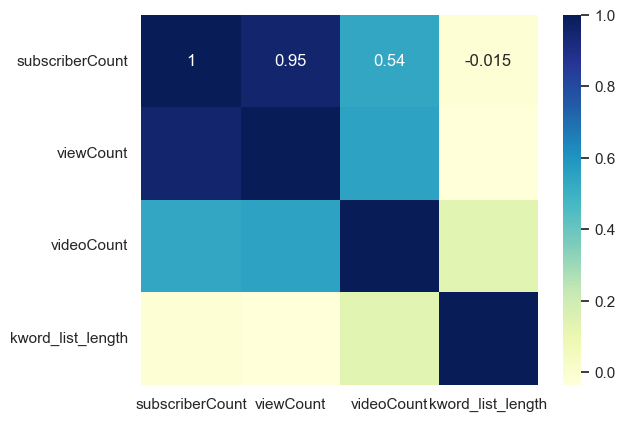

In [55]:
# Plotting correlation heatmap
dataplot = sns.heatmap(cleaned_fm_channels.corr(numeric_only=True), cmap="YlGnBu", annot=True)

# Displaying heatmap
plt.show()

We have **227** YouTube channels in our cleaned dataset; at a glance, the count of subscribers and views have extreme maximum values, as compared to their mean values. We expect a large count of "smaller" channels coupled with a long tail distrubution, ending with a handful of channels with massive subscribers and video count numbers. 

## 4.2 Subscribers Distribution

Subscribers refer to people or accounts on YouTube that will have channels they are subscribed to appear within their content feed, receiving updates and notifications whenever new videos are uploaded. The more subscribers a channel has, the more popular a channel is and the more likely the channel will possess a larger audience for its content.

### Subscriber Count

Our average number of subscribers is **33K** from our summary stats, but we also notice the maximum subscriber count is **879K**, with a standard deviation of **88.6K**. This high standard deviation means that the average may not meaningfully communicate the general number of subscriptions the channels generally have.

In [19]:
cleaned_fm_channels['subscriberCount'].median()

5670.0

### Subscriptions for FM Channels

The summary statistics give the impression of a highly skewed distribution of subscriptions concentrated in a small set of creators. We will create a histogram that will provide a clearer representation of the distribution of subscriptions across a range of subscription counts.  We will also use a histogram combined with a [marginal](https://plotly.com/python/marginal-plots/) "rug" subplot to visualize in greater detail what channels have what amount of subscribers. 

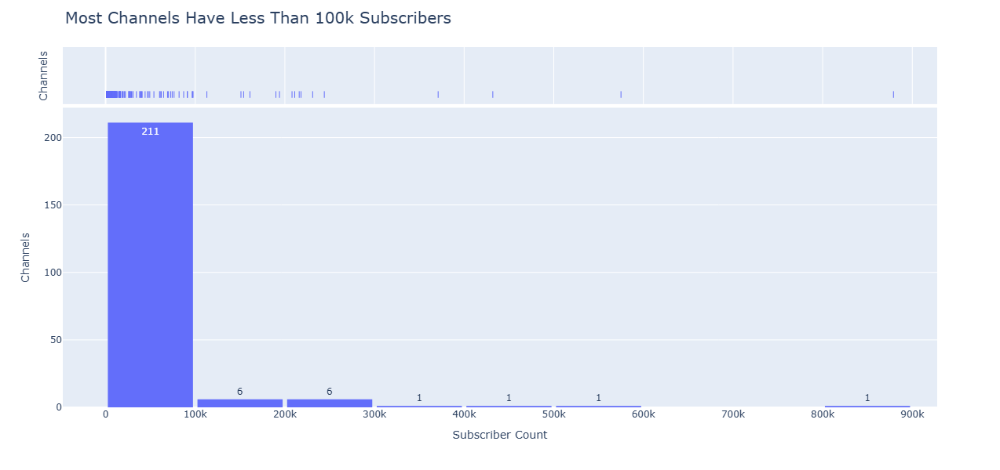

In [14]:
fig = px.histogram(cleaned_fm_channels,
                   x="subscriberCount",
                   marginal="rug",
                   nbins=10,
                   text_auto=True,
                   width=1200,
                   height=600,
                   labels={"subscriberCount": "Subscriber Count",
                           "y": "Number of Channels"
                          }
)
fig.update_layout(
                  bargap=0.05, # Set a gap between histogram bins
                  #title_text='Football Manager YouTube Channel Subscribers' # title of plot
                  title = dict(text="Most Channels Have Less Than 100k Subscribers ", font=dict(size=20), x=0.065),
)
# Set custom y-axis label
# fig.update_yaxes(title_text="Number of Channels")
fig.update_yaxes(title_text="Channels")
fig.show()

**93%** of all monetizable channels have less than 100K subscribers, with a significantly smaller number of channels exceeding this amount of subscribers. We use the "rug" subplot above the histogram to provide a granular representation of where channels fall on the subscriber distribution. For the all the channels, we see a concentration of channels at the lower end of subscriber counts, and then a long tail of fewer channels with higher subscriber counts.

### Channels under 100K Subscribers

In [21]:
channels_under_100k = cleaned_fm_channels.query('subscriberCount <=100000')

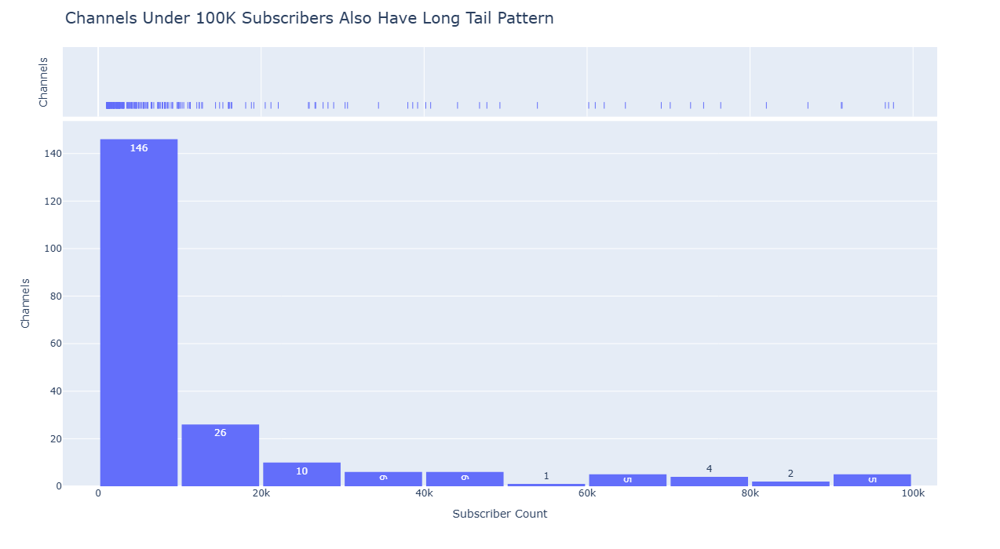

In [24]:
fig = px.histogram(channels_under_100k,
                   x="subscriberCount",
                   hover_data=['channelTitle'],
                   marginal="rug",
                   nbins=10,
                   text_auto=True,
                   width=1200,
                   height=700,
                   labels={"subscriberCount": "Subscriber Count",
                           "y": "Number of Channels"
                          }
)

fig.update_layout(
                  bargap=0.05, # Set a gap between histogram bins
                  title=dict(text='Channels Under 100K Subscribers Also Have Long Tail Pattern', font=dict(size=20), x=0.065) # title of plot                 
)

fig.update_yaxes(title_text="Channels")

fig.show()

Using a subset of data below the 100K subscriber watermark exhibits a similar pattern in the histogram observed for all channels at large, with a large amounts of channels with lower subscriber counts, a precipitous drop in channels with significantly larger subscriber volume, and fewer creators in the long tail.

### Top 20 Channels by Subscribers

To narrow the scope our analysis, we focus attention on the channels with largest amount of subscribers.

In [161]:
top_20_by_subs_channels = cleaned_fm_channels.sort_values('subscriberCount', ascending=False).head(20)
top_20_by_subs_channels.index=[''] * len(top_20_by_subs_channels)

In [164]:
# display(top_20_by_subs_channels[['channelTitle', 'subscriberCount']])
top_20_by_subs_channels[['channelTitle', 'subscriberCount']]

,channelTitle,subscriberCount
,NickRTFM,879000
,Nick28T,575000
,Domingo Replay,432000
,Zealand,371000
,docks,244000
,Ataberk Doğan,231000
,Manny Plus,218000
,Kırmızı Kep,216000
,WorkTheSpace,211000
,TomFM,208000


We can now calculate how many of the total amount of subscribers in our _entire_ dataset are taken up by the top 20 channels by subscription count.

In [60]:
(top_20_by_views_channels['subscriberCount'].sum() / cleaned_fm_channels['subscriberCount'].sum()) * 100

61.99497258684836

With **62%** of total subscribers taken by the Top 20 channels by subscribers is a significant finding, but needs to be clarified. YouTube channel subscriptions are not "exclusive" in any way. A person may be subscribed to one or more than one channel at any one time, unsubscribe and resubscribe at any time, meaning there could be significant overlap and sharing of the same "person" accounting for mutiple channel subscriptions. This also means potential fluidity in how subscriptions for channels shrink and grow.

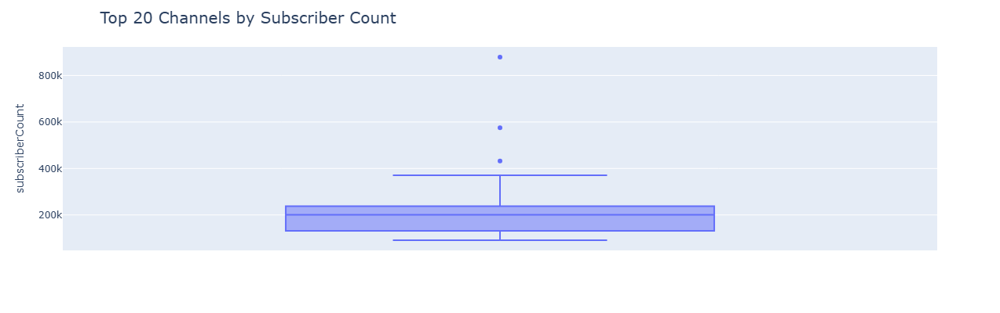

In [180]:
fig = px.box(top_20_by_subs_channels, y="subscriberCount", custom_data=['channelTitle'], height=400, width=800)
fig.update_traces(hovertemplate =
                 "<b>%{customdata[0]}</b><br>%{y} Subscribers",
                 )
fig.update_layout(title=dict(text='Top 20 Channels by Subscriber Count', font=dict(size=20), x=0.1)) # title of plot           
fig.show()

The boxplot reveals three outliers with regard to subscription count:
* **NickRTFM**: 879K
* **Nick28T**: 575K
* **Domingo Replay**: 432K

Our **interquartile range** (IQR) for the Top 20 channels ranked by subscribers begins at **132K** and ends at **237.5K**. Generally, the Top 20 reside within this band, but the boxplot data is skewed due to the two highest subscriber count channels being those of FIFA/FC content creators who only recently created Football Manager content. 

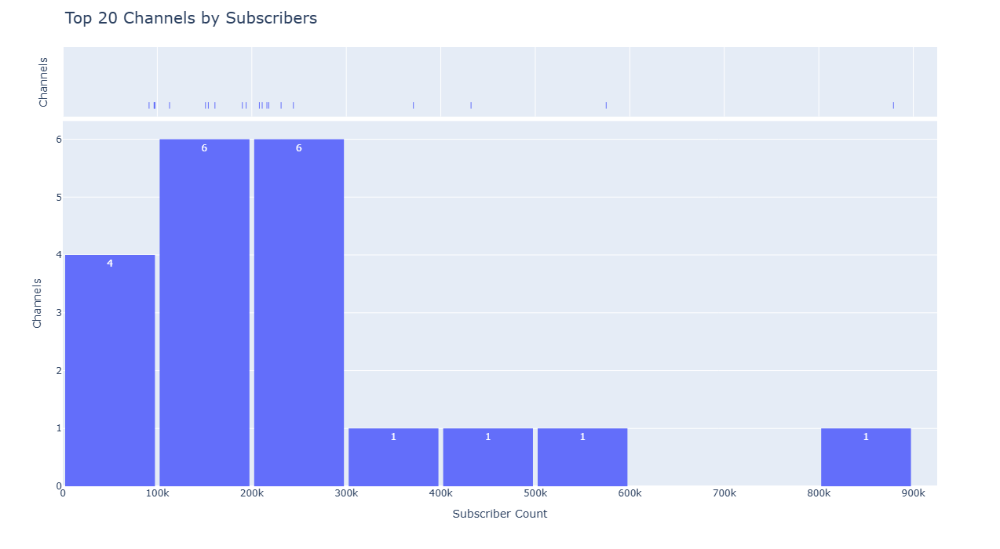

In [119]:
fig = px.histogram(top_20_by_subs_channels,
                   x="subscriberCount",
                   hover_data=['channelTitle'],
                   marginal="rug",
                   nbins=10,
                   text_auto=True,
                   width=1200,
                   height=700,
                   labels={"subscriberCount": "Subscriber Count",
                           "y": "Number of Channels"
                          }
)

fig.update_layout(
                  bargap=0.05, # Set a gap between histogram bins
                  title=dict(text='Top 20 Channels by Subscribers', font=dict(size=20), x=0.065) # title of plot                 
)

fig.update_yaxes(title_text="Channels")

fig.show()

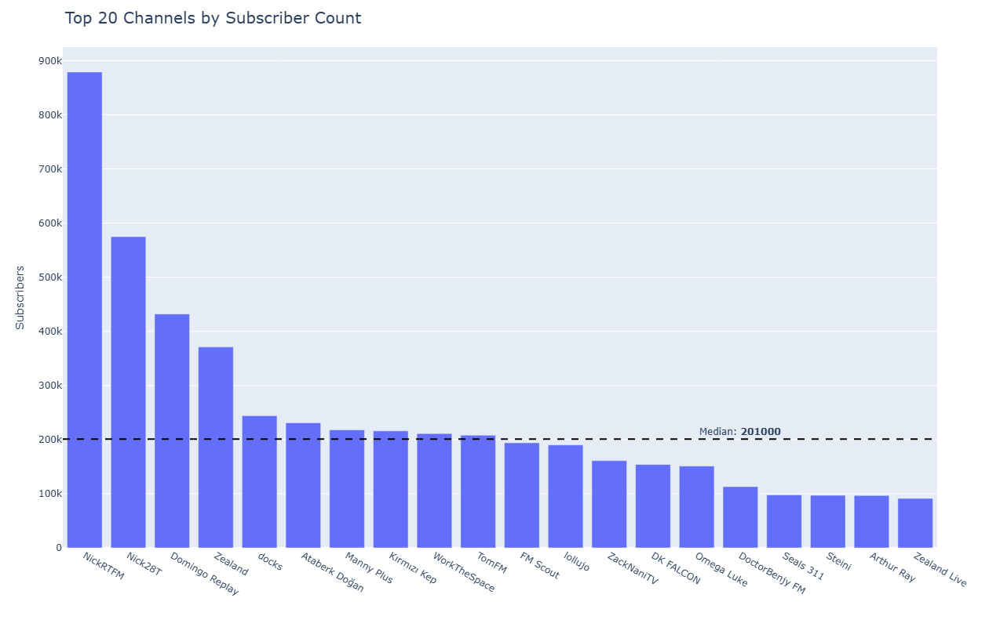

In [78]:
fig = px.bar(top_20_by_subs_channels, x='channelTitle', y='subscriberCount', width=1200, height=800, hover_data={'channelTitle': False})

fig.update_traces(hovertemplate='<b>%{x}</b><br><br>%{y} Subscribers')

fig.update_yaxes(
    title_text="Subscribers"
)

fig.update_xaxes(
    title_text = "",
    # ticklabelposition="outside top",
)

fig.update_layout(yaxis={'categoryorder':'total ascending'},
                  # xaxis={'side': 'top'}, 
                  #title=dict(text="FM Channels Ranked by Subscribers", font=dict(size=20), x=0.5), # title of plot
                  title=dict(text="Top 20 Channels by Subscriber Count", font=dict(size=20), x=0.065), # title of plot
                  showlegend=False,                  
)

fig.add_hline(y=top_20_by_subs_channels['subscriberCount'].median(), line_width=2, line_dash="dash", line_color="black")

fig.add_annotation(x=15, y=top_20_by_subs_channels['subscriberCount'].median(),
            text="Median: <b>" + f"{top_20_by_subs_channels['subscriberCount'].median():.0f}" + "</b>",
            showarrow=False,
            yshift=10)

fig.show()

For our Top 20 channels, `NickRTFM` leads the pack with whopping **897K** subscribers. `Nick28T` trails behind with a significant **575K** subscribers, followed by `Domingo Replay`(**432K**) and the infamous `Zealand`(**371K**). The histogram flattens to amounts close to our median value of **201K** subscribers and ends in a second channel owned by `Zealand` called `Zealand Live`with **91K** subscribers.

A concern is that some of the creators on this list primarily stream FIFA/FC and other types of content, and their presence may alter true consideration of values indicative of Football Manager streamers. We will modify our plot and remove the top three creators and see if this alters the median values in our distribution.

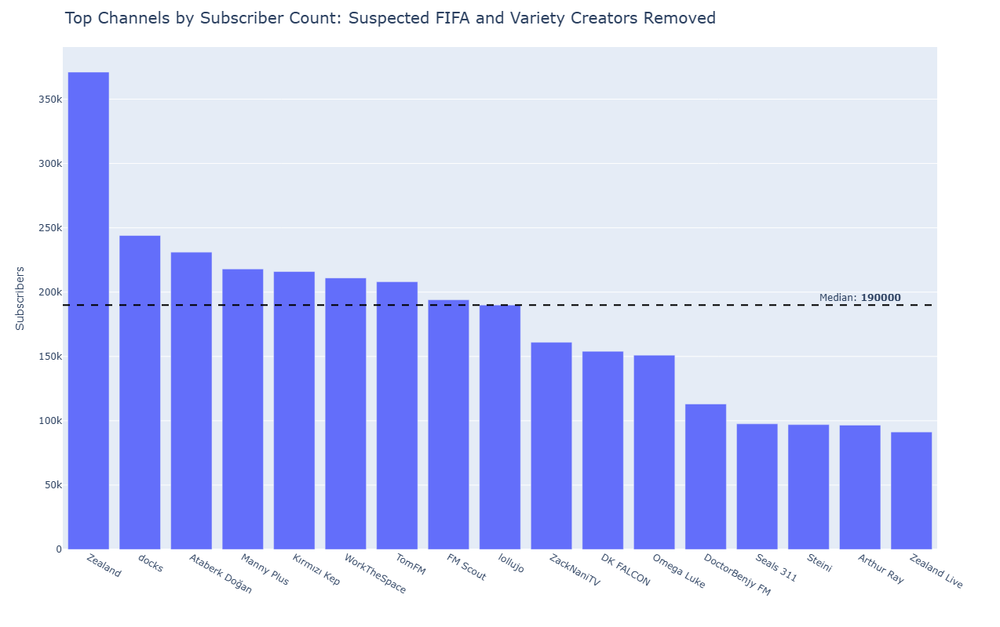

In [448]:
fig = px.bar(top_20_by_subs_channels.tail(17), x='channelTitle', y='subscriberCount', width=1200, height=800, hover_data={'channelTitle': False})

fig.update_traces(hovertemplate='<b>%{x}</b><br><br>%{y} Subscribers')

fig.update_yaxes(
    title_text="Subscribers"
)

fig.update_xaxes(
    title_text = "",
    # ticklabelposition="outside top",
)

fig.update_layout(yaxis={'categoryorder':'total ascending'},
                  # xaxis={'side': 'top'}, 
                  #title=dict(text="FM Channels Ranked by Subscribers", font=dict(size=20), x=0.5), # title of plot
                  title=dict(text="Top Channels by Subscriber Count: Suspected FIFA and Variety Creators Removed", font=dict(size=20), x=0.065), # title of plot
                  showlegend=False,                  
)

fig.add_hline(y=top_20_by_subs_channels.tail(17)['subscriberCount'].median(), line_width=2, line_dash="dash", line_color="black")

fig.add_annotation(x=15, y=top_20_by_subs_channels.tail(17)['subscriberCount'].median(),
            text="Median: <b>" + f"{top_20_by_subs_channels.tail(17)['subscriberCount'].median():.0f}" + "</b>",
            showarrow=False,
            yshift=10)

fig.show()

In [442]:
top_20_by_subs_channels.tail(17)['subscriberCount'].median()

190000.0

The presence of `Zealand` and the underlying mildly lowers the median value to **190K** as compared to **201K**, lowering the median by **5.5%** with the removal of suspected FIFA/FC streamers.

A boxplot with the full Top 20 channels by subscribers makes the outlier channels and data "spread" more apparent.

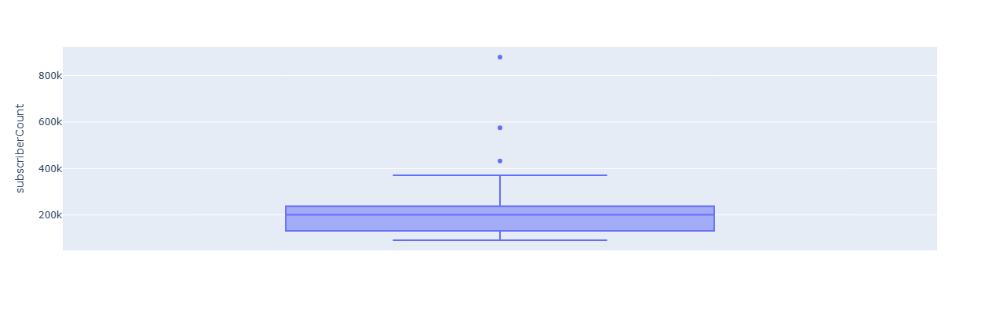

In [16]:
fig = px.box(top_20_by_subs_channels, y="subscriberCount", custom_data=['channelTitle'], height=400, width=1200)
fig.update_traces(hovertemplate =
                "<b>%{customdata[0]}</b><br>%{y} Subscribers" )
fig.show()

Outlier channels over the upper fence of **371K** subscribers are:
* **NickRTFM**: **879K** subscribers
* **Nick28T**: **575K** subscribers
* **Domingo Replay**: 432K subscribers

The actual "box" representing the **interquartile range** (IQR) begins at **132K** and ends **237.5K**, with a median value of **201K**.

Visualizing the same data with the top three channels removed:

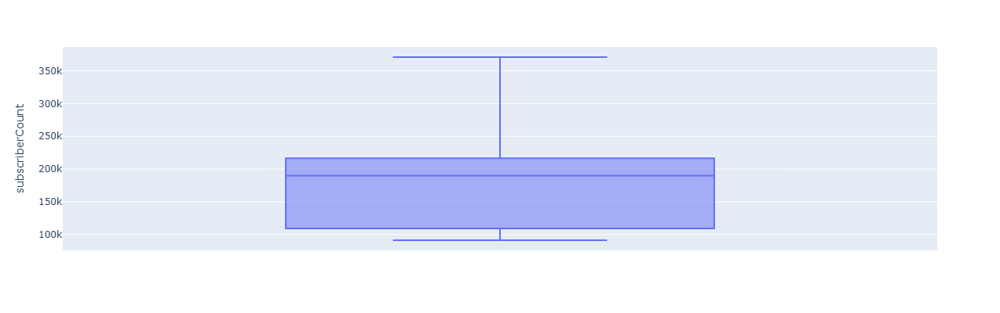

In [450]:
fig = px.box(top_20_by_subs_channels.tail(17), y="subscriberCount", custom_data=['channelTitle'], height=400, width=1200)
fig.update_traces(hovertemplate =
                "<b>%{customdata[0]}</b><br>%{y} Subscribers" )
fig.show()

#### Secondary Channels

Interestingly, some individual content creators happen to have multiple YouTube channels, likely in an effort to diversify their content footprint, and to possibly expand the themes associated with their particular brand. Using our domain knowledge we are aware of the following secondary and tertiary channels:
* Zealand
    * Zealand
    * Zealand Live
    * Zealand's Streams
* Lollujo
    * lollujo
    * lollujo 2
* Second Yellow Card
    * Second Yellow Card
    * Straight Red Card

The use of secondary and tertiary channels affords content creators the ability to attract viewers with different profiles, to approach Football Manager gameplay in different ways, as well as to create content outside their traditional "niche." This may indicate creators are seeking to expand their viewing audiences to grow in novel ways, and to avoid market saturation with a singular channel.  

#### Keywords and Subscriber Count

We can explore if these creators do anything interesting with branding keywords for their respective channels. During our preprocessing stages, we created `keyword_list` and `kword_list_length` columns, which can assist us.

In [179]:
top_20_by_subs_channels['kword_list_length'].describe()

count   20.00
mean    15.30
std     11.40
min      0.00
25%      7.75
50%     16.00
75%     21.75
max     41.00
Name: kword_list_length, dtype: float64

In [66]:
cleaned_fm_channels['kword_list_length'].describe()

count   227.00
mean     14.59
std      12.91
min       0.00
25%       2.50
50%      13.00
75%      24.00
max      72.00
Name: kword_list_length, dtype: float64

YouTube imposes a 500 character limit for channel branding keywords, with the keywords being in a comma-separated format. In our top channels by subscribers, we see an average of  **15.30** keywords, a maximum of **41** keywords, and three channels with no branding keywords present. One of the three channels lacking any branding keywords is the channel with the maximum amount of subscribers in the dataset (`NickRTFM`). This implies subscriber counts for a channel are independent on the presence of branding keywords. To explore this, we will use a scatterplot to visualize this in greater detail; if there is no relationship, then the points should not have an obvious trend. 

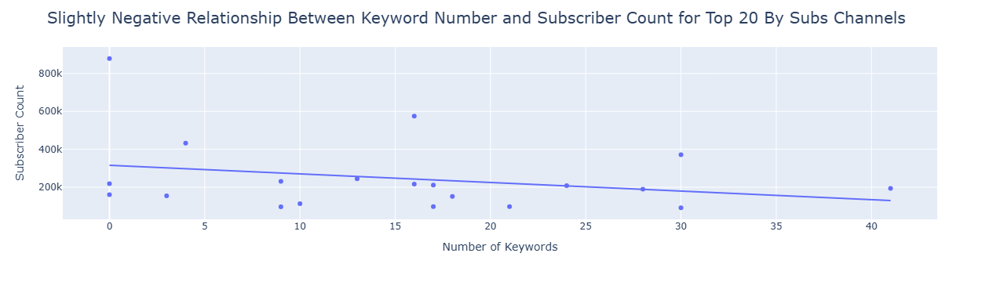

In [64]:
fig = px.scatter(top_20_by_subs_channels,
                 x='kword_list_length',
                 y='subscriberCount',
                 labels={"subscriberCount": "Subscriber Count",
                           "kword_list_length": "Number of Keywords"
                          },
                 hover_data=['channelTitle'],
                 trendline="ols")
fig.update_layout(title=dict(text='Slightly Negative Relationship Between Keyword Number and Subscriber Count for Top 20 By Subs Channels', font=dict(size=20), x=0.047)) # title of plot
fig.show()

By and large, we do not see clustering of data points on the plot. We do observe a slightly downward trend with subscriber count and the number of keywords, indicating that more keywords are slightly correlated to less subscribers.  Content creators may be engaging in "keyword stuffing," viewing the channel branding keywords in a similar vein to SEO practices, seeking to attract search engine traffic and viewers by ranking for keywords that map to their nominal search intent. 

The use of branding keywords is designed to enable YouTube to more accurately understand and categorize the channel's content internally; as YouTube's ranking algorithms are secret, it is not possible to associate branding keywords with inbound channel traffic, nor is there a direct way to relate the presence of keywords with increased levels of channel subscription.

Broadening our consideration of keywords and subscriber count, we create a scatterplot comprising the entire cleaned dataset.

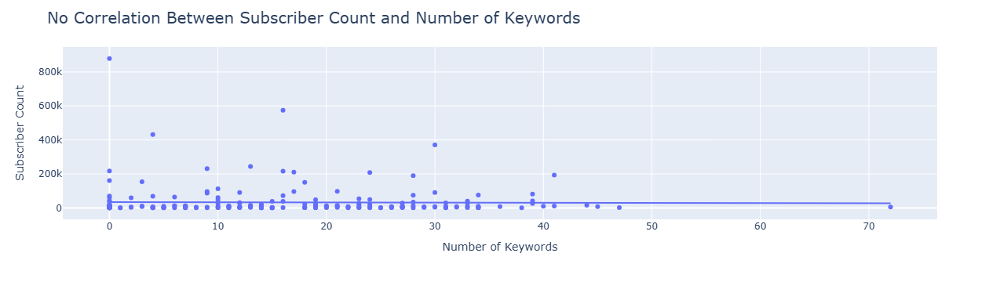

In [75]:
fig = px.scatter(cleaned_fm_channels,
                 x='kword_list_length',
                 y='subscriberCount',
                 labels={"subscriberCount": "Subscriber Count",
                           "kword_list_length": "Number of Keywords"
                          },
                 hover_data=['channelTitle'],
                 trendline="ols")
fig.update_layout(title=dict(text='No Correlation Between Subscriber Count and Number of Keywords', font=dict(size=20), x=0.047)) # title of plot
fig.show()

#### No Subscribers and Keywords Correlation

Considering all channels in the dataset, the trendline for keywords and subscriber count looks extremely flat in nature. We can be even more precise and see if the correlation coefficient can quantify the lack of any relationship. 

In [74]:
# Calculate Pearson correlation
correlation_sub_kwords_top_20 = top_20_by_subs_channels['subscriberCount'].corr(top_20_by_subs_channels['kword_list_length'])
print(f"Top 20: Correlation between subscriber count and number of keywords: {correlation_sub_kwords_top_20:.3f}\n")

correlation_sub_kwords = cleaned_fm_channels['subscriberCount'].corr(cleaned_fm_channels['kword_list_length'])
print(f"All Channels: Correlation between subscriber count and number of keywords: {correlation_sub_kwords:.3f}\n")

Top 20: Correlation between subscriber count and number of keywords: -0.269

All Channels: Correlation between subscriber count and number of keywords: -0.015



There appears to be no relationship between branding keywords considering all channels in the dataset, while the Top 20 channels by subs exhibits a weak _negative_ correlation. 

## 4.3 Views Distribution

### View Counts for All Channels

We turn our attention to how many cumulative views the channels in our dataset have. This is a raw count of views, not adjusted by the number of videos a content creator has on their channel. YouTube has a definition of a [legitimate view](https://support.google.com/youtube/answer/9313698?hl=en) but detailed channel-specific engagement metrics is limited to content creators and not available publicly.

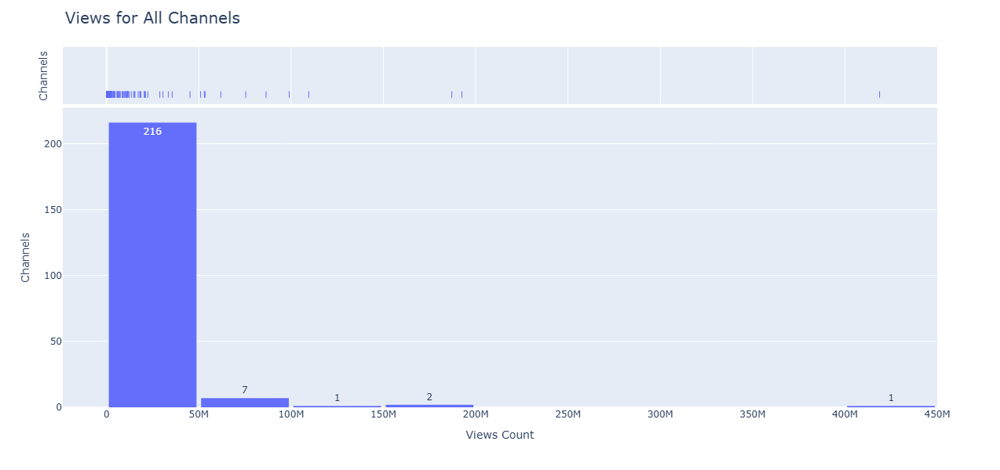

In [191]:
fig = px.histogram(cleaned_fm_channels,
                   x="viewCount",
                   marginal="rug",
                   hover_data=['channelTitle'],
                   nbins=10,
                   text_auto=True,
                   width=1200,
                   height=600,
                   labels={"viewCount": "Views Count",
                           "y": "Number of Channels"
                          }
)
fig.update_layout(
                  bargap=0.05, # Set a gap between histogram bins
                  #title_text='Football Manager YouTube Channel Subscribers' # title of plot
                  title = dict(text="Views for All Channels", font=dict(size=20), x=0.065),
)
# Set custom y-axis label
# fig.update_yaxes(title_text="Number of Channels")
fig.update_yaxes(title_text="Channels")
fig.show()

Again, 216 out of 227 channels in our cleaned dataset have less than **50M** total views; as per the barplot's 'rug' subplot, we see the bulk of these are under **22M** views total.

In [455]:
cleaned_fm_channels['viewCount'].describe()

count         227.00
mean      9328199.99
std      35632408.76
min           640.00
25%        223507.00
50%        717640.00
75%       3597153.50
max     418781817.00
Name: viewCount, dtype: float64

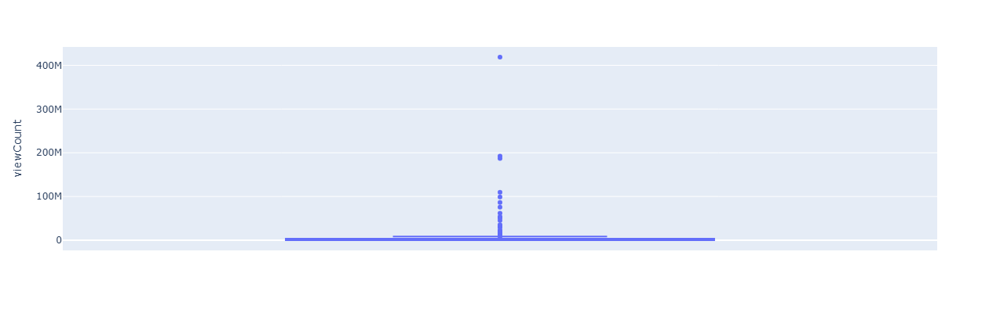

In [456]:
fig = px.box(cleaned_fm_channels, y="viewCount", custom_data=['channelTitle'], height=400, width=1200)
fig.update_traces(hovertemplate =
                "<b>%{customdata[0]}</b><br>%{y} Views" )
fig.show()

### Views and Subscriptions Correlation

To uncover if there is a relationship between the number of subscriptions a channel has and the cumulative count of views, we create a scatterplot of these factors.

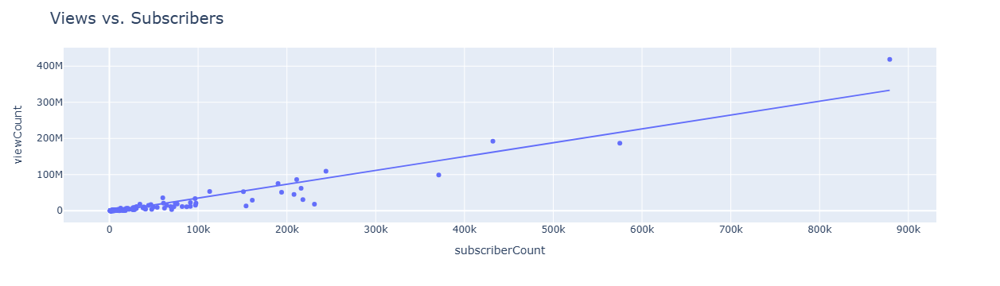

In [218]:
# Create scatter plot of Views vs. Subscriber Count.
fig = px.scatter(cleaned_fm_channels,
                 x='subscriberCount',
                 y='viewCount',
                 custom_data=['channelTitle'],
                 trendline="ols",
)

fig.update_layout(  title=dict(text="Views vs. Subscribers", font=dict(size=20), x=0.05)
)

fig.update_traces(hovertemplate =
                "<b>%{customdata[0]}</b><br>%{x} Subscribers<br>%{y} Views",
)
fig.show()

In [203]:
# Measure the Pearson's correlation between view count subscriber count. 
cleaned_fm_channels['viewCount'].corr(cleaned_fm_channels['subscriberCount'])

0.9517255078565019

For all channels in our cleaned dataset, the correlation coefficient value of **0.95** indicates a strong positive linear relationship between subscriber count and the number views each channel has. This communicates there are few instances of a channel with low subscription rate having an extraordinary amount of views (indicative of virality), and that channels with large subscription bases have stable viewing behavior. In other words, subscription volume indicates stable and reliable viewing behavior across all sizes of channels generally.

### Top 20 Channels By View Count

We want to list the highest ranked channels by total views and see if we locate a similar set of channels as observed by subscriber count.

In [17]:
# Create Top 20 dataframe of channels ranked by views
top_20_by_views_channels = cleaned_fm_channels.sort_values('viewCount', ascending=False).head(20)
top_20_by_views_channels[['channelTitle', 'viewCount']]

,channelTitle,viewCount
111,NickRTFM,418781817
190,Domingo Replay,192489002
199,Nick28T,187071013
120,docks,109545894
134,Zealand,98962203
7,WorkTheSpace,86429351
27,lollujo,75413666
311,Kırmızı Kep,61944980
21,DoctorBenjy FM,53421552
16,Omega Luke,52989306


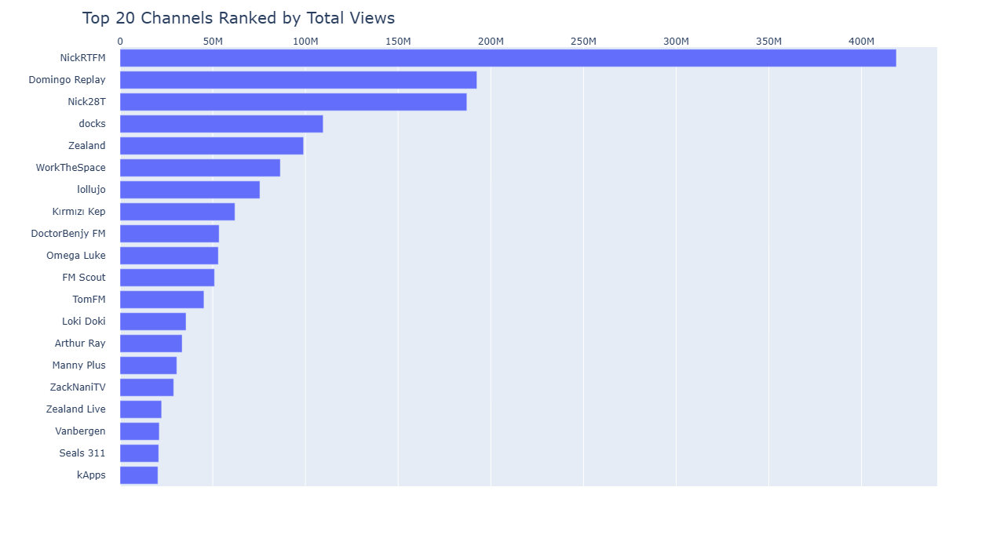

In [18]:
fig = px.bar(top_20_by_views_channels, y='channelTitle', x='viewCount', width=1800, height=700, hover_data={'channelTitle': False})

fig.update_traces(hovertemplate='<b>%{y}</b><br>%{x} Views')

fig.update_yaxes(
    title_text="",
    ticks= "outside", # https://stackoverflow.com/questions/63457187/plotly-how-to-adjust-the-space-between-axis-labels-and-plot-area to adjust axis spacing.b
    tickcolor="white",  # adjust color of the tick
    ticklen=15
)

fig.update_xaxes(title_text = "", ticklabelposition="outside top")

fig.update_layout(yaxis={'categoryorder':'total ascending'},
                  xaxis={'side': 'top'}, 
                  title=dict(text="Top 20 Channels Ranked by Total Views", font=dict(size=20), x=0.0825 ), # title of plot
                  showlegend=False                  
)

fig.show()

In [358]:
top_20_by_subs_channels[['channelTitle','subscriberCount','viewCount']]

,channelTitle,subscriberCount,viewCount
111,NickRTFM,879000,418781817
199,Nick28T,575000,187071013
190,Domingo Replay,432000,192489002
134,Zealand,371000,98962203
120,docks,244000,109545894
188,Ataberk Doğan,231000,18335886
22,Manny Plus,218000,30582749
311,Kırmızı Kep,216000,61944980
7,WorkTheSpace,211000,86429351
45,TomFM,208000,45237307


#### High Subscriber and High View Channels Overlap 

In [198]:
# How many of the Top 20 channels by subs are in the Top 20 channels by views
top_by_views_names = set(top_20_by_views_channels['channelTitle'])
top_by_subs_names = set(top_20_by_subs_channels['channelTitle'])
pprint.pprint(top_by_subs_names)
pprint.pprint(f"Union of top 20 views and top 20 subs channels: {top_by_subs_names & top_by_views_names}")

{'Arthur Ray',
 'Ataberk Doğan',
 'DK FALCON',
 'DoctorBenjy FM',
 'Domingo Replay',
 'FM Scout',
 'Kırmızı Kep',
 'Manny Plus',
 'Nick28T',
 'NickRTFM',
 'Omega Luke',
 'Seals 311',
 'Steini',
 'TomFM',
 'WorkTheSpace',
 'ZackNaniTV',
 'Zealand',
 'Zealand Live',
 'docks',
 'lollujo'}
("Union of top 20 views and top 20 subs channels: {'FM Scout', 'Manny Plus', "
 "'Arthur Ray', 'Zealand Live', 'Nick28T', 'NickRTFM', 'ZackNaniTV', "
 "'DoctorBenjy FM', 'WorkTheSpace', 'Omega Luke', 'Domingo Replay', 'lollujo', "
 "'docks', 'Kırmızı Kep', 'Zealand', 'Seals 311', 'TomFM'}")


**15** out of **20** of the channels are shared between the Top 20 subscriptions and views dataframes. For the channels that exist in both dataframes, the top five channels are exactly the same, with slight fluctuations in ranking position:
* NickRTFM
* Domingo Replay
* Nick28T
* docks
* Zealand


Three channels observed in the Top 20 Subscribers but are not seen in Top 20 Views:
* Ataberk Doğan
* DK FALCON
* Steini


Three channels unseen in the Top 20 Subscribers but found in Top 20 Views:
* kApps
* Vanbergen
* Loki Doki


#### Views and Subs Correlation Persists for Top 20 by Views Channels

Let's see if subscriber count has a relationship with the number of views a channel may have. 

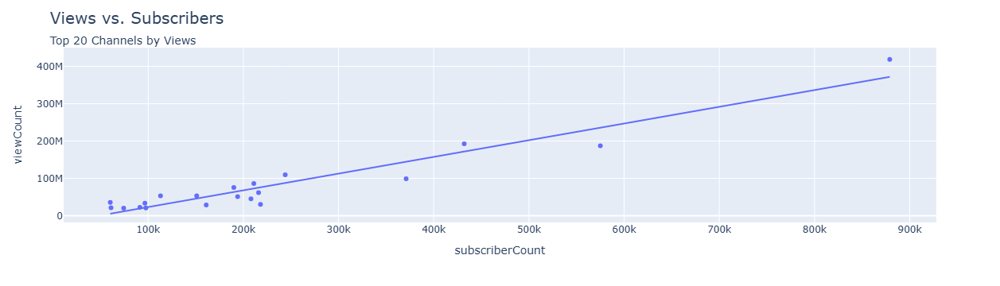

In [233]:
fig = px.scatter(top_20_by_views_channels, x='subscriberCount', y='viewCount', custom_data=['channelTitle'], trendline="ols")

fig.update_layout(title=dict(text="Views vs. Subscribers", font=dict(size=20), x=0.05),
                  title_subtitle_text="Top 20 Channels by Views",
                  
)

fig.update_traces(hovertemplate =
                "<b>%{customdata[0]}</b><br>%{x} Subscribers<br>%{y} Views" 
)
fig.show()

In [236]:
# Measure the Pearson's correlation between view count subscriber count for Top 20 channels ranked by views.
# Correlation coefficient for all channels == 0.951725507856501 
top_20_by_views_channels['viewCount'].corr(cleaned_fm_channels['subscriberCount'])

0.9587070452317683

## 4.4 Use of Keywords

To explore keyword relationships with other factors like views, likes, and comments, we extract data from our database and then merge it with the dataframe containing keyword information.

In [98]:
# Create a dataframe from database info with views, likes, comments
top_20_views_likes_comments_df = con.sql("""SELECT channelTitle, channelId, 
           SUM(viewCount) AS views, SUM(likeCount) AS likes,
           SUM(commentCount) as comments
           FROM videos
           GROUP BY channelTitle, channelID
           --ORDER BY views DESC, likes DESC
           ORDER BY channelId
        """).df()

In [105]:
top_20_views_likes_comments_df

,channelTitle,channelId,views,likes,comments
0,TomFM,UC0B_surYDWjLFNV7Iix3A3Q,45730563.00,1423936.00,80120.00
1,Zealand,UC0sHHy5A8VUTHE_ysXeCO2Q,99702506.00,3305240.00,185243.00
2,docks,UC2DPhH9Q_3Ah1nYqOi2Hm-w,109505498.00,5990327.00,479200.00
3,NickRTFM,UC7Wyuc7HQXbC70GGqVLl9mQ,419794974.00,12433038.00,998532.00
4,DoctorBenjy FM,UCCeR7BtDUauD9jlVT67epTg,53394233.00,3158391.00,191623.00
5,DK FALCON,UCF3C1Uy2-D6r6d2satSS1og,14002797.00,226349.00,11700.00
6,FM Scout,UCJPE-cqo-rFbvOIE-37G09g,51013030.00,865781.00,74873.00
7,Arthur Ray,UCNL-PktThtkU9V9mUSA6_xw,33598652.00,1588622.00,134815.00
8,WorkTheSpace,UCO3AJGFCk2fnB_P6RnwzSog,86801403.00,3276392.00,219051.00
9,lollujo,UCTAdC3L4oSqEVrqTtZb_xkg,75525550.00,4155597.00,230384.00


In [97]:
top_20_by_subs_channels[['channelId', 'kword_list_length']].sort_values('channelId')

,channelId,kword_list_length
45,UC0B_surYDWjLFNV7Iix3A3Q,24
134,UC0sHHy5A8VUTHE_ysXeCO2Q,30
120,UC2DPhH9Q_3Ah1nYqOi2Hm-w,13
111,UC7Wyuc7HQXbC70GGqVLl9mQ,0
21,UCCeR7BtDUauD9jlVT67epTg,10
95,UCF3C1Uy2-D6r6d2satSS1og,3
36,UCJPE-cqo-rFbvOIE-37G09g,41
8,UCNL-PktThtkU9V9mUSA6_xw,9
7,UCO3AJGFCk2fnB_P6RnwzSog,17
27,UCTAdC3L4oSqEVrqTtZb_xkg,28


### No Correlation with Keyword Usage and Engagement

In [106]:
# Merge the views/likes/comments dataframe with a truncated version of the Top 20 by subs dataframe.
# As both variables share `channelId` this process is simplified
merged_top_20_vlc_kwords_df = top_20_by_subs_channels[['channelId', 'kword_list_length']].sort_values('channelId').merge(top_20_views_likes_comments_df, on='channelId')

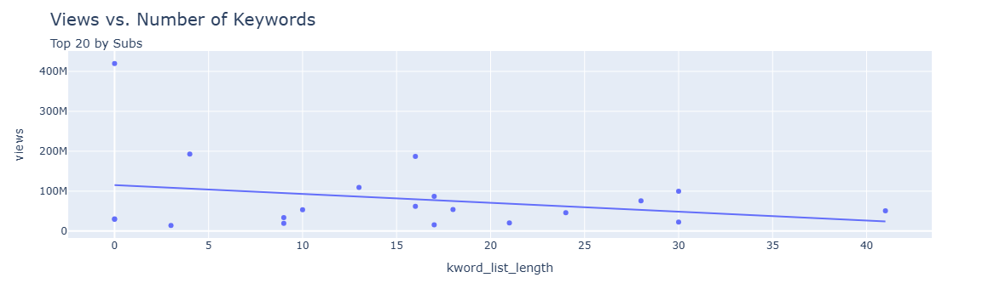

In [109]:
fig = px.scatter(merged_top_20_vlc_kwords_df, x='kword_list_length', y='views', custom_data=['channelTitle'], trendline="ols")

fig.update_layout(title=dict(text="Views vs. Number of Keywords", font=dict(size=20), x=0.05),
                  title_subtitle_text="Top 20 by Subs",
                  
)

fig.update_traces(hovertemplate =
                "<b>%{customdata[0]}</b><br>%{x} Keywords<br>%{y} Views" 
)
fig.show()

In [113]:
# Measure the Pearson's correlation between number of keywords and likes 
merged_top_20_vlc_kwords_df['kword_list_length'].corr(merged_top_20_vlc_kwords_df['views'])

-0.26685047006319523

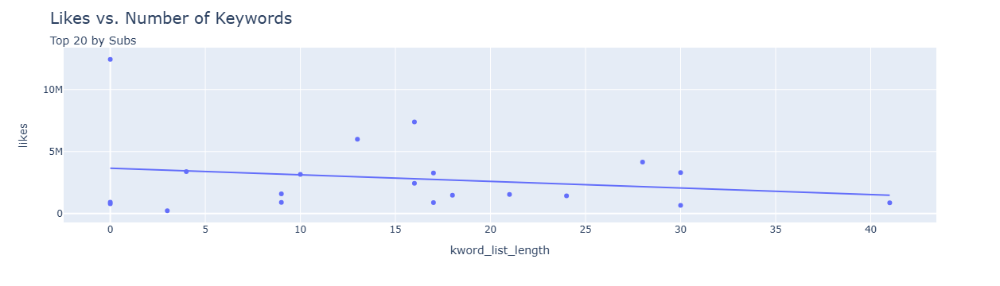

In [111]:
fig = px.scatter(merged_top_20_vlc_kwords_df, x='kword_list_length', y='likes', custom_data=['channelTitle'], trendline="ols")

fig.update_layout(title=dict(text="Likes vs. Number of Keywords", font=dict(size=20), x=0.05),
                  title_subtitle_text="Top 20 by Subs",
                  
)

fig.update_traces(hovertemplate =
                "<b>%{customdata[0]}</b><br>%{x} Keywords<br>%{y} Likes" 
)
fig.show()

In [112]:
# Measure the Pearson's correlation between number of keywords and likes 
merged_top_20_vlc_kwords_df['kword_list_length'].corr(merged_top_20_vlc_kwords_df['likes'])

-0.2061650950661923

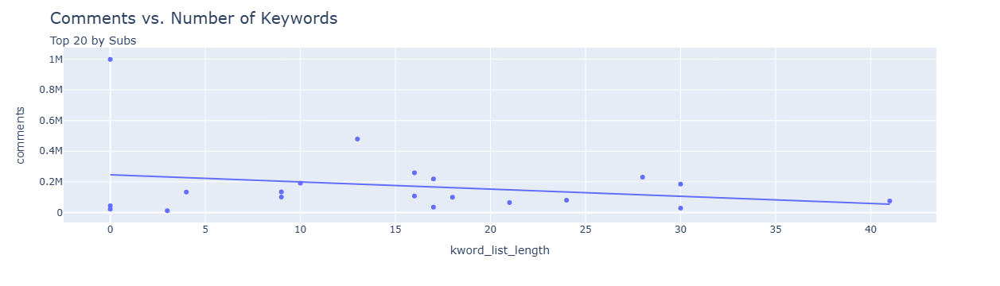

In [110]:
fig = px.scatter(merged_top_20_vlc_kwords_df, x='kword_list_length', y='comments', custom_data=['channelTitle'], trendline="ols")

fig.update_layout(title=dict(text="Comments vs. Number of Keywords", font=dict(size=20), x=0.05),
                  title_subtitle_text="Top 20 by Subs",
                  
)

fig.update_traces(hovertemplate =
                "<b>%{customdata[0]}</b><br>%{x} Keywords<br>%{y} Comments" 
)
fig.show()

In [114]:
# Measure the Pearson's correlation between number of keywords and likes 
merged_top_20_vlc_kwords_df['kword_list_length'].corr(merged_top_20_vlc_kwords_df['comments'])

-0.2392628966257299

Assessing the counts of views, likes, and comments versus the amount of keywords associated with a channel indicates weakly negative correlation across the board. The utility and importance of keywords may not have significant impact on engagement metrics for our dataset. There may be several reasons for this. Large subscriber channels may have loyal fanbases that actively engage content without the need to "locate" it; keywords have been touted by YouTube as a way to enhance search results for users of YouTube. There may be no need to "find" these channels if they have large subscriber bases. It may also be the case that keywords may have had higher importance in past iterations of the YouTube platform and there is less algorithmic reliance on these to assist content search and discoverability.

### What Percentage of Channels Use Keywords?

In [5]:
len(cleaned_fm_channels.query('kword_list_length > 0')) / len(cleaned_fm_channels)

0.7709251101321586

In [6]:
cleaned_fm_channels.query('kword_list_length > 0').describe()

,subscriberCount,viewCount,videoCount,kword_list_length
count,175.000000,1.750000e+02,175.000000,175.000000
mean,33023.657143,9.002508e+06,807.880000,18.925714
std,74581.892708,2.570372e+07,997.760246,11.573859
min,1040.000000,6.400000e+02,4.000000,1.000000
25%,2485.000000,2.525970e+05,139.000000,10.000000
50%,6490.000000,8.945630e+05,460.000000,18.000000
75%,25850.000000,4.156439e+06,1034.000000,27.000000
max,575000.000000,1.924890e+08,5962.000000,72.000000


**77%** of our monetizable FM channels use keywords of some sort to brand their channels with an average of **18.93** keywords per channel. This may be indicative of branding keywords having importance, but not being a dealbreaker in regards to monetization.

### What Languages do Content Creators Speak?

We use the [langdetect](https://pypi.org/project/langdetect/) Python module against the channel's branding description field to infer the native language of the content creator. This will let us know the lay of the land for the current space, as well as ideas for expanding content creation for lesser-known markets.

The [langdetect](https://pypi.org/project/langdetect/) module uses ISO-639-1 codes. For more information see this [Library of Congress document](https://www.loc.gov/standards/iso639-2/php/English_list.php) for more details.

In [14]:
# Create a custom function to wrap the language detection library, as this will fail on channels that have no description.
def language_detect(input):
    try:
        return detect(input)
    except:
        return None

# Create dataframe with only two columns
language_df = cleaned_fm_channels[['channelTitle','brandingDescription']]

# Execute the custom function
language_df['language'] = language_df['brandingDescription'].apply(lambda x: language_detect(x))

language_df['language_percentage'] 
# Output value counts for each language.
language_df['language'].value_counts()

language
en    109
tr     23
es     15
pt     14
fr     11
de      9
id      7
it      5
pl      4
el      3
hr      3
ko      2
ru      2
ar      2
ja      2
da      2
sv      1
uk      1
no      1
hu      1
ro      1
Name: count, dtype: int64

In [38]:
language_df['language'].value_counts().sum()

218

<Axes: ylabel='language'>

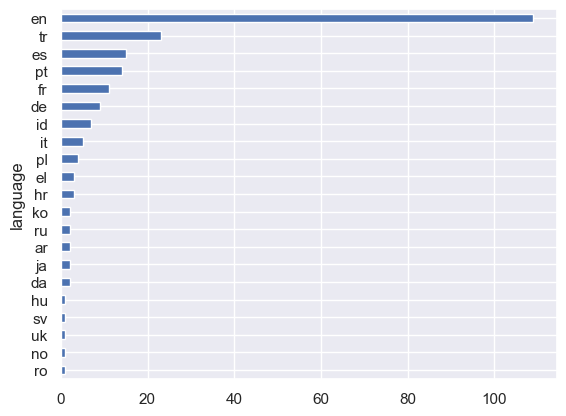

In [36]:
# Plot the value counts for each language
language_df['language'].value_counts().sort_values(ascending=True).plot.barh()

English (en) dominates our total content creator space, with it being exactly **50%** of all channels. Coming in at a far-removed, but strong  second place is Turkish (tr) with **10.55%** of channels. In third to sixth place:

* Spanish (es): **6.88%**
* Portuguese (pt): **6.42%**
* French (fr): **4.13%**
* German (de): **3.21%**

While these are European languages, it is not straightforward to assume that the content creators are based in Europe, given the linguistic spread each language may have through Mexico, South America, Asia, and Africa. We have no way to discern if the Portuguese spoken is from Portugal, Brazil, or other former colonial territorial holdings. French is spoken throughout Africa, Asia, and Oceania.

**81%** of the languages spoken are European in nature. It is a challenge to infer the geographic location of the language spoken by content creators as a proxy for their nation of origin.  Four of the 21 languages detected are Asian, Indonesian, Korean, Arabic, and Japanese detected. Korean and Japanese are strongly associated with being spoken only in their respective nations, but Arabic is spoken widely throughout Asia and Africa. Indonesians also speak Dutch, English, Javanese, and other languages. 

## 4.5 Playlist and Video Data Extraction

To analyze video performance, we obtain channel ID information to uncover associated channel playlists, comprising the entire video catalog for the content creator. Armed with a channel playlist, we can acquire obtaining video details, with the option to drill even further into comment and tag data associated with videos of interest. Since each API request, read or write, costs one credit, and there is a 10K limit per user, we have opted to focus our attention on the channels with the largest numbers of subscribers. We will not be procuring data for all of the cleaned Football Manager channels. 

### Playlist Data

#### Channel Output JSON Sample

An example of the JSON output we must process for detailed channel information is as follows:

Much of this information repeats from our previous API calls, but items such as `thumbnail_url` and `publishedAt` can provide interesting exploratory data options for future study.

In [299]:
# Use our Top 20 by subscribers to create a list of channel IDs
channel_ids = top_20_by_subs_channels['channelId']

# Create a dataframe capturing channel summary stats.
channel_stats = get_channel_stats(youtube, channel_ids)

In [27]:
channel_stats

,channelID,publishedAt,thumbnail_url,channelName,subscribers,views,totalVideos,playlistId
0,UCfAV0Lg4IPzZyRQq_Nh-5KA,2017-05-14 20:55:55+00:00,https://yt3.ggpht.com/-iExfmFHJgNMQfi2doXa2aIK...,Domingo Replay,432000,192875519,2500,UUfAV0Lg4IPzZyRQq_Nh-5KA
1,UCJPE-cqo-rFbvOIE-37G09g,2011-05-20 16:21:38+00:00,https://yt3.ggpht.com/6PJ9bTmRDln2vL_TyZV1cpb7...,FM Scout,194000,51019405,1884,UUJPE-cqo-rFbvOIE-37G09g
2,UCVzKJvNg6RAtwAwIJ9tflng,2020-09-30 11:23:19.409192+00:00,https://yt3.ggpht.com/OjoBHvM7-r8L7k8R2l95g1eZ...,Manny Plus,218000,30595588,533,UUVzKJvNg6RAtwAwIJ9tflng
3,UCz69o5GpwaZhNy6LAQolDYA,2019-05-08 15:48:00+00:00,https://yt3.ggpht.com/d3ls2rXQe1emK8imkYDy5mjU...,Omega Luke,151000,53275870,1126,UUz69o5GpwaZhNy6LAQolDYA
4,UCNL-PktThtkU9V9mUSA6_xw,2015-04-06 08:25:09+00:00,https://yt3.ggpht.com/0Em8Sw2v9fcKwgaiDsBa3GLE...,Arthur Ray,96800,33566654,3218,UUNL-PktThtkU9V9mUSA6_xw
5,UCuIyhergGAWTG1XBvIfW2PA,2016-05-18 11:51:28+00:00,https://yt3.ggpht.com/5-rUgcmzkPPteah6kWQcOBFy...,ZackNaniTV,161000,29021560,1800,UUuIyhergGAWTG1XBvIfW2PA
6,UC0B_surYDWjLFNV7Iix3A3Q,2017-01-14 12:54:58+00:00,https://yt3.ggpht.com/nlmHUPqUJgvNjPY4am6BVhjX...,TomFM,209000,45489086,1684,UU0B_surYDWjLFNV7Iix3A3Q
7,UC2DPhH9Q_3Ah1nYqOi2Hm-w,2007-02-22 16:16:37+00:00,https://yt3.ggpht.com/xEGlAuKjfV-e5wNVlhYPg_1M...,docks,244000,109585942,5968,UU2DPhH9Q_3Ah1nYqOi2Hm-w
8,UCO3AJGFCk2fnB_P6RnwzSog,2013-01-16 11:30:12+00:00,https://yt3.ggpht.com/sX_B0SxD2GTtGmiuvt3TfKuw...,WorkTheSpace,212000,86612482,3277,UUO3AJGFCk2fnB_P6RnwzSog
9,UCF3C1Uy2-D6r6d2satSS1og,2014-01-07 12:09:09+00:00,https://yt3.ggpht.com/bKRVjKdvrEn-9hQJypM3THef...,DK FALCON,158000,13619356,144,UUF3C1Uy2-D6r6d2satSS1og


### Video Data

#### Selenium and Chromedriver Implementation

Previous attempts of extracting video IDs based on playlist IDs resulted in exhaustion of the _entire_ daily YouTube query quota. This would occur even for channels with known, small amounts of total videos. We suspected a cascading error, where in the API request would amplify its desired results set to a larger number of API results than intended.

To work around the issue of acquiring video ID data, we use the  [selenium](https://pypi.org/project/selenium/) Python module and [Chrome Webdriver](https://sites.google.com/chromium.org/driver/) to obtain this information. To achieve this we will:
1. Install a `Chromedriver` binary on our local Windows machine using `winget` as described from the [winstall.app website](https://winstall.app/apps/Chromium.ChromeDriver).
2. Install the `selenium` Python module for development environment via `pip`.
3. Write code to launch a web browser and navigate to a channel's playlist URL.
4. Simulate browser scrolling behavior, capturing unique IDs for playlist videos after each virtual "scroll."
5. Store the video IDs in a dataframe for further analysis.
6. Repeat the process for each YouTube channel in our dataset.

Once armed with video IDs, combined with our channel playlist IDs, we can adjust how we use future API requests in a more granular fashion.

In [546]:
# Test code for accessing a web browser via Selenium.
driver.quit()  # Quit any previous browser sessions
driver = webdriver.Chrome()

# Navigate to a blank page before proceeding
driver.get("about:blank")
time.sleep(15)
# Now proceed with your task
playlist_url = "https://www.youtube.com/playlist?list=UUuIyhergGAWTG1XBvIfW2PA"
driver.get(playlist_url)

With our basic browser test acting as expected, we then implement a full function that will "simulate" a human browsing the playlist. We introduce a random wait between scrolls in order to appear "robotic" in our simulated scrolls.

In [23]:
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.action_chains import ActionChains
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
import time
import random

# Set a minimum and maximum time between page "scrolls."
random_scroll_pause = random.randint(5, 15)

def fetch_video_ids_selenium(playlist_url, channel_stats, max_scrolls=100, scroll_pause=random_scroll_pause):
    # Initialize WebDriver
    driver = webdriver.Chrome()  # Replace with the correct WebDriver if needed
    # Navigate to a blank page before proceeding
    driver.get("about:blank")
    time.sleep(5)
    driver.get(playlist_url)

    # Use a set to store unique video IDs
    video_ids = set()

    # Define the scroll count
    scroll_count = 0

    # Extract the playlist ID
    playlist_id = playlist_url.split("=")[1]

    # Obtain video count for the playlist in the channel_stats dataframe
    total_videos = channel_stats.query('playlistId == @playlist_id')['totalVideos'].values[0]

    # Estimate number of scrolls needed based on video count from previous testing.
    # This prevents the need to implement timeout and will accommodate situations
    # where content creators *remove* videos.
    
    max_scrolls = np.ceil((11/1084) * total_videos)

    try:
        # while (scroll_count < max_scrolls) and (len(video_ids) < total_videos):
        while (scroll_count < max_scrolls):
            # Wait for videos to render on the page
            time.sleep(scroll_pause)

            # Extract video elements
            video_elements = driver.find_elements(By.CSS_SELECTOR, 'a[href^="/watch?v="]')
            for element in video_elements:
                href = element.get_attribute('href')
                if href and 'watch' in href:
                    # The 'href' must be split to extract only the video ID, and not include 
                    # other parameters.
                    # I2v0Ib-pn8s&list=UUuIyhergGAWTG1XBvIfW2PA&index=87&pp=iAQB
                    video_id = href.split("v=")[1].split("&")[0]
                    # print(f"Adding video ID {video_id}")
                    video_ids.add(video_id)

            # Scroll down the page
            driver.execute_script("window.scrollTo(0, document.documentElement.scrollHeight);")
            scroll_count += 1

        # Echo final scroll count and videoto user.
        print(f"Scroll Count: {scroll_count}")
        print(f"Video count: {len(video_ids)}")
        print(5* "-----")

    finally:
        driver.quit()  # Ensure the browser is closed
    # Return the full list of discovered video IDs
    return list(video_ids)


#### Data Extraction Plan

1. Query the `yt_channels` table and extract the `channelId`, `videoCount` and `playlistId` columns for an individual channel.
2. Use `fetch_video_ids_selenium` will return a list of all video IDs associated with the playlist URL specified by the `playlistId`.
3. Using the list of video IDs, invoke the `get_video_details` function to obtain detailed video data.
4. Convert, cleanse, and transform the video data into a dataframe with correctly associated datatypes.
5. Store the dataframe contents into `DuckDB` database for future use.
6. Repeat the process for every channel in the `yt_channels` table.

In [770]:
# Query DuckDB for our relevant table columns
query_df = con.sql("""SELECT stats.channelId,
            stats.totalVideos,
            stats.channelName,
            stats.playlistId 
            FROM stats
            ORDER by totalVideos ASC
            --LIMIT 3
            """
        ).to_df()

query_df.head(5)

,channelId,totalVideos,channelName,playlistId
0,UCF3C1Uy2-D6r6d2satSS1og,144,DK FALCON,UUF3C1Uy2-D6r6d2satSS1og
1,UCumcHQNSdbEdKl-sEr2oVrA,419,Steini,UUumcHQNSdbEdKl-sEr2oVrA
2,UCVzKJvNg6RAtwAwIJ9tflng,533,Manny Plus,UUVzKJvNg6RAtwAwIJ9tflng
3,UCenmkBehf4szi5V-O6EoMaQ,559,Ataberk Doğan,UUenmkBehf4szi5V-O6EoMaQ
4,UC0sHHy5A8VUTHE_ysXeCO2Q,678,Zealand,UU0sHHy5A8VUTHE_ysXeCO2Q


#### Insert Data Into `videos` Table

To guide our browser automation to obtain video data, we rely on the current information in our `stats` database table to extract the channel playlist information. We then craft a playlist URL to feed into our automation function `fetch_video_ids_selenium`, capture the video details, then persist the video data to our local `DuckDB` database. The start and end time information are used to gauge the timing to extract video data, which can be used to estimate how much time it will take based on the count of videos a channel playlist may contain. 

In [ ]:
start_time = time.time()
# Query the yt_channels table and extract the channelId, videoCount and playlistId columns.
channel_query_df = con.sql("""SELECT stats.channelId,
                              stats.totalVideos,
                              stats.channelName,
                              stats.playlistId 
                              FROM stats
                              ORDER by totalVideos ASC
                              """
                          ).to_df()

# Set playlist URL prefix:
playlist_url_prefix = 'https://www.youtube.com/playlist?list='
# Convert the dataframe into a dict
channel_query_dict = channel_query_df.set_index('channelId').T.to_dict()
for channel_id,v  in channel_query_dict.items():
    # Create playlist URL
    playlist_url = playlist_url_prefix + v['playlistId']
    
    # Obtain video count to truncate video_details before DB insertion
    total_video_count = v['totalVideos']
    print(5 * "-----")
    print(f"Channel ID: {channel_id} Playlist URL: {playlist_url}")
    print(f"Video Count: {v['totalVideos']}")

    # Use the fetch_video_ids_selenium function to execute the Selenium/Webdriver browser automation code.
    video_ids = fetch_video_ids_selenium(playlist_url, channel_stats)

    # Get video details for the playlist
    video_details = get_video_details(youtube, video_ids)

    # Set the channelId column to our current channel.
    video_details['channelId'] = channel_id
    
    # Convert, cleanse, and transform the video data into a dataframe with correctly associated datatypes.
    numeric_cols =  ['viewCount', 'likeCount', 'favouriteCount', 'commentCount']    
    video_details = convert_cols_numeric(video_details, numeric_cols)

    # Truncate the video_details dataframe based on `total_video_count`. This is done since there are 
    # new videos produced by content creators after initial data collection.
    video_details = video_details.head(total_video_count)
    # Store the video_details dataframe contents into DuckDB database for future use.
    # "BY NAME" is a DuckDB convention not reliant on positional order of dataframe.
    con.sql("INSERT OR REPLACE INTO videos BY NAME SELECT * from video_details")

end_time = time.time()
print(f"Total processing time in minutes: {(end_time - start_time) / 60}")

#### Data Wrangling On The  `videos` Table

Persist the `videos` table to CSV, in case we need to recreate from scratch.

In [48]:
con.sql("COPY videos TO 'C:\\Users\\lover\\Documents\\Github\\youtube_api\\data\\text\\videos.csv'")

In [108]:
# Create new columns called for numeric_duration and publish_day_name on the `videos` table
con.sql("""ALTER TABLE videos ADD COLUMN numeric_duration DOUBLE""")
con.sql("""ALTER TABLE videos ADD COLUMN publish_day_name VARCHAR""")

In [109]:
con.sql("DESCRIBE videos")

┌──────────────────┬──────────────────────────┬─────────┬─────────┬─────────┬─────────┐
│   column_name    │       column_type        │  null   │   key   │ default │  extra  │
│     varchar      │         varchar          │ varchar │ varchar │ varchar │ varchar │
├──────────────────┼──────────────────────────┼─────────┼─────────┼─────────┼─────────┤
│ video_id         │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelTitle     │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ title            │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ description      │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ tags             │ VARCHAR[]                │ YES     │ NULL    │ NULL    │ NULL    │
│ publishedAt      │ TIMESTAMP WITH TIME ZONE │ YES     │ NULL    │ NULL    │ NULL    │
│ viewCount        │ DOUBLE                   │ YES     │ NULL    │ NULL    │ NULL    │
│ likeCount        │ DOUBLE     

#### Create `numeric_duration` Column

The duration is currently a VARCHAR, but we will need to convert this to numeric 
value for ease of analysis. The current column contents uses 'H' (hours), 'M' (minutes), and 'S' (seconds) in a
formatted string to communicate video running length. We create an SQL statement subsequently to translate the textual time information into a numeric quantity.

In [122]:
con.sql("SELECT duration from videos LIMIT 5")

┌──────────┐
│ duration │
│ varchar  │
├──────────┤
│ PT6M9S   │
│ PT7M43S  │
│ PT10M31S │
│ PT5M22S  │
│ PT6M36S  │
└──────────┘

In [111]:
# Create a dataframe to handle conversion from string to integer. DuckDB does not allow casting of this sort.
duration_df = con.sql("""SELECT video_id,
           REGEXP_EXTRACT(duration, '(\\d+)H', 1) AS hours,
           REGEXP_EXTRACT(duration, '(\\d+)M', 1) AS minutes,
           REGEXP_EXTRACT(duration, '(\\d+)S', 1) AS seconds
           FROM videos
           """).to_df()

# Set numeric columns
numeric_cols = ['hours', 'minutes', 'seconds']

# Use the numeric conversion function to change to column datatypes
duration_df = convert_cols_numeric(duration_df, numeric_cols)

# Convert NaNs to zero in place
duration_df.replace(np.NaN, 0, inplace=True)

# Create a new dataframe column that generates duration in seconds
duration_df['numeric_duration'] = (duration_df['hours'] * 3600) + (duration_df['minutes'] * 60) + duration_df['seconds']

In [112]:
duration_df.head(3)

,video_id,hours,minutes,seconds,numeric_duration
0,xOUQwlmNr_0,0.0,6.0,9.0,369.0
1,5O_mvDbB8tY,0.0,7.0,43.0,463.0
2,LICOkxZ9mBo,0.0,10.0,31.0,631.0


With a dataframe that has the correct number of seconds that a video has run set, we now need to copy the dataframe information back into the `videos` table.

In [115]:
# Create temporary table to store our duration_df information
con.execute("CREATE TEMP TABLE temp_duration_table (video_id VARCHAR, numeric_duration DOUBLE)")

# Insert dataframe information into temporary table
con.execute("INSERT INTO temp_duration_table SELECT video_id, numeric_duration FROM duration_df")

In [117]:
# Update the `numeric_duration` column in the `videos` table
# using 'video_id' as the common column
con.execute("""
            UPDATE videos
            SET numeric_duration = temp_duration_table.numeric_duration
            FROM temp_duration_table
            WHERE videos.video_id = temp_duration_table.video_id
            """)

In [121]:
con.sql("SELECT video_id, numeric_duration, duration FROM videos LIMIT 5") 

┌─────────────┬──────────────────┬──────────┐
│  video_id   │ numeric_duration │ duration │
│   varchar   │      double      │ varchar  │
├─────────────┼──────────────────┼──────────┤
│ xOUQwlmNr_0 │            369.0 │ PT6M9S   │
│ 5O_mvDbB8tY │            463.0 │ PT7M43S  │
│ LICOkxZ9mBo │            631.0 │ PT10M31S │
│ s_2hEAr5O3w │            322.0 │ PT5M22S  │
│ ViLyzbvEGfw │            396.0 │ PT6M36S  │
└─────────────┴──────────────────┴──────────┘

#### Create `publish_day_name` Column

DuckDB provides `strftime` and `strptime` functions can be used to convert between DATE / TIMESTAMP values and strings. This makes generating the day of the week videos are published easy to add to our dataset.

In [127]:
con.sql("""SELECT publishedAt,
           strftime(publishedAt, '%A') AS publish_day_name
           FROM videos
           LIMIT 3
        """)

┌──────────────────────────┬──────────────────┐
│       publishedAt        │ publish_day_name │
│ timestamp with time zone │     varchar      │
├──────────────────────────┼──────────────────┤
│ 2021-09-17 07:09:38-07   │ Friday           │
│ 2021-01-05 06:00:01-08   │ Tuesday          │
│ 2021-11-24 09:58:55-08   │ Wednesday        │
└──────────────────────────┴──────────────────┘

In [128]:
con.sql("""UPDATE videos
           SET publish_day_name = strftime(publishedAt, '%A')
        """)

In [129]:
con.sql("SELECT publishedAt, publish_day_name FROM videos LIMIT 3")

┌──────────────────────────┬──────────────────┐
│       publishedAt        │ publish_day_name │
│ timestamp with time zone │     varchar      │
├──────────────────────────┼──────────────────┤
│ 2021-09-17 07:09:38-07   │ Friday           │
│ 2021-01-05 06:00:01-08   │ Tuesday          │
│ 2021-11-24 09:58:55-08   │ Wednesday        │
└──────────────────────────┴──────────────────┘

#### Create `LikeRatio` and `CommentRatio` Columns

We enrich the `videos` table data by creating two new fields, `LikeRatio` and `CommentRatio`, that will measure like and comment ratios per 1000 views.

In [132]:
# Create new columns called for numeric_duration and publish_day_name on the `videos` table
con.sql("""ALTER TABLE videos ADD COLUMN LikeRatio DOUBLE""")
con.sql("""ALTER TABLE videos ADD COLUMN CommentRatio DOUBLE""")

In [133]:
# Create LikeRatio
con.sql("""UPDATE videos
           SET LikeRatio = (likeCount/viewCount) * 1000
        """)

In [134]:
# Create CommentRatio
con.sql("""UPDATE videos
           SET CommentRatio = (commentCount/viewCount) * 1000
        """)

In [135]:
con.sql("""SELECT LikeRatio, CommentRatio from videos LIMIT 3""")

┌────────────────────┬────────────────────┐
│     LikeRatio      │    CommentRatio    │
│       double       │       double       │
├────────────────────┼────────────────────┤
│ 17.511977531802412 │  4.791012720964811 │
│  8.393115376981314 │ 0.9546223570665684 │
│ 14.619133111054117 │ 0.8680726813581392 │
└────────────────────┴────────────────────┘

## 4.6 Comment Data

### Get Comments For Each Video

In [243]:
# Create comments database table
con.execute("CREATE TABLE comments (video_id VARCHAR, comments VARCHAR[], channelId VARCHAR)")

# Create index on the channeId column for the `stats` table.
con.execute("CREATE UNIQUE INDEX comments_idx ON comments (video_id);")

In [305]:
# Create start time
start_time = time.time()

# Set channel info to all channels. Slicing can be done if specific batches need to be executed.
channel_info = channel_stats[['channelID','channelName']]


for channel in channel_info['channelID']:
    # Create filter string for relation
    filter_string = f"channelId = '{channel}'"
    print(filter_string)

    # Generate dataframe for all videos related to a single channel
    channel_video_df = videos_relation.filter(filter_string).project('channelId','video_id').df()
    # print(channel_video_df)

    # Create video list
    channel_video_list = list(channel_video_df['video_id'])

    # Print length of video list 
    print(f"Length of video list {len(channel_video_list)}")

    # This dataframe only contains video_ids and comments
    comments_df = get_comments_in_videos(youtube, channel_video_list)

    # Set channel ID to current channel ID for all videos
    comments_df['channelId'] = channel

    
    # Update the DB table with comments data
    try:
        con.sql("INSERT OR REPLACE INTO comments BY NAME SELECT * FROM comments_df")
    except duckdb.duckdb.NotImplementedException as e:
        print(f"Encountered exception: {e}")

end_time = time.time()
elapsed_time_in_min = (end_time - start_time) / 60

channelId = 'UCq-9OD1pdQQ7e-ma1C_Iz9g'
Length of video list 2474
Could not get comments for video: uCGn_xy4Ieg
Could not get comments for video: tFz65ncNt1s
Could not get comments for video: uIaW2lPf4Ro


In [25]:
# Execute JOIN operation on the `videos` and `comments` tables
con.sql("""SELECT COUNT(v.video_id) 
           FROM videos AS v
           RIGHT JOIN comments AS c
           ON v.video_id = c.video_id
           LIMIT 1""")
# con.sql("DELETE FROM comments")
# con.sql("SELECT * FROM comments")

┌───────────────────┐
│ count(v.video_id) │
│       int64       │
├───────────────────┤
│             19188 │
└───────────────────┘

## 4.7 Combined Content Engagement Analysis 

### Analysis Scope

Unless specified otherwise, we limit the scope of our discussion to the top channels ranked by the number of subscribers. Findings for this subset of creators may not necessarily apply to all possible channels producing Football Manager content.

### The `videos` Table

To measure the impact of likes and comments on views, we will utilize a  `DuckDB` relational API object to convert the table data into Pandas dataframe that we can query and whose data we can plot and analyze.

### Variety Streamers in Dataset Present Challenges

Many creators in our dataset do variety streaming of games other than Football Manager, meaning we rely on domain knowledge on whether we should include or exclude specific portions of all the information available to us. The difficulty with this is that even creators that primarily stream Football Manager do also create content in other games. We may need to filter videos and possibly completely remove creators that may have relevance to our problem domain. 

We will utilize an SQL query to copy data into newer table, removing videos associated with non-FM games as gleaned from the video description. We will be aggressive and comprehensive with our query parameters. This may cause false negatives related to truly FM-related content lacking the identification criteria set out in the query, but we will need to remove the bulk of any FIFA/FC, UFL, or PES content from the larger creators such as `NickRTFM` to ensure we are discussing Football Manager content in our analysis.

We also completely remove the creator channel `DK Falcon` as this channel appears to be AI-generated content by appearance and form.

In [419]:
# Create dataframe with cleaned video set
cleaned_videos_df = con.sql("""WITH fifa_videos (video_id)
            AS (
                SELECT video_id FROM VIDEOS
                WHERE description ILIKE '%fifa%'
                OR description ILIKE '%fc24%'
                OR description ILIKE '%fc25%'
                OR description ILIKE '%UFL%'
                OR description ILIKE '%EA%'
                OR description ILIKE '%PES%'

                )
            
            -- SELECT channelTitle,tags  FROM videos
            -- SELECT count(video_id)
            -- SELECT * 
            -- SELECT channelTitle, count(video_id) AS video_count

            -- CREATE TABLE videos_cleaned AS
            SELECT * 
            FROM videos
            WHERE video_id NOT IN (SELECT video_id FROM fifa_videos)
            AND channelTitle != 'DK FALCON'  -- Exclude 'DK FALCON' 
            AND description ILIKE '%Football Manager%'
            OR description ILIKE '%footballmanager%'
            OR description ILIKE '%fm24%'  
            OR description ILIKE '%fm23%'  
            OR description ILIKE '%fm22%'  
            OR description ILIKE '%fm21%'  
            OR description ILIKE '%fm20%'  
            OR description ILIKE '%fm19%'  
            OR description ILIKE '%fm18%'  
            OR description ILIKE '%fm17%'  
            OR description ILIKE '%fm16%'  
            OR description ILIKE '%fm15%'  
            OR description ILIKE '%fm14%'  
            OR description ILIKE '%fm13%'  
            OR description ILIKE '%fm12%'  
            OR title ILIKE '%fm24%'
            OR title ILIKE '%fm23%'  
            OR title ILIKE '%fm22%'  
            OR title ILIKE '%fm21%'  
            OR title ILIKE '%fm20%'  
            OR title ILIKE '%fm19%'  
            OR title ILIKE '%fm18%'  
            OR title ILIKE '%fm17%'  
            OR title ILIKE '%fm16%'  
            OR title ILIKE '%fm15%'  
            OR title ILIKE '%fm14%'  
            OR title ILIKE '%fm13%'  
            OR title ILIKE '%fm12%' 
            OR title ILIKE '%footballmanager%'
            OR title ILIKE '%Football Manager%'

            -- Filter and aggregation
            -- GROUP BY channelTitle
            -- ORDER BY video_count DESC
            -- ORDER BY viewCount DESC
            -- LIMIT 25
        """
       ).df()

len(cleaned_videos_df)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

19830

In [423]:
# Create new database table based on cleaned_videos_df
con.sql("CREATE TABLE videos_cleaned AS SELECT * FROM cleaned_videos_df") 

# Add indexes for faster searches and join operations.
# Create index on the video_id column for the `videos_cleaned` table.
con.execute("CREATE UNIQUE INDEX video_id_idx ON videos_cleaned (video_id);")


# Output count of cleaned video records
con.sql("SELECT COUNT(*) FROM videos_cleaned")

┌──────────────┐
│ count_star() │
│    int64     │
├──────────────┤
│        19830 │
└──────────────┘

### Create Videos Relation Object

`DuckDB` provides a [Relational API](https://duckdb.org/docs/api/python/relational_api.html) to provide a flexible and convenient method of representing and executing database queries. Using this in conjunction with the `df()` function means we can easily extract and do data manipulation.


In [120]:
# Create a DuckDB "relation" object to surface data from `videos_cleaned` table.
videos_relation = con.table('videos_cleaned')

In [121]:
# Create comprehensive df for views, comments, likes, and running time.
video_data_df = videos_relation.project('likeCount', 'viewCount', 'commentCount','numeric_duration').df()

### Summary Stats for Videos

In [122]:
video_data_df.describe()

,likeCount,viewCount,commentCount,numeric_duration
count,19825.00,19830.00,19821.00,19830.00
mean,1002.22,26848.09,61.40,1794.00
std,1344.54,48876.90,83.83,2599.30
min,0.00,0.00,0.00,0.00
25%,284.00,6385.50,19.00,852.00
50%,604.00,13456.50,40.00,1157.00
75%,1216.00,27899.25,73.00,1636.75
max,26967.00,1393911.00,2477.00,39528.00


We augment the information provided by the `describe()` to give a sense of the general skew of data due to small amounts of extreme values by displaying the 90th, 95th, and 99th percentile values of each factor. 

In [497]:
for metric in video_data_df.columns:
    print(f"Metric: {metric}")
    print("================")
    print(f"90th Percentile: {video_data_df[metric].quantile(0.90):.2f}")
    print(f"95th Percentile: {video_data_df[metric].quantile(0.95):.2f}")
    print(f"99th Percentile: {video_data_df[metric].quantile(0.99):.2f}")
    print()

Metric: likeCount
90th Percentile: 2202.00
95th Percentile: 3151.60
99th Percentile: 6649.84

Metric: viewCount
90th Percentile: 57289.80
95th Percentile: 93320.15
99th Percentile: 237149.41

Metric: commentCount
90th Percentile: 128.00
95th Percentile: 187.00
99th Percentile: 374.00

Metric: numeric_duration
90th Percentile: 2696.00
95th Percentile: 4333.20
99th Percentile: 15321.71



All of the engagement metrics have _extreme_ amounts of skew present. The "outliers" will be of interest to us later, since these observations are indicative of content with the highest engagement.

### Pairplot Analysis of Engagement Metrics

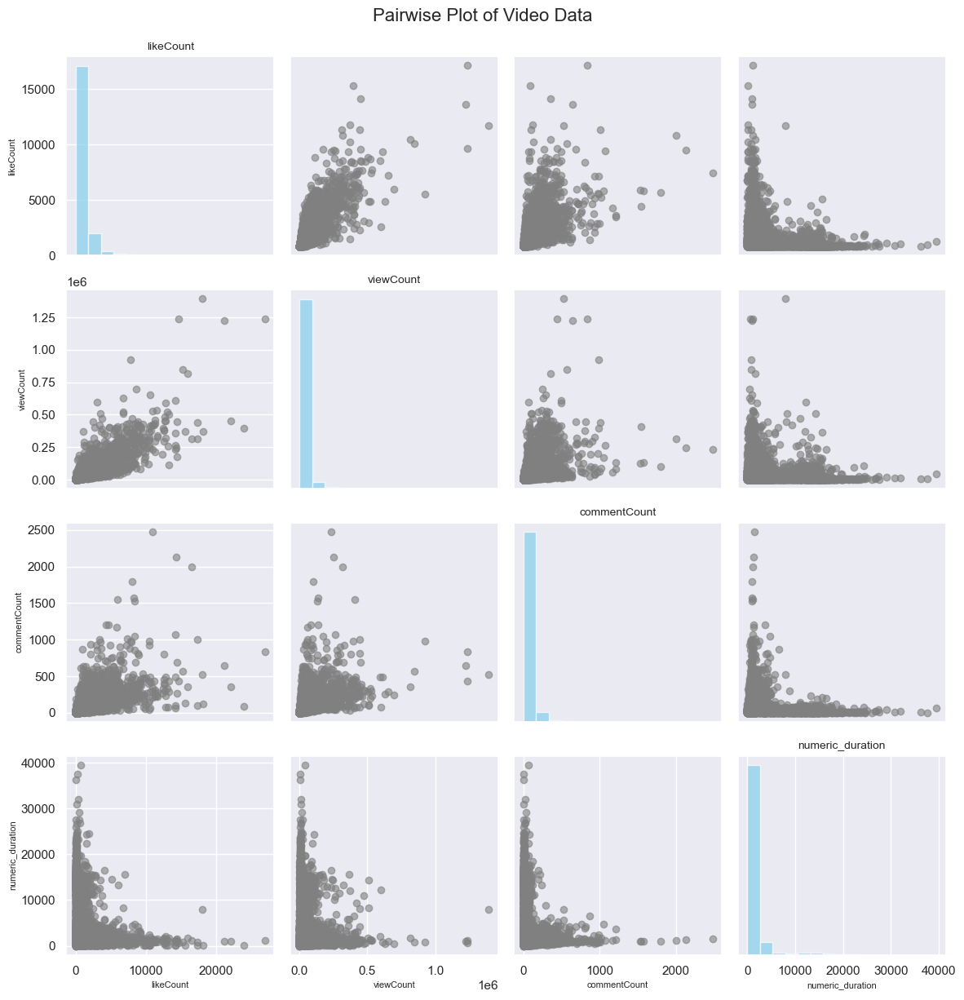

In [440]:
# Drop any NaN values to avoid plotting issues
my_video_data_df = video_data_df.dropna()

# Create pairwise plots
columns = my_video_data_df.columns
n_cols = len(columns)

fig, axes = plt.subplots(n_cols, n_cols, figsize=(12, 12))

for i, col_x in enumerate(columns):
    for j, col_y in enumerate(columns):
        ax = axes[i, j]
        
        if i == j:
            # Plot histogram on the diagonal
            ax.hist(video_data_df[col_x], bins=15, color='skyblue', alpha=0.7)
            ax.set_title(f'{col_x}', fontsize=10)
        else:
            # Plot scatter plots for off-diagonal
            ax.scatter(my_video_data_df[col_y], my_video_data_df[col_x], alpha=0.6, color='gray')
        
        # Remove ticks for cleaner visualization
        if i < n_cols - 1:
            ax.set_xticks([])
        else:
            ax.set_xlabel(col_y, fontsize=8)
        
        if j > 0:
            ax.set_yticks([])
        else:
            ax.set_ylabel(col_x, fontsize=8)

# Adjust layout for better spacing
plt.tight_layout()
plt.suptitle("Pairwise Plot of Video Data", fontsize=16, y=1.02)
plt.show()

#### Correlation

We use a Seaborn plotting library heatmap to present correlation between the columns of the `video_data_df` we recently created. Darker colors indicate greater correlation between the intersection of factors in the plot, while lighter colors indicate weak, or no correlation between the two intersection factors.

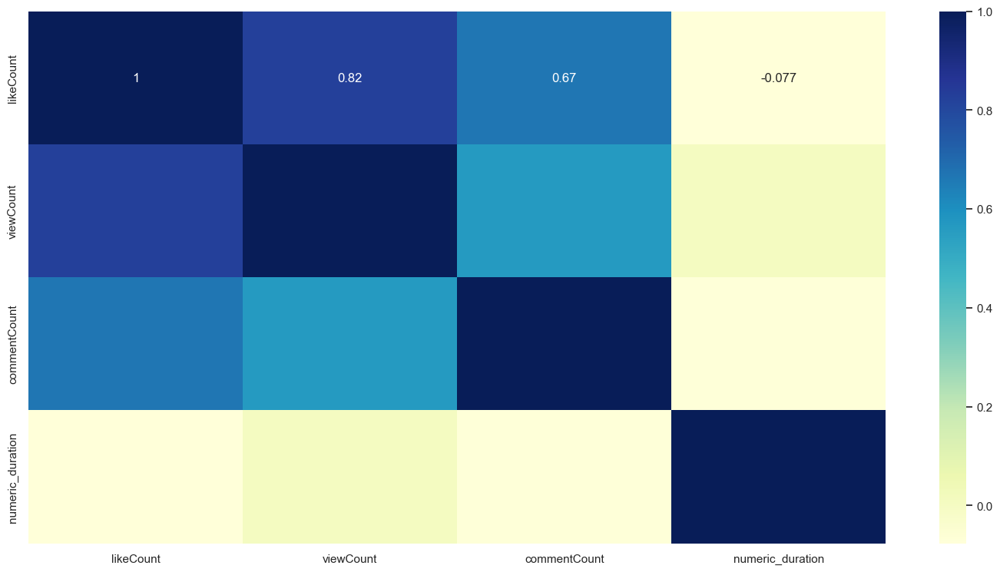

In [474]:
# Plotting correlation heatmap
corr_plot = sns.heatmap(video_data_df.corr(numeric_only=True), cmap="YlGnBu", annot=True)

# Displaying heatmap
plt.show()

#### Insights and Findings

* All distributions are highly skewed, with clusters of each metric found on the lower end and smaller number of outliers with extremely high values.

* Likes
    * There is a strong correlation between likes and views, with a correlation coefficient of **0.82**. This stands to reason as a person would need to view a video in order to consider hitting the like button. The distribution of likes and views has a large cluster at the lower end, with outliers with high counts skewing the distribution.
    * A modest correlation between likes and comments is present, with a correlation coefficient of **0.67**, indicating videos with higher likes generally tend to provoke more comments.
    * There is no apparent correlation between the amount of likes and the running time for a video.
* Views
    * A moderately positive correlation exists between views and comments, though this relationship is slighty weaker than likes versus comments, standing at **0.56**.
    * No correlation is found between between running time and views.
* Comments
    * No correlation between running time and the number of comments exists.


## 4.8 Seasonality 

To assess if seasonality plays a role in video engagement for top-ranked Football Manager YouTube channel, we analyze if specific time periods during the year, months, or days of the week have any relationship to video engagement behavior. For this analysis, we will interact with Pandas' time series functionality in conjunction with the timestamp data bundled with our data.

In [498]:
# Create separate dataframes that will be used to create Time Series objects.

likecount_df = videos_relation.project('video_id', 'likeCount','publishedAt').df()
viewcount_df = videos_relation.project('video_id', 'viewCount','publishedAt').df()
commentcount_df = videos_relation.project('video_id', 'commentCount','publishedAt').df()

# To properly surface the data via time series, sort the values by the 
# timestamp to ensure the dates increase monotonically.

likecount_df = likecount_df.sort_values('publishedAt')
viewcount_df = viewcount_df.sort_values('publishedAt')
commentcount_df = commentcount_df.sort_values('publishedAt')

In [500]:
# Create time series objects by indexing the database to the `publishedAt` timestamp.
likecount_ts = pd.Series(likecount_df['likeCount'].to_list(), index=likecount_df['publishedAt'])
viewcount_ts = pd.Series(viewcount_df['viewCount'].to_list(), index=viewcount_df['publishedAt'])
commentcount_ts = pd.Series(commentcount_df['commentCount'].to_list(), index=commentcount_df['publishedAt'])

# Name the series
likecount_ts.name = "Likes"
viewcount_ts.name = "Views"
commentcount_ts.name = "Comments"

After creating our time series data frames, the `resample` function to enable aggregation and processing of the data at differenvt time frequencies. We are interested in processing the data over monthly periods to generate plots to visualize any potential engagement trends.

In [501]:
# View the aggregated resampling data for a one year period.
likecount_ts["2020-01":"2020-12"].resample("M", kind="period").sum()

publishedAt
2020-01   278690.00
2020-02   197114.00
2020-03   231982.00
2020-04   261552.00
2020-05   285142.00
2020-06   216679.00
2020-07   165795.00
2020-08   154303.00
2020-09   109680.00
2020-10    79866.00
2020-11   402201.00
2020-12   349906.00
Freq: M, Name: Likes, dtype: float64

The Football Manager game release cycle may the impact the timing of video publication and also affect the topics content creators within their videos. The release dates can be extracted from the [Football Manager Wikipedia page](https://en.wikipedia.org/wiki/Football_Manager). 

Externalized factors such as the COVID-19 pandemic may also impact YouTube viewing patterns. We include dates for both events to subsequently annotate our generated time series plots. Since our truncated set of videos has its earliest publish dates in 2013, we omit these release dates from subsequent plotting via code comment.

### Game Release Dates

In [660]:
# Worldwide release dates for Football Manager games and pandemic declarations
release_dates = {
    # "FM12": "2011-11-21",
    # "FM13": "2012-11-02",
    "FM14": "2013-10-31",
    "FM15": "2014-11-07",
    "FM16": "2015-11-13",
    "FM17": "2016-11-04",
    "FM18": "2017-11-07",
    "FM19": "2018-11-02",
    "FM20": "2019-11-19",
    "FM21": "2020-11-24",
    "FM22": "2021-11-09",
    "FM23": "2022-11-08",
    "FM24": "2023-11-06" 
}

# Dates of official Pandemic declarations
pandemic_declarations = {
    "UK COVID Start": "2020-03-23",
    "US COVID Start": "2020-03-13"
}

### Views 

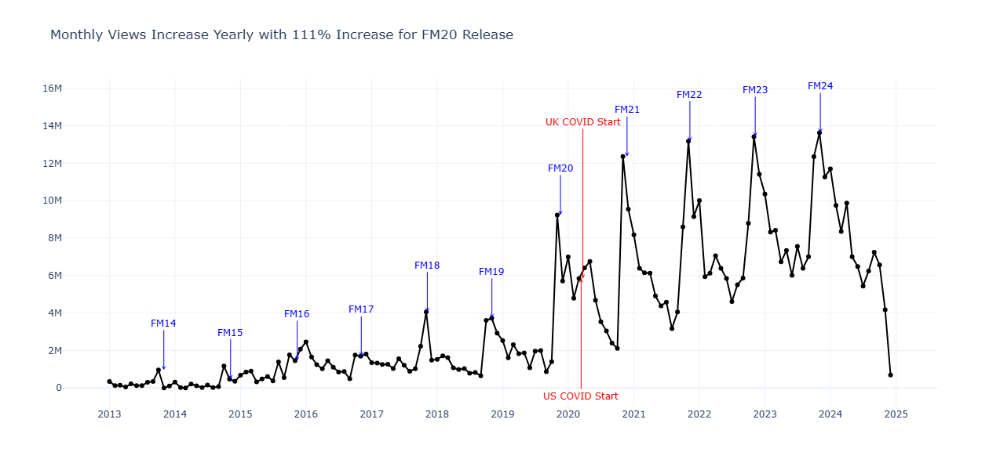

In [521]:
# Resample Views count data
viewcount_resampled = viewcount_ts.resample("M", kind="period").sum()

# Create the base line plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=viewcount_resampled.index.to_timestamp(),
    y=viewcount_resampled.values,
    mode='lines+markers',
    name='Views',
    line=dict(color='black'),
    hovertemplate='%{x|%B %Y}<br>Views: %{y}<extra></extra>'  # Custom hover format
))

# Add annotations for Football Manager releases
for game, date in release_dates.items():
    date_ts = pd.Timestamp(date)
    # if date_ts in viewcount_resampled.index.to_timestamp():
    y_value = viewcount_resampled.loc[pd.Period(date, freq="M")]
    fig.add_annotation(
        x=date_ts,
        y=y_value,
        text=game,
        showarrow=True,
        arrowhead=3,
        arrowcolor='blue',
        font=dict(color='blue', size=12),
        ax=0,
        ay=-60  # Arrow pointing downward slightly
        )

# Add annotations for pandemic declarations
for event, date in pandemic_declarations.items():
    date_ts = pd.Timestamp(date)
    #if date_ts in viewcount_resampled.index.to_timestamp():
    y_value = viewcount_resampled.loc[pd.Period(date, freq="M")]
    
    # Conditionally position annotation
    if event == "UK COVID Start":
        fig.add_annotation(
            x=date_ts,
            y=y_value,
            text=event,
            showarrow=True,
            arrowhead=3,
            arrowcolor='red',
            font=dict(color='red', size=12),
            ax=0,
            ay=-200  # Float higher above
        )
    else:  # US COVID Start
        fig.add_annotation(
            x=date_ts,
            y=y_value,
            text=event,
            showarrow=True,
            arrowhead=3,
            arrowcolor='red',
            font=dict(color='red', size=12),
            ax=0,
            ay=150  # Float below with upward arrow
        )

# Update layout
fig.update_layout(
    title="Monthly Views Increase Yearly with 111% Increase for FM20 Release",
    # xaxis_title="Year",
    # yaxis_title="Views",
    xaxis=dict(
        tickformat="%Y",  # Format the tick labels to display the year
        tickmode="linear",  # Ensure ticks are at regular intervals
        dtick="M12",  # Set the tick interval to every 12 months (1 year)
    ),
    template="plotly_white",
    showlegend=False,
    width=900,
    height=600
)

fig.show()


Prior to the FM20, we see rises in monthly views both before and immediately after the game release date. After FM20, we observe that the maximum monthly views for that year coincide with the same month as the FM release date. The "drop-off" after release dates may be indicative of viewers playing the game, or being preoccupied with end of the year activities impacting their ability and desire to watch Football Manager content.

#### 2020 as a Breakout Year for Engagement

It was initially suspected that pandemic measures may have indirectly provoked increases in viewership for the FM20 release, but the increase is observed _prior_ to any pandemic declarations in this regard. To explore this further, we looked at _all_ YouTube channels appearing to generate Football Manager content to see if the channel creation dates and times might explain the surge in views coinciding with the FM20 game release.

To facilitate this, we needed a simplistic wrapper function to break the channel list into chunks so that the YouTube API would not break due to limitations on query length. 

In [315]:
# Create a stats wrapper function since the YouTube API call will fail if we 
# submit requests with too many channels at any one time. We split the list
# into chunks.

def stats_wrapper(list_o_junk):
    # Submit 10 channels at a time
    chunk_amount = 10
    list_length = len(list_o_junk)

    chunks = int(list_length / chunk_amount)
    rem = list_length % chunk_amount
    
    # Create dataframe to store and append results to.
    temp_df = pd.DataFrame()

    print(f"List length: {list_length}")
    start_index = 0
    final_index = chunk_amount

    # We will use python slicing to chunk our data, the first index is the
    # starting value, while the final index is non-inclusive.
    print(f"Start {start_index}")
    print(f"End {final_index}")

    
    # Process the list until we reach its full length
    while(final_index < list_length):
        # Initialize our starting slicing.
        temp_list = list_o_junk[start_index:final_index]
        print(f"Temp List:\n\n{temp_list}")
        try:
            # Get YouTube data
            result  = get_channel_stats(youtube, temp_list)
            
            # Append to current dataframe
            temp_df = pd.concat([temp_df, result], sort=False, ignore_index=True)

            # Echo output
            print(f"Successful concat with this list")
            print(temp_list)
        except:
            # If anything fails, print out what portion of list failed 
            # and continue processing.
            print(f"Failed with this list")
            print(temp_list)
            pass

        # Reset our starting index
        start_index = final_index
        
        # Increment to change final index
        final_index = start_index + 10

        # Output data for sanity checking
        print(f"Start {start_index}")
        print(f"End {final_index}")
        print()
    
    return temp_df

In [ ]:
all_fm_channels['channelId']

all_fm_channel_stats = stats_wrapper(all_fm_channels['channelId'])

In [311]:
# Create a 'year' column to assist us in later visualization.
all_fm_channel_stats['year'] = all_channel_stats['publishedAt'].apply(return_pub_year)
all_fm_channel_stats['year'].value_counts()

year
2021.00    26
2022.00    24
2020.00    23
2023.00    22
2017.00    13
2015.00    13
2019.00    13
2011.00    13
2013.00    12
2016.00    11
2018.00    10
2014.00     9
2024.00     7
2012.00     6
2010.00     5
2006.00     4
2007.00     3
2009.00     2
2008.00     1
Name: count, dtype: int64

publishedAt
2006     5
2007     4
2008     4
2009     5
2010     5
2011    19
2012    12
2013    27
2014    13
2015    24
2016    16
2017    22
2018    15
2019    19
2020    43
2021    46
2022    48
2023    84
2024    87
Freq: A-DEC, dtype: int64

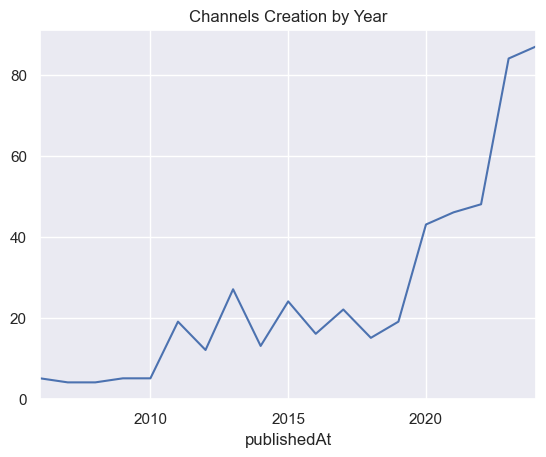

In [313]:
# Create time series objects by indexing the database to the `publishedAt` timestamp.
all_fm_channels_ts = pd.Series(1, index=all_fm_channel_stats['publishedAt'])

# Echo time series data plain
all_fm_channels_ts

# Resample by year, summing up all channel creations, and plot
all_fm_channels_ts.resample("Y", kind="period").sum().plot(title="Channels Creation by Year")
all_fm_channels_ts.resample("Y", kind="period").sum()

We can observe that new YouTube channel creations skyrocketed in 2020, but were at a steady rate stable prior to this year. This surge in views in November 2019, for the FM20 game release speaks to other factors in play:

* New game features increasing gaming community interest. [FM20 Feature Announcement Blog](https://community.sports-interactive.com/forums/topic/492481-football-manager-2020-feature-announcement-blogs/) Notably, enhanced graphics rendering and more extensive player development ecosystem. 
* Increased content creation and community engagement, leading to organic rise in game interest and in content consumption.
* Increased streaming activity on YouTube and Twitch platforms providing a feedback loop of content creation, content, and community engagment

#### Percent Change in Views Trending Downward 

We now turn attention the percent change in views over a yearly basis. We want to know if the yearly cumulative views for Football Manager videos has been rising or falling and at what rate this occurs.

In [522]:
viewcount_resampled_yearly_pct_change

publishedAt
2013      NaN
2014     3.09
2015   290.54
2016    43.54
2017    13.88
2018     9.53
2019    58.29
2020   111.23
2021    15.22
2022    15.31
2023    15.85
2024   -20.73
Freq: A-DEC, Name: Views, dtype: float64

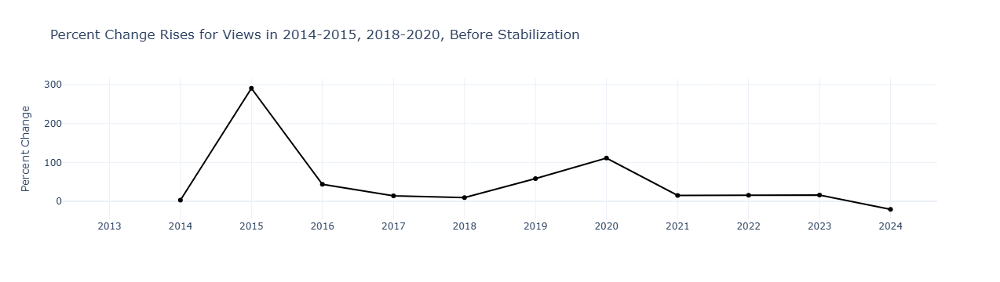

In [523]:
viewcount_resampled_yearly_pct_change = viewcount_ts.resample("Y", kind="period").sum().pct_change() * 100 

# Create the base line plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=viewcount_resampled_yearly_pct_change.index.to_timestamp(),
    y=viewcount_resampled_yearly_pct_change.values,
    mode='lines+markers',
    name='Views',
    line=dict(color='black'),
    hovertemplate='%{x|%Y}<br>Percent Change: %{y:.2f}%<extra></extra>'  # Custom hover format
))

fig.update_layout(
    title ="Percent Change Rises for Views in 2014-2015, 2018-2020, Before Stabilization",
    template ="plotly_white",
    yaxis_title = "Percent Change",
    xaxis = dict(
        tickformat="%Y",  # Format the tick labels to display the year
        tickmode="linear",  # Ensure ticks are at regular intervals
        dtick="M12",  # Set the tick interval to every 12 months (1 year)
    )
)

From 2020 onward, there is stability in the perecent increase in views year over year, but an overall trend for the decade in a general reduction in percent change. There are several possible explanations for this downward trend. Regular viewers of FM content and channel subscribers may simply be viewing less content, potential new viewers of this content are not finding the content they desire, or being suggested the content via the YouTube algorithm. This trend may also be indicative of market saturation. There may no longer be signficant new or recurring viewer communities to attract to Football Manager videos and increase the view amount year over year. The lack of receptive audiences to increase the percent change in views could be related to circumstances surrounding the quality of the Football Manager game releases, the quality and quantity of content created for specific game releases, or organically lost interest in specific creators in the space. 

A decrease in percent change for yearly views does _not_ necessarily mean reduction in YouTube channel subscribers. Subscribing to a channel has a very "set it and forget it" paradigm, meaning individuals are provided notifications of new content, may choose not to consume it, but never take steps to no longer subscribe to channels. Individual creators should consult their personal channel metrics to see how much churn is in play for their respective communities.

### Likes

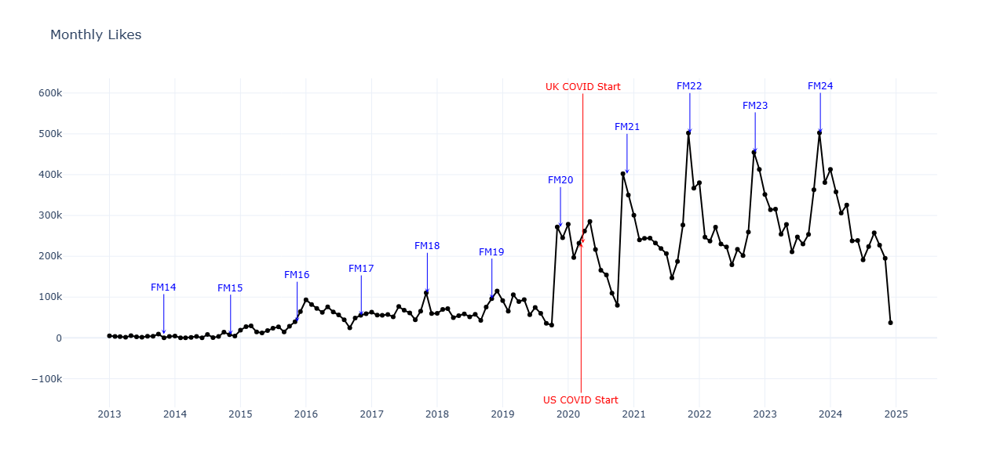

In [525]:
# Resample Likes count data
likecount_resampled = likecount_ts.resample("M", kind="period").sum()

# Create the base line plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=likecount_resampled.index.to_timestamp(),
    y=likecount_resampled.values,
    mode='lines+markers',
    name='Likes',
    line=dict(color='black'),
    hovertemplate='%{x|%B %Y}<br>Likes: %{y}<extra></extra>'  # Custom hover format
))

# Add annotations for Football Manager releases
for game, date in release_dates.items():
    date_ts = pd.Timestamp(date)
    # if date_ts in likecount_resampled.index.to_timestamp():
    y_value = likecount_resampled.loc[pd.Period(date, freq="M")]
    fig.add_annotation(
        x=date_ts,
        y=y_value,
        text=game,
        showarrow=True,
        arrowhead=3,
        arrowcolor='blue',
        font=dict(color='blue', size=12),
        ax=0,
        ay=-60  # Arrow pointing downward slightly
        )

# Add annotations for pandemic declarations
for event, date in pandemic_declarations.items():
    date_ts = pd.Timestamp(date)
    #if date_ts in likecount_resampled.index.to_timestamp():
    y_value = likecount_resampled.loc[pd.Period(date, freq="M")]
    
    # Conditionally position annotation
    if event == "UK COVID Start":
        fig.add_annotation(
            x=date_ts,
            y=y_value,
            text=event,
            showarrow=True,
            arrowhead=3,
            arrowcolor='red',
            font=dict(color='red', size=12),
            ax=0,
            ay=-200  # Float higher above
        )
    else:  # US COVID Start
        fig.add_annotation(
            x=date_ts,
            y=y_value,
            text=event,
            showarrow=True,
            arrowhead=3,
            arrowcolor='red',
            font=dict(color='red', size=12),
            ax=0,
            ay=200  # Float below with upward arrow
        )

# Update layout
fig.update_layout(
    title="Monthly Likes",
    # xaxis_title="Date",
    xaxis=dict(
        tickformat="%Y",  # Format the tick labels to display the year
        tickmode="linear",  # Ensure ticks are at regular intervals
        dtick="M12",  # Set the tick interval to every 12 months (1 year)
    ),
    template="plotly_white",
    showlegend=False,
    width=900,
    height=600
)

fig.show()


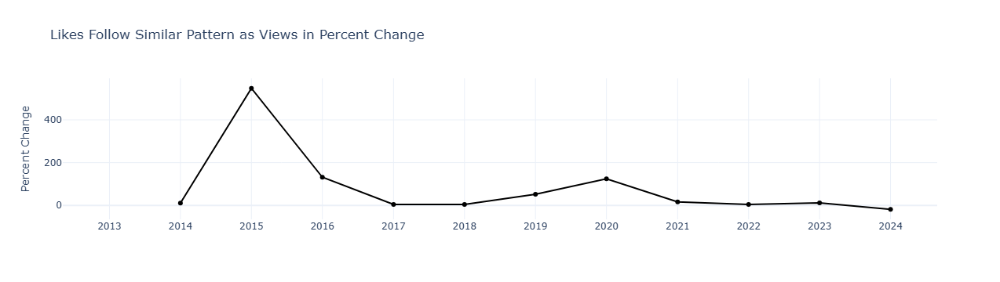

In [528]:
likecount_resampled_yearly_pct_change = likecount_ts.resample("Y", kind="period").sum().pct_change() * 100 
# viewcount_resampled_yearly_pct_change.plot()

# Create the base line plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=likecount_resampled_yearly_pct_change.index.to_timestamp(),
    y=likecount_resampled_yearly_pct_change.values,
    mode='lines+markers',
    name='Likes',
    line=dict(color='black'),
    hovertemplate='%{x|%Y}<br>Percent Change: %{y:.2f}%<extra></extra>'  # Custom hover format
))

fig.update_layout(
    title ="Likes Follow Similar Pattern as Views in Percent Change",
    template ="plotly_white",
    yaxis_title = "Percent Change",
    xaxis = dict(
        tickformat="%Y",  # Format the tick labels to display the year
        tickmode="linear",  # Ensure ticks are at regular intervals
        dtick="M12",  # Set the tick interval to every 12 months (1 year)
    )
)

### Comments

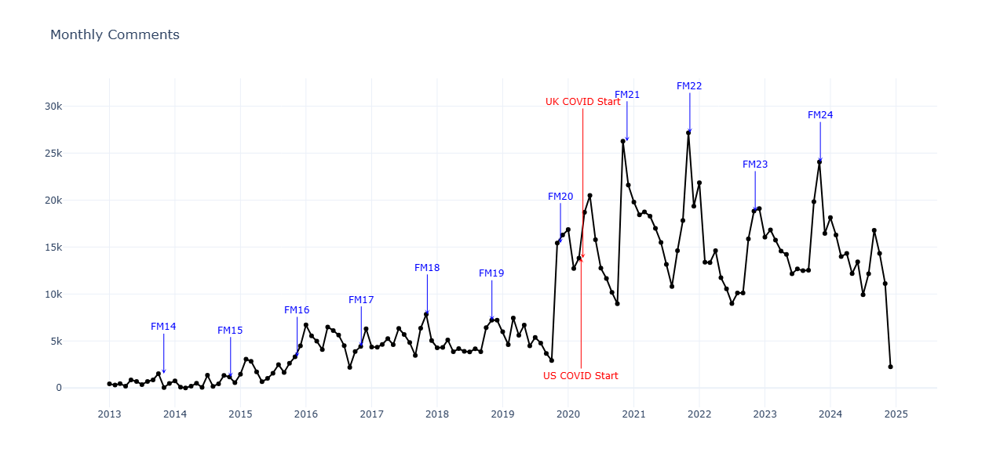

In [520]:
# Resample Comments count data
commentcount_resampled = commentcount_ts.resample("M", kind="period").sum()

# Create the base line plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=commentcount_resampled.index.to_timestamp(),
    y=commentcount_resampled.values,
    mode='lines+markers',
    name='Likes',
    line=dict(color='black'),
    hovertemplate='%{x|%B %Y}<br>Likes: %{y}<extra></extra>'  # Custom hover format
))

# Add annotations for Football Manager releases
for game, date in release_dates.items():
    date_ts = pd.Timestamp(date)
    # if date_ts in commentcount_resampled.index.to_timestamp():
    y_value = commentcount_resampled.loc[pd.Period(date, freq="M")]
    fig.add_annotation(
        x=date_ts,
        y=y_value,
        text=game,
        showarrow=True,
        arrowhead=3,
        arrowcolor='blue',
        font=dict(color='blue', size=12),
        ax=0,
        ay=-60  # Arrow pointing downward slightly
        )

# Add annotations for pandemic declarations
for event, date in pandemic_declarations.items():
    date_ts = pd.Timestamp(date)
    #if date_ts in commentcount_resampled.index.to_timestamp():
    y_value = commentcount_resampled.loc[pd.Period(date, freq="M")]
    
    # Conditionally position annotation
    if event == "UK COVID Start":
        fig.add_annotation(
            x=date_ts,
            y=y_value,
            text=event,
            showarrow=True,
            arrowhead=3,
            arrowcolor='red',
            font=dict(color='red', size=12),
            ax=0,
            ay=-200  # Float higher above
        )
    else:  # US COVID Start
        fig.add_annotation(
            x=date_ts,
            y=y_value,
            text=event,
            showarrow=True,
            arrowhead=3,
            arrowcolor='red',
            font=dict(color='red', size=12),
            ax=0,
            ay=150  # Float below with upward arrow
        )

# Update layout
fig.update_layout(
    title="Monthly Comments",
    # xaxis_title="Date",
    xaxis=dict(
        tickformat="%Y",  # Format the tick labels to display the year
        tickmode="linear",  # Ensure ticks are at regular intervals
        dtick="M12",  # Set the tick interval to every 12 months (1 year)
    ),
    template="plotly_white",
    showlegend=False,
    width=900,
    height=600
)

fig.show()


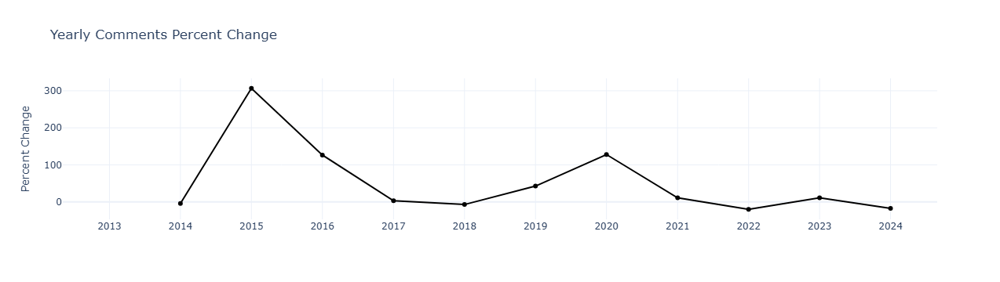

In [530]:
commentcount_resampled_yearly_pct_change = commentcount_ts.resample("Y", kind="period").sum().pct_change() * 100 
# viewcount_resampled_yearly_pct_change.plot()

# Create the base line plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=commentcount_resampled_yearly_pct_change.index.to_timestamp(),
    y=commentcount_resampled_yearly_pct_change.values,
    mode='lines+markers',
    name='Comment',
    line=dict(color='black'),
    hovertemplate='%{x|%Y}<br>Percent Change: %{y:.2f}%<extra></extra>'  # Custom hover format
))

fig.update_layout(
    title ="Yearly Comments Percent Change",
    template ="plotly_white",
    yaxis_title = "Percent Change",
    xaxis = dict(
        tickformat="%Y",  # Format the tick labels to display the year
        tickmode="linear",  # Ensure ticks are at regular intervals
        dtick="M12",  # Set the tick interval to every 12 months (1 year)
    )
)

### Time Series Dataframes

To sort out the months of highest and lowest engagement we must convert our time series objects into dataframes. This will allow the use of pd.Dataframe's filtering and querying abilities.

In [531]:
# Create dataframes from the time series objects
viewcount_ts_df = viewcount_ts.to_frame()
likecount_ts_df = likecount_ts.to_frame()
commentcount_ts_df = commentcount_ts.to_frame()

In [534]:
# Create the "year" and "month" column for the time series converted into dataframes

# Set year
viewcount_ts_df["year"] = viewcount_ts_df.index.year
likecount_ts_df["year"] = likecount_ts_df.index.year
commentcount_ts_df["year"] = commentcount_ts_df.index.year

# Set month
viewcount_ts_df["month"] = viewcount_ts_df.index.month
likecount_ts_df["month"] = likecount_ts_df.index.month
commentcount_ts_df["month"] = commentcount_ts_df.index.month

# Set day name
viewcount_ts_df["day_name"] = viewcount_ts_df.index.day_of_week
likecount_ts_df["day_name"] = likecount_ts_df.index.day_of_week
commentcount_ts_df["day_name"] = commentcount_ts_df.index.day_of_week

# Set season
viewcount_ts_df["season"] = viewcount_ts_df.index.map(get_season)
likecount_ts_df["season"] = likecount_ts_df.index.map(get_season)
commentcount_ts_df["season"] = commentcount_ts_df.index.map(get_season)

# Set dataframe names for later user
viewcount_ts_df.df_name = "viewcount_ts_df"
likecount_ts_df.df_name = "likecount_ts_df"
commentcount_ts_df.df_name = "commentcount_ts_df"

# Set dataframe names for later user
viewcount_ts_df.var_name = "Views"
likecount_ts_df.var_name = "Likes"
commentcount_ts_df.var_name = "Comments"


viewcount_ts_df.tail(5)

,Views,year,month,day_name,season
publishedAt,,,,,
2024-12-07 03:30:31-08:00,62649.00,2024,12,5,Autumn
2024-12-07 09:00:21-08:00,4008.00,2024,12,5,Autumn
2024-12-08 01:30:13-08:00,1995.00,2024,12,6,Autumn
2024-12-08 02:00:53-08:00,1441.00,2024,12,6,Autumn
2024-12-08 02:24:43-08:00,1001.00,2024,12,6,Autumn


In [535]:
viewcount_ts_df['day_name'].value_counts()

day_name
3    3161
2    3147
0    3093
1    3030
4    2983
5    2276
6    2140
Name: count, dtype: int64

In [552]:
viewcount_ts_df["2020-01":"2020-12"].query("Views > 220000")

,Views,year,month,day_name,season
publishedAt,,,,,
2020-01-01 03:00:12-08:00,352089.00,2020,1,2,Winter
2020-01-02 04:00:04-08:00,225625.00,2020,1,3,Winter
2020-01-23 23:29:20-08:00,234575.00,2020,1,3,Winter
2020-03-07 01:45:01-08:00,265650.00,2020,3,5,Winter
2020-03-19 09:00:12-07:00,377003.00,2020,3,3,Winter
2020-04-15 01:30:01-07:00,280723.00,2020,4,2,Spring
2020-04-22 01:30:00-07:00,228677.00,2020,4,2,Spring
2020-04-29 01:30:05-07:00,382533.00,2020,4,2,Spring
2020-05-06 01:30:04-07:00,309077.00,2020,5,2,Spring


In [538]:
viewcount_ts_df["2020-01":"2020-12"].max()

Views      382533.00
year            2020
month             12
day_name           6
season        Winter
dtype: object

Armed with the date and time of year information, we can find out the min and maximum values for our engagement metrics, then see if any time or seasonal patterns emerge.

In [536]:
import pprint
# Collect year by year summary stats to get a sense of max/min values
engagement_summary_stats = {}
engagement_metrics_dfs = [viewcount_ts_df, likecount_ts_df, commentcount_ts_df]

for year in range(2011, 2025):
    
    
    for engagement_metric in engagement_metrics_dfs:
        # Create yearly range slice, Jan to Dec.
        start_date = str(year) + "-01"
        end_date = str(year) + "-12"

        if start_date not in engagement_summary_stats: 
            engagement_summary_stats[start_date] = {}
        
        # Obtain max and min
        maximum = engagement_metric[start_date:end_date][engagement_metric.var_name].max()
        minimum = engagement_metric[start_date:end_date][engagement_metric.var_name].min()

        if engagement_metric.var_name not in engagement_summary_stats[start_date]:
            # print(f"{engagement_metric.var_name} is not found in e_s_s dict for {start_date}")
            engagement_summary_stats[start_date][engagement_metric.var_name] = {'max': maximum, 'min': minimum}
            # pprint.pprint(f"e_s_s\n{engagement_summary_stats[start_date]}")
        # print("---" * 30)
        # print()
    

In [537]:
# Review our nested dictionary with engagement summary stats
display(JSON(engagement_summary_stats, expanded=False))

<IPython.core.display.JSON object>

C:\Users\lover\AppData\Roaming\Python\Python39\site-packages\jupyter_client\session.py:719: UserWarning:

Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant



#### Yearly Maximum Engagement Metrics

We will be efficient in our processing and avoid copying boilerplate by creating a function to determine what month of a yearly time slice has the max or min value for likes, comments, and views. We will subsequently determine what months of the year are generally associated with higher yearly engagment levels. 

In [555]:
def yearly_min_or_max_df(engagement_type, limit_type):
    
    # Create empty df to store results
    results_df = pd.DataFrame()

    # Create a dict to pick the engagement metric dataframe we desire
    engagement_dict = {'Views': viewcount_ts_df, 'Likes': likecount_ts_df, 'Comments': commentcount_ts_df }

    # Set the selected dataframe
    df = engagement_dict[engagement_type]
    
    for year in range(2013, 2025):
        # Create strings for year to enable time series slicing
        year_str = str(year) + "-01"
        year_end = str(year) + "-12"
    
        # Extract the limit value parameterized by the engagement type and limit type
        # max = engagement_summary_stats[year_str]['Views']['max']
        limit_value = engagement_summary_stats[year_str][engagement_type][limit_type]
      
        # Find the month of the limit_value via dataframe query
        query_string = engagement_type + " == " + str(limit_value)

        # result = viewcount_ts_df[year_str:year_end].query("Views == @max")
        result = df[year_str:year_end].query(query_string)
        
        # Obtain the index of the searched row, as the merge overwrites joined dfs indexes
        # result['index'] = viewcount_ts_df[year_str:year_end].query("Views == @max").index
        result['index'] = df[year_str:year_end].query(query_string).index
        
        # Set index to the publishedAt date
        result.set_index('index', inplace=True)
    
        # If we are in the first loop iteration, set our results_df to first result
        if results_df.empty: # First pass
            results_df = result
        # Else, we concat current results_df with result
        else:  
            results_df = pd.concat([results_df, result], sort=False).sort_index()
    return results_df

In [556]:
# Maximum views months
views_max = yearly_min_or_max_df("Views", "max")
views_max['month'].value_counts()

month
10    3
4     2
9     2
8     1
11    1
1     1
5     1
2     1
Name: count, dtype: int64

In [557]:
# Maximum likes months
likes_max = yearly_min_or_max_df("Likes", "max")
likes_max['month'].value_counts()

month
10    3
8     2
9     2
11    2
12    2
1     1
Name: count, dtype: int64

In [558]:
# Maximum comments months
comments_max = yearly_min_or_max_df("Comments", "max")
comments_max['month'].value_counts()

month
11    4
8     2
6     1
7     1
10    1
3     1
5     1
9     1
Name: count, dtype: int64

In [578]:
# Minimum views months
views_max = yearly_min_or_max_df("Views", "min")
views_max['month'].value_counts()

month
4     2
10    2
8     2
11    1
5     1
9     1
12    1
3     1
7     1
Name: count, dtype: int64

In [576]:
# Minimum likes months
likes_max = yearly_min_or_max_df("Likes", "min")
likes_max['month'].value_counts()

month
9     2
12    2
8     2
3     1
5     1
11    1
10    1
1     1
7     1
Name: count, dtype: int64

In [575]:
# Minimum comments months
comments_max = yearly_min_or_max_df("Comments", "min")
comments_max['month'].value_counts()

month
2     14
12    13
9     11
3     11
10    11
11     8
4      7
8      5
1      5
5      4
7      2
6      1
Name: count, dtype: int64

Most of the months with highest yearly maximum engagement for all types (views, likes, comments) is December. As the bulk of all Football Manager game releases are slated for November, video engagment proximate to the game being generally available speaks to players and enthusiasts engaging with related content. Views and Comments shared the second-place month of September, while Likes has June in the second slot. 

#### Weekday Upload Frequency

Let's analyze the most popular days to publish YouTube content for Football Manager content. We again rely on our `videos` relation object to abstract our interaction with the DuckDB table, counting the values for each day. Then we alter our dataframe index to align with the "weekday" ordering we expect and then plot the results.

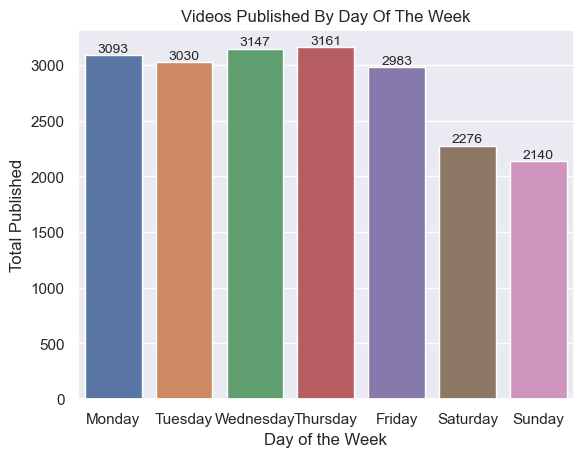

In [559]:
# Extract the publish day from the DuckDB table
publish_day_df = videos_relation.project('publish_day_name').df()

# Tabulate the value counts for each weekday 
category = publish_day_df['publish_day_name'].value_counts() 

# Create weekdays ordered for our index.
weekdays = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reindex the category dataframe 
category = category.reindex(weekdays)
category_df = category.reset_index()

# Create columns for our dataframe
category_df.columns = ['Weekdays', 'Count']

# Plot the results
ax = sns.barplot(x = 'Weekdays', y = 'Count', data = category_df)

# Set a bar label to show amounts
ax.bar_label(ax.containers[0], fontsize=10);

# Add title and labels for clarity
plt.title("Videos Published By Day Of The Week")
plt.xlabel("Day of the Week")
plt.ylabel("Total Published")

plt.show()

Thursday dominates the publish scheduling, Wednesday coming a close second. Saturday and Sunday appear to be the lowest counts for video publishing. One thing to bear in mind is that "upload" speaks to when a video is uploaded onto the YouTube platform, but the "publish" date speaks to when the video becomes available to the general public for viewing. It is very likely that content creators may be uploading in whatever schedule they desire, but choosing to release videos at the cadence observed in this data. 

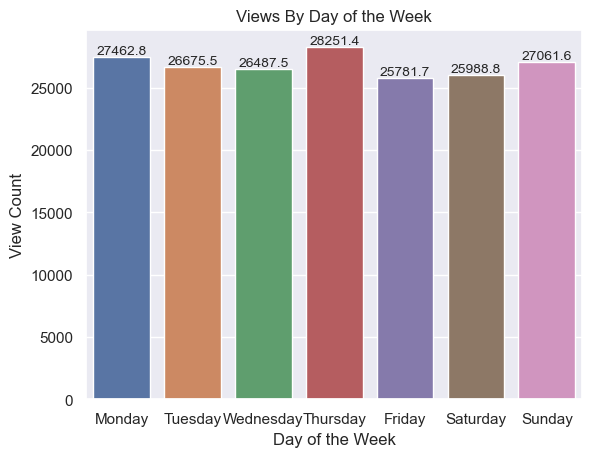

In [560]:
# Extract the publish day from the DuckDB table
publish_day_views_df = videos_relation.project('publish_day_name', 'viewCount').df()

# Define the desired order for the weekdays
weekdays_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Plot the barplot without error bars and with ordered categories
ax = sns.barplot(
    x="publish_day_name", 
    y="viewCount", 
    data=publish_day_views_df, 
    errorbar=None,  # Disable error bars
    order=weekdays_order  # Set the order of the days
)

# Set a bar label to show amounts
ax.bar_label(ax.containers[0], fontsize=10);

# Add title and labels for clarity
plt.title("Views By Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("View Count")

plt.show()

Thursday, Monday, and Sunday, are the days videos recieve more views, with Friday being the lowest engagement day. By same token we see that Wednesday is a close third-place for view counts. This may speak to content viewers being available on weekends to consume Football Manager content, while also having some time during mid-week to watch videos that corresponds to the heightened mid-week publishing schedule content creators currently leverage. 

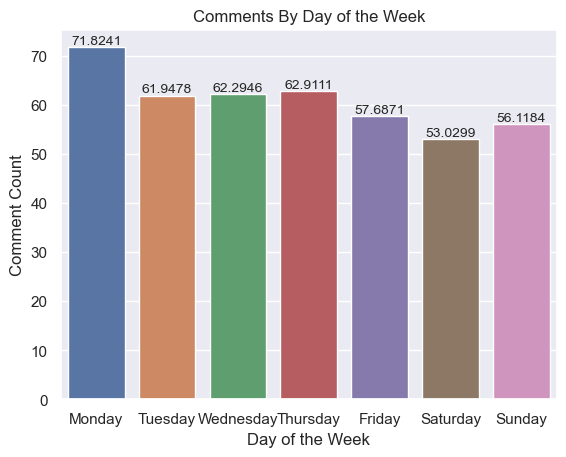

In [574]:
# Extract the publish day from the DuckDB table
publish_day_comments_df = videos_relation.project('publish_day_name', 'commentCount').df()

# Define the desired order for the weekdays
weekdays_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Plot the barplot without error bars and with ordered categories
ax = sns.barplot(
    x="publish_day_name", 
    y="commentCount", 
    data=publish_day_comments_df, 
    errorbar=None,  # Disable error bars
    order=weekdays_order  # Set the order of the days
)

# Set a bar label to show amounts
ax.bar_label(ax.containers[0], fontsize=10);

# Add title and labels for clarity
plt.title("Comments By Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Comment Count")

plt.show()

Monday is the strongest day for comments, Thursday a distance second and clocking in with 10 comments less. Monday having such a high comment volume brings to mind viewers starting the week "fresh" and engaged enough to leave their input.  Saturday and Sunday demonstrate the lowest comment counts. 

### Video Publish Frequency

### Engagement Metrics Seasonality Summary

* Across the years, views, likes, and comments have similar percent changes rises and falls across the past decade.
* Maximum monthly view counts have steadily increased from the FM21 to FM24 game releases, but appear to be plateauing in value; the maximum views coincide with FM game release dates.
* Likes reached their monthly maximum value in FM24, reaching **502.62K** in November 2023. 
* The maxiumum amount of monthly comments occurred in  November 2021, totaling **27.17K**.
* Day of the Week
    * Creators have higher publish rates mid-week. Low publish rates on weekend imply they respect traditional work week, or they use weekends to edit and produce content.
    * Videos are viewed at higher amount on Monday and Thursday, with lowest viewing observed on Friday and Saturday. This implies viewers having a traditional work week and watching Football Manager content as a diversion.
    * Comments have higher amount on Monday and Thursday, less comments seen on Saturday and Sunday. Viewing of Football Manager videos may be a ritual experience weekly for some viewers. This may also mean commentary may coincide with the environment viewers find themselves in.

# 5. High Engagement Metrics Behavior

## Most Viewed Videos 

In [160]:
# Find the videos with the most views. Remove "DK Falcon" as they are keyword-stuffing FM branding terms and not producing much FM content.
top_50_viewed_videos = con.sql("""
            SELECT channelTitle, video_id, viewCount, description, tags, publishedAt, numeric_duration
            FROM videos_cleaned
            WHERE channelTitle != 'DK FALCON' 
            -- AND description ILIKE '%fm%' 
            -- AND description ILIKE '%Football Manager%'
            ORDER BY viewCount DESC
            LIMIT 50
        """).df()
    
# Small function to extract year from `publishedAt` field.
def return_pub_year(row):
    return row.year

# Create a field for URL derived from video_id.
top_50_viewed_videos['url'] = "https://www.youtube.com/watch?v=" + top_50_viewed_videos['video_id']
top_50_viewed_videos['year'] = top_50_viewed_videos['publishedAt'].apply(return_pub_year)
# Remove index from display
top_50_viewed_videos.index=[''] * len(top_50_viewed_videos)
top_50_viewed_videos[['channelTitle', 'viewCount', 'url', 'year']].head(25)

,channelTitle,viewCount,url,year
,TomFM,1393911.00,https://www.youtube.com/watch?v=CtIN34WbVJ0,2024
,DoctorBenjy FM,923621.00,https://www.youtube.com/watch?v=_rWxg3CEHcY,2015
,TomFM,817896.00,https://www.youtube.com/watch?v=9ialQPtqTnc,2023
,TomFM,656077.00,https://www.youtube.com/watch?v=W2oF7EINGjE,2023
,Omega Luke,598924.00,https://www.youtube.com/watch?v=pPKvlyaeHYc,2023
,Zealand,591198.00,https://www.youtube.com/watch?v=16MSX9-0VyY,2024
,Zealand,535323.00,https://www.youtube.com/watch?v=e_HSqKXz2HY,2023
,Zealand,525820.00,https://www.youtube.com/watch?v=MXDMoNOZu-I,2022
,Zealand,521730.00,https://www.youtube.com/watch?v=Psf-WyPNlSA,2021
,Omega Luke,521595.00,https://www.youtube.com/watch?v=IIN3FHShc44,2023


[]

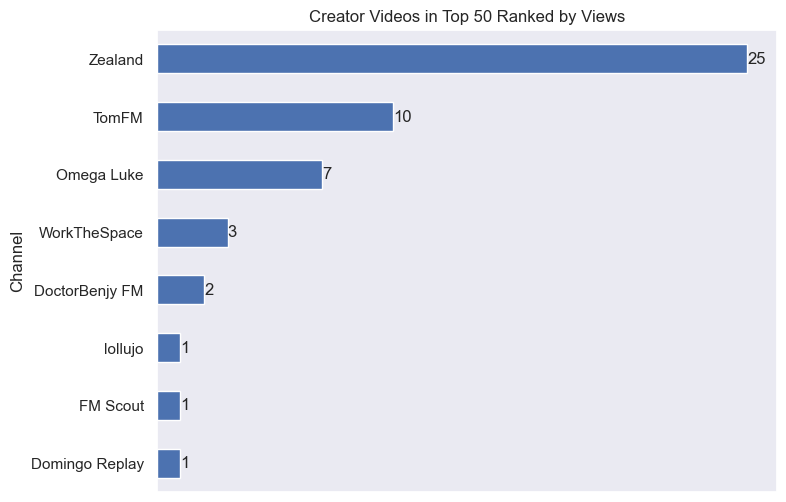

In [5]:
ax = top_50_viewed_videos.value_counts('channelTitle').sort_values(ascending=True).plot.barh(figsize=(8,6), 
                                                                ylabel='Channel',
                                                                 title='Creator Videos in Top 50 Ranked by Views'
                                                               )
# Adding labels to the chart
ax.bar_label(ax.containers[0], label_type='edge')
ax.grid(False)

# Hide axes ticks
ax.set_xticks([])


 `Zealand` weighs in with half of the videos in our Top 50 ranked by views, more than **2.5** times more than the next closest channel `TomFM`, with Omega Luke rounding out the top 3 with 7 videos. From `WorkTheSpace` onwards we see a gentle downward trend in video volume.

To qualitatively assess what "type" of content is highly viewed content, we step outside of our notebook and use Microsoft Excel pivot tables to visualize and manually classify each video by logical categories.

* **Challenges**
    * Unique, self-imposed gameplay challenges.

* **Rebuilds and Team Development**
    * Rebuilding or improving specific teams.

* **Experiments**
    * Testing hypotheses or alternate realities in Football Manager.

* **Player Development**
    * Developing wonderkids or specific player roles.

* **Gameplay Walkthroughs**
    * General gameplay or save progress videos.

* **Guides and Tutorials**
* Tutorials, improvement tips, or installation guides.

* **Community Collaborations**
    * Content made with other Football Manager creators.

In [8]:
# Read in CSV with manually categorized videos
top_50_viewed_videos_categorized_df = pd.read_csv('./data/text/top_50_viewed_videos_categorized.csv')

# Drop the spacer column
top_50_viewed_videos_categorized_df.columns
top_50_viewed_videos_categorized_df = top_50_viewed_videos_categorized_df.drop(['Unnamed: 9', 'Unnamed: 0'], axis='columns')
top_50_viewed_videos_categorized_df.head(1)

,channelTitle,video_id,viewCount,description,tags,publishedAt,url,year,Video Description,Primary Category,Secondary Category
0,TomFM,CtIN34WbVJ0,1393911,Here is how I completed the Hardest Challenge ...,['TomFM' 'Football Manager' 'Football Manager ...,2024-02-27 09:15:00-08:00,https://www.youtube.com/watch?v=CtIN34WbVJ0,2024,Pentagon Challenge,Challenges,Gameplay Walkthroughs


In [9]:
top_50_viewed_videos_categorized_df['Primary Category'].value_counts()

Primary Category
Guides and Tutorials             14
Challenges                       10
Experiments                       8
Player Development                8
Rebuilds and Team Development     6
Gameplay Walkthroughs             2
Community Collaborations          2
Name: count, dtype: int64

In [10]:
# Create a cleaner column name for easier query operations
top_50_viewed_videos_categorized_df['primary_category'] = top_50_viewed_videos_categorized_df['Primary Category']

Text(0.0, 1.0, 'Categories of Top 50 Viewed Videos')

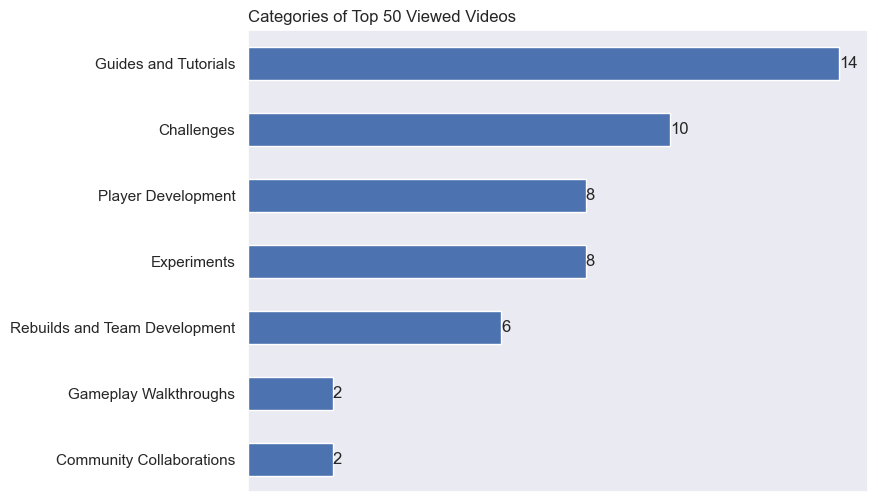

In [11]:
ax = top_50_viewed_videos_categorized_df.value_counts('Primary Category').sort_values(ascending=True).plot.barh(figsize=(8,6), 
                                                                ylabel='',
                                                            
                                                      
                                                               )


# Adding labels to the chart
ax.bar_label(ax.containers[0], label_type='edge')
ax.grid(False)

# Hide axes ticks
# Hide axes ticks
ax.set_xticks([])
ax.set_title('Categories of Top 50 Viewed Videos', loc='left')

In [ ]:
# Visualize the video categories over time
pivot_df = top_50_viewed_videos_categorized_df.groupby(['year', 'Primary Category']).size().unstack(fill_value=0)
# pivot_df

# Plot a stacked bar chart
pivot_df.plot(
    kind='bar',
    stacked=True,
    figsize=(12, 6),
    colormap='viridis',
    edgecolor='black'
)

# Add labels and title
# plt.xlabel("Year")
# plt.ylabel("Count")
plt.title("Video Categories by Year")
plt.xticks(rotation=45)
plt.legend(title="Video Category", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

We utilized Microsoft Excel to pivot the data and breakdown each year by the video categories.

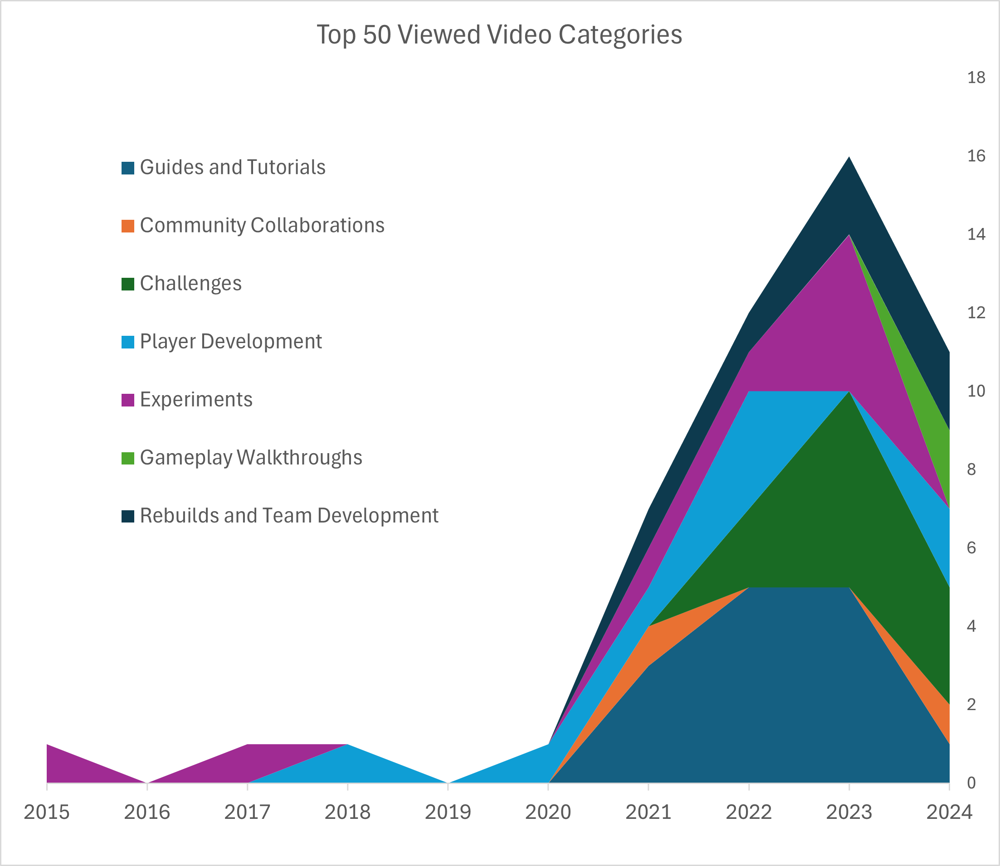

In [331]:
Image(filename='./images/Top_50_viewed_video_categories.png', height=800, width=800)

* From 2015 to 2020, "Experiments" and "Player Development" are the only categories seen in our top viewed videos. The fact that these videos are small in number, compared to the wider variety of categories seen in latter years, but are still present in the top ranking top viewed videos indicates these particular videos stand the test of time with regards to their sheer volume of views. The "Experiments" category may implicitly represent the initial viewer "type" present when Football Manager content was introduced to the YouTube platform; intermediate-level and experienced players with game familiarity wanting to see the Football Manager gameplay in interesting and novel ways.
* "Experiments" reach their peak in 2024 and are present in five out of the eight years in this dataset. They are completely absent in 2024, which is a bit surprising. 
* "Player Development" category dominance in 2018 and 2020 speaks to viewers who souoght targeted gameplay advice. These viewers could be new or experienced players encountering challenges in ensuring the players and clubs in their games reached their fullest potential.
* The year of 2021 marks the general spread of categories for most viewed videos. This categorical spread may be the result from the sharp uptick in view volume observed in late 2020 coupled with an influx of new or returning player communities. In 2021, the "Guides and Tutorial" video category prominence implies viewers seeking insight into how to play the game, while the other videos may be of general interest to other audience segments with already-present interest.
* "Rebuilds" are present every year from 2021 onwards, though their volume never rises greater than two videos in any individual year. The "Rebuild" genre speaks to the idea of taking over a club that requires an overhaul in squad personnel, possibly revamping the training and club facilities, turning over and replacing club staff, and a focus on rising from obscurity and past mediocrity to periods of domestic and continental dominance, winning national leagues, cup competitions, or contintental titles. This implies long-time and active viewers of football leagues and clubs already aware of what clubs have fallen from grace who have a vicarious interest in seeing content creators return those clubs to glory.
* From 2022 to 2024 we see the emergence of the "Challenges" category in our top viewed videos, with their peak in 2023. "Challenges" are activities when players deal with self-imposed constraints and objectives regarding their gameplay to determine their success. Examples of these types of challenges include being forced to only utilize players that emerge from a club's youth systems and not recruiting players externally, or recruiting players of a specific nationality or location. "Challenges" make the game have increased levels of difficulty outside of normal gameplay and can lead to interesting decisions and gameplay patterns. "Challenges" may also imply a lack of novelty or dearth of interesting out-of-the-box gameplay features, requiring the player to provoke new challenges and creativity with self-imposed constraints.
* "Community Collaborations" is only present in two years of our dataset. This category may have untapped potential, but may also depend upon the chemistry of the creators and the interest in the topic the collaborate on.

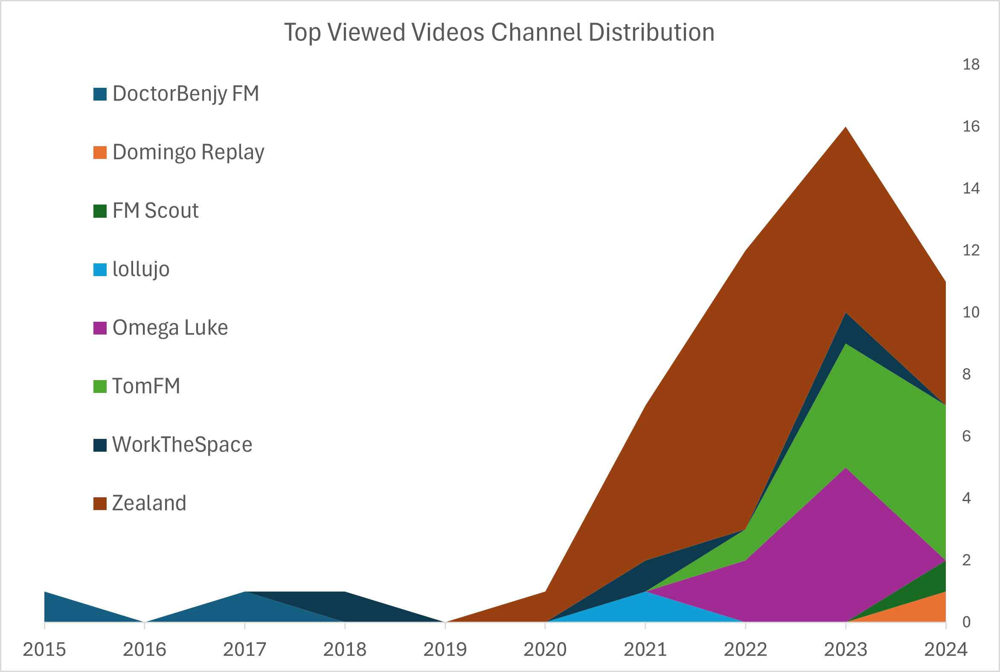

In [177]:
Image(filename='./images/Creator_Area_Chart_for_Top_50_videos_by_views.png', height=800, width=800)

Using an area graph to visualize each creator's footprint among highly ranked videos, we see that `DoctorBenjy FM` begins our journey in 2015 and 2017. These two years were associated with "Experiments" categorized videos. In 2018 we only observe `WorkTheSpace` and in 2020 `Zealand` appears; in these years we see videos falling into the "Player Development" category. Proximate to the meteoric rise in Football Manager video view counts in 2020, `Zealand` establishes a significant share of the most viewed videos in subsequent years and never lets go. `WorkTheSpace` has three entries in the data, each separated a few years apart. Creators `TomFM` and `Omega Luke` begin their contributions to the top viewed videos in 2021 and expanding their footprint in the subsequent two years. In the final year, we see `Zealand` and `TomFM` dominate the space, with `FM Scout` and `Domingo Replay` clocking singular entries.

We query our dataframe using SQL to see if the categorizations of these top videos speak to the branding and niche of each individual content creator. We create a common table expression (CTE) to enable the calculation of channel-specific category percentages per channel, that we will use to describe each channel's focus.

In [168]:
con.sql("""WITH 
              df_sums (channelTitle, sum_all_categories) AS 
              (
              SELECT channelTitle, COUNT(primary_category) AS sum_all_categories 
              FROM top_50_viewed_videos_categorized_df 
              GROUP BY channelTitle
              ),
              
             df_counts (channelTitle, primary_category, category_count) AS
             (
             SELECT channelTitle, primary_category, count(primary_category) AS category_count
             FROM top_50_viewed_videos_categorized_df 
             GROUP BY channelTitle, primary_category
             ORDER BY category_count DESC
            )

           SELECT df_counts.channelTitle,
               df_counts.primary_category,
               df_counts.category_count,
               round((df_counts.category_count / df_sums.sum_all_categories) * 100) AS channel_category_percentage
           FROM df_counts JOIN df_sums
           ON df_counts.channelTitle = df_sums.channelTitle
           ORDER BY df_counts.channelTitle, df_counts.category_count DESC
        """
       )

┌────────────────┬───────────────────────────────┬────────────────┬─────────────────────────────┐
│  channelTitle  │       primary_category        │ category_count │ channel_category_percentage │
│    varchar     │            varchar            │     int64      │           double            │
├────────────────┼───────────────────────────────┼────────────────┼─────────────────────────────┤
│ DoctorBenjy FM │ Experiments                   │              2 │                       100.0 │
│ Domingo Replay │ Gameplay Walkthroughs         │              1 │                       100.0 │
│ FM Scout       │ Player Development            │              1 │                       100.0 │
│ Omega Luke     │ Challenges                    │              4 │                        57.0 │
│ Omega Luke     │ Guides and Tutorials          │              1 │                        14.0 │
│ Omega Luke     │ Experiments                   │              1 │                        14.0 │
│ Omega Luke     │ R

* **DoctorBenjy FM**: Every entry is an "Experiment" which implies their target audience may be experienced Football Manager players and content consumers seeking to push the game to extremity.
* **Domingo Replay**: Their single entry is live streamed gameplay, which aligns with the impression they are a "variety streamer."
* **FM Scout**: Taps in with a singular entry in "Player Development." The video details a Wonderkid scouting method and is "Shorts" content. While this is a channel for a community gaming site, `Jake Cooper` is generally associated with the content produced from this channel.
* **lollujo**: A singular entry in "Experiments," but anecdotally, creates daily content that may be categorized as "Gameplay Walkthrough" or "Rebuild" genre. The video simulates 30 years of Football history in Football Manager starting from 1991. It is possible this highly viewed entry may be due to the contrast to their running content type and speaks to specific age demographics who have awareness of the state of leagues and competitions dating from that period. 
* **Omega Luke**: Primarily focuses on the "Challenges" genre, which have overlap with the "Rebuild" genre, as oftentimes team development is crucial in achieving success with challenges such as "Glory Hunter."
* **TomFM**: Evenly distributed across "Challenges," "Experiments," and "Rebuilds" genres, with a singular entry for "Player Development."
* **WorkTheSpace**:  Equally spread across "Guides and Tutorials", "Rebuilds," and "Player Development."
* **Zealand**: Close to half of their content is focused on "Guides and Tutorials," which may attract all audience types, especially new and casual Football Manager players. 20% of their content deals with "Player Development," outperforming other creators in this niche, since no other creator in this list has more than one video in the top ranking for views. Zealand stands as the only creator with any "Community Collaboration" videos in this list, clocking in at two.

## Tags

In [652]:
# Count number of items in the top 50 viewed videos dataframe lacking tags data.
top_50_viewed_videos['tags'].isna().value_counts()

tags
False    40
True     10
Name: count, dtype: int64

In [178]:
# Videos lacking tags.
con.sql("""SELECT channelTitle,url  from top_50_viewed_videos
           WHERE tags IS NULL
           -- GROUP BY channelTitle
        """
       )

┌──────────────┬─────────────────────────────────────────────┐
│ channelTitle │                     url                     │
│   varchar    │                   varchar                   │
├──────────────┼─────────────────────────────────────────────┤
│ Zealand      │ https://www.youtube.com/watch?v=MXDMoNOZu-I │
│ Zealand      │ https://www.youtube.com/watch?v=6rqYCud8tsU │
│ Zealand      │ https://www.youtube.com/watch?v=6EyxZYQ_W0Y │
│ Zealand      │ https://www.youtube.com/watch?v=VdNH-_z-whk │
│ Zealand      │ https://www.youtube.com/watch?v=_FHDMRWWKXk │
│ Zealand      │ https://www.youtube.com/watch?v=zK4kehpBKdA │
│ Zealand      │ https://www.youtube.com/watch?v=yqIXVjCdYks │
│ Zealand      │ https://www.youtube.com/watch?v=Ov3WqsdxxJI │
│ Zealand      │ https://www.youtube.com/watch?v=EYqVI59T30w │
│ Zealand      │ https://www.youtube.com/watch?v=dpMMdNFHvtU │
├──────────────┴─────────────────────────────────────────────┤
│ 10 rows                                          2 co

80% of the videos in our top ranked by views list have tags, with the 20% lacking tags belonging to `Zealand.` The presence of these videos may indicate tagging does not necessarily impact how many views a video receives, nor impacts the algorithmic presence of "findability" of this content.

## Comments

In [201]:
# Find the videos with the most views. Remove "DK Falcon" as they are keyword-stuffing FM branding terms and not producing much FM content.
# We remove `NICKRTFM` as the video that meets the comment count is not FM-related.
top_50_commented_videos = con.sql("""
            SELECT channelTitle, video_id, commentCount, description, tags, publishedAt
            FROM videos_cleaned
            WHERE channelTitle != 'DK FALCON'
            AND channelTitle != 'NickRTFM'
            -- AND description ILIKE '%fm%' 
            -- AND description ILIKE '%Football Manager%'
            ORDER BY commentCount DESC
            LIMIT 50
        """).df()
    

# Create a field for URL derived from video_id.
top_50_commented_videos['url'] = "https://www.youtube.com/watch?v=" + top_50_commented_videos['video_id']
top_50_commented_videos['year'] = top_50_commented_videos['publishedAt'].apply(return_pub_year)
top_50_commented_videos[['channelTitle', 'video_id','commentCount', 'url', 'year']]

,channelTitle,video_id,commentCount,url,year
0,lollujo,hsn1jsroVJY,2477.00,https://www.youtube.com/watch?v=hsn1jsroVJY,2021
1,lollujo,tD_4PHqx7vE,2126.00,https://www.youtube.com/watch?v=tD_4PHqx7vE,2023
2,lollujo,-owGxv5BOIE,2001.00,https://www.youtube.com/watch?v=-owGxv5BOIE,2022
3,lollujo,_S28xfkUAhM,1794.00,https://www.youtube.com/watch?v=_S28xfkUAhM,2022
4,lollujo,Ro6VTdTClho,1569.00,https://www.youtube.com/watch?v=Ro6VTdTClho,2021
5,Zealand,pmdIkhfmY6w,1545.00,https://www.youtube.com/watch?v=pmdIkhfmY6w,2021
6,lollujo,t4Oi-ge3wQw,1529.00,https://www.youtube.com/watch?v=t4Oi-ge3wQw,2023
7,Zealand,kZRcjkRKbLE,1208.00,https://www.youtube.com/watch?v=kZRcjkRKbLE,2020
8,WorkTheSpace,J-uX1xQ49yM,1208.00,https://www.youtube.com/watch?v=J-uX1xQ49yM,2023
9,lollujo,uwNhJT6DGbw,1165.00,https://www.youtube.com/watch?v=uwNhJT6DGbw,2021


In [200]:
# Summary stats on the dataframe with info on the videos with the most comments
top_50_commented_videos.describe()

,commentCount,year
count,50.00,50.00
mean,1003.48,2022.14
std,397.22,1.67
min,632.00,2015.00
25%,764.75,2021.00
50%,889.00,2022.00
75%,1010.50,2023.75
max,2477.00,2024.00


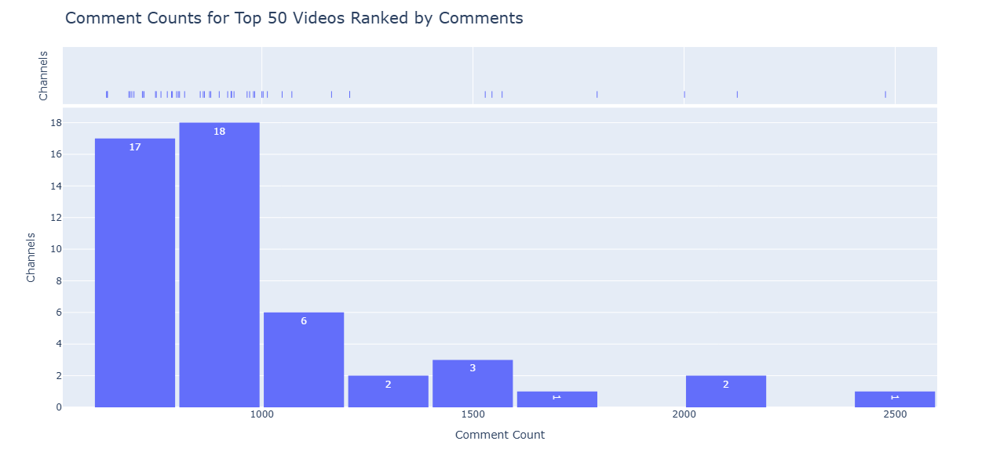

In [207]:
# Create histogram for top 50 most comment videoss
fig = px.histogram(top_50_commented_videos,
                   x="commentCount",
                   marginal="rug",
                   hover_data=['channelTitle'],
                   nbins=10,
                   text_auto=True,
                   width=1200,
                   height=600,
                   labels={"commentCount": "Comment Count",
                           "y": "Number of Videos"
                          }
)
fig.update_layout(
                  bargap=0.05, # Set a gap between histogram bins
                  #title_text='Football Manager YouTube Channel Subscribers' # title of plot
                  title = dict(text="Comment Counts for Top 50 Videos Ranked by Comments", font=dict(size=20), x=0.065),
)
# Set custom y-axis label
# fig.update_yaxes(title_text="Number of Channels")
fig.update_yaxes(title_text="Channels")
fig.show()

Roughly 75% of these videos have less than 1000 comments, with the mean number of comments being 1003. With the mean being so close to the 75th percentile, the more extreme videos in comment counts are skewing the distribution, even though we visually confirm where most observations lie on the lower end.

In [198]:
# Write videos to CSV for MS Excel analysis
top_50_commented_videos.to_csv('./data/text/top_50_commented_videos.csv')

Text(0.0, 1.0, 'Commented Videos in Ranked Top 50 by Views')

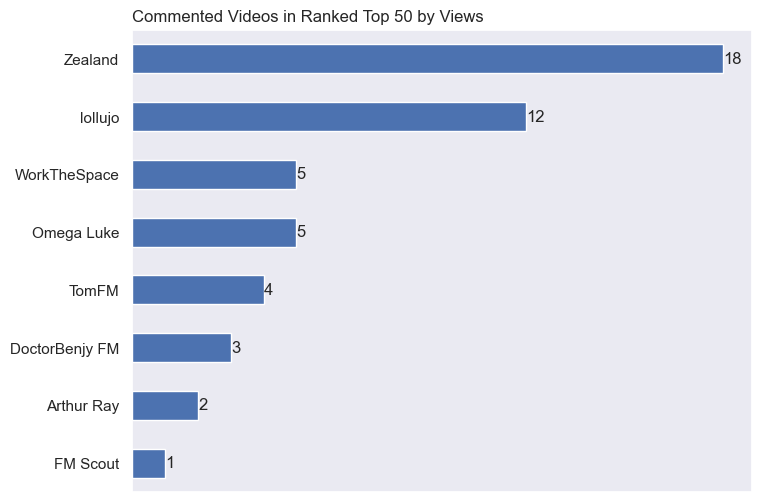

In [316]:
ax = top_50_commented_videos.value_counts('channelTitle').sort_values(ascending=True).plot.barh(figsize=(8,6), 
                                                                ylabel='',
                                                               )


# Adding labels to the chart
ax.bar_label(ax.containers[0], label_type='edge')
ax.grid(False)

# Hide axes ticks
ax.set_xticks([])
ax.set_title('Commented Videos in Ranked Top 50 by Views', loc='left')

Compared to video views, we see creators such as `lollujo` and `WorkTheSpace` featuring more prominently in terms of entries in the top 50 most commented videos.  This seems related to the pattern noticed in the pairwise plotting of views and comments, wherein the bulk of views and comment counts cluster near the origin, yet higher commented-on videos generally have less view volume. The smaller number of `lollujo`  and `WorkTheSpace` videos in the top 50 most viewed videos reveals the communities these creators have cultivated may possess different viewing behavior patterns than other channels. The audiences these creators possess may exhibit more commitment and willingness to comment on video content, implying steeper amounts of intellectual and emotional investment.

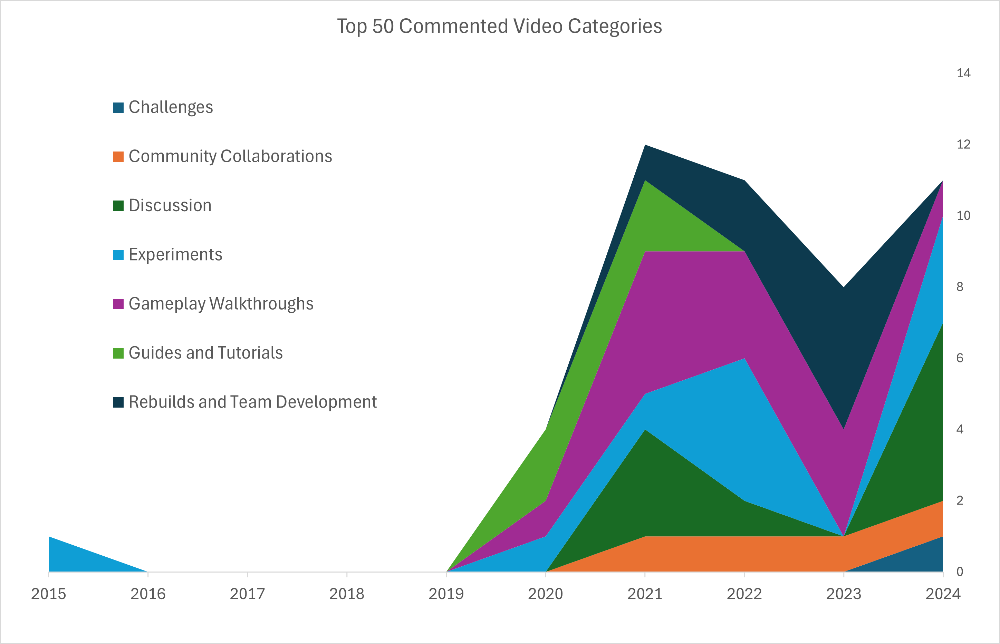

In [330]:
Image(filename='./images/Top_50_video_commented_categories.png', height=800, width=800) 

### Overlap Highly View and High Comment Videos

A general pattern from our pairwise plot indicated that highly viewed videos do not generally have a heightened number of comments associated with them. We will compare both Top 50 dataframes for views and comments and uncover if there any overlapping videos that excelled in both engagement patterns.

In [320]:
top_50_commented_videos.columns

Index(['channelTitle', 'video_id', 'commentCount', 'description', 'tags',
       'publishedAt', 'url', 'year'],
      dtype='object')

In [326]:
# top_50_commented_videos
# top_50_viewed_videos
overlap_comment_view_videos = con.sql("""SELECT v.channelTitle AS channel, v.url AS url, v.year as year, v.description as description
           FROM top_50_viewed_videos AS v
           INNER JOIN top_50_commented_videos AS c
           ON v.video_id = c.video_id
           ORDER BY year, channel
        """).df()

In [327]:
# Show videos that overlap top commented and top viewed
overlap_comment_view_videos[['channel', 'url', 'year']]

,channel,url,year
0,DoctorBenjy FM,https://www.youtube.com/watch?v=_rWxg3CEHcY,2015
1,Zealand,https://www.youtube.com/watch?v=pmdIkhfmY6w,2021
2,Zealand,https://www.youtube.com/watch?v=EYqVI59T30w,2021
3,Zealand,https://www.youtube.com/watch?v=6EyxZYQ_W0Y,2022
4,Zealand,https://www.youtube.com/watch?v=VdNH-_z-whk,2022
5,Omega Luke,https://www.youtube.com/watch?v=0u0IVpGsork,2023


* Only 6 videos overlap between the Top 50 most viewed and most commented videos, only 12% overlap.
* 3 out of the 5 videos have `Zealand` as the creator, the remaining two belonging to `Omega Luke` and `DoctorBenjy FM`.
* 4 out of 6 of the videos fall into the "Experiments" genre, two of them being "1000 Years into the Future" simulations.
* The two videos that are not "Experiments" are "Guides and Tutorials" (NewGAN facepack installation) and "Rebuild" (FM24 First Versus Rebuild).

## Running Time

In [415]:
top_50_viewed_videos['min_running_time'] = top_50_viewed_videos['numeric_duration'] / 60
top_50_viewed_videos[['channelTitle', 'numeric_duration', 'min_running_time']]

,channelTitle,numeric_duration,min_running_time
0,TomFM,7901.00,131.68
1,DoctorBenjy FM,738.00,12.30
2,TomFM,1657.00,27.62
3,TomFM,1032.00,17.20
4,Omega Luke,12198.00,203.30
5,Zealand,2050.00,34.17
6,Zealand,1137.00,18.95
7,Zealand,1215.00,20.25
8,Zealand,1370.00,22.83
9,Omega Luke,1398.00,23.30


<Axes: xlabel='channelTitle', ylabel='min_running_time'>

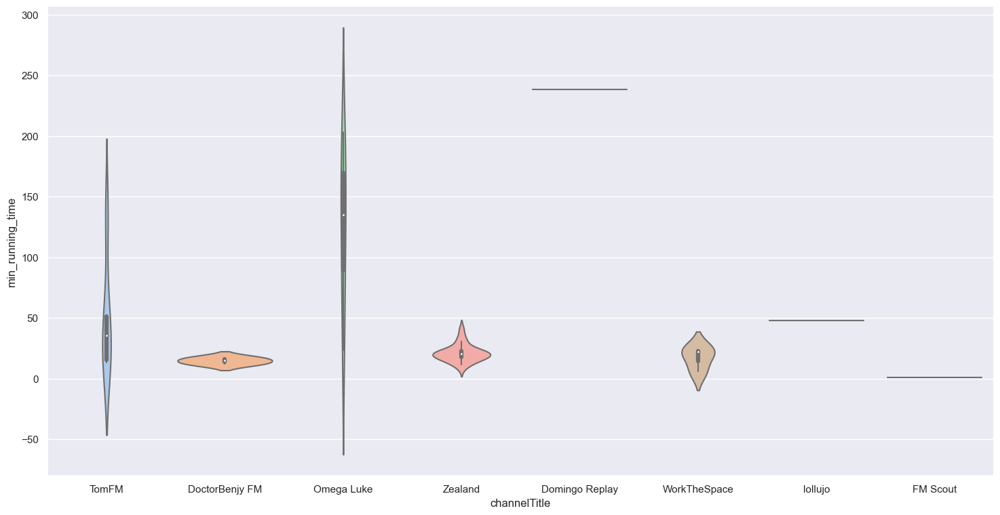

In [414]:
#sns.violinplot(x='channelTitle', y='viewCount', data=video_df, palette = 'pastel')
plt.rcParams['figure.figsize'] = (18, 9)
sns.violinplot(x='channelTitle', y='min_running_time', data=top_50_viewed_videos, palette = 'pastel')

* Creators `lollujo`, `FM Scout`, and `Domingo Replay` only have singular entries in the most viewed videos. The extreme width and lack of height of the violins indicate this, with the vertical position detailing the respective running time length. We can see shorts content from `FM Scout`, `lollujo` has a video of approximately 50 minute length, while the Gameplay video of `Domingo Replay` clocks in at nearly 4 hours.
* `DoctorBenjy FM`, `Zealand` , and `WorkTheSpace` have shorter, wider violins indicating higher numbers of videos having similar runtimes. `DoctorBenjy FM` has two entries between 10 and 15 minutes running times in range. The running time range of `Zealand` videos never exceeds 40 minutes, and have a median value around the 20 minute mark. `WorkTheSpace` shares a similar 20 minute media value, but shows there are videos with much lower running times, around the 5 minute mark.
* `TomFM` and `Omega Luke` show intense variety in the running times for their videos; `TomFM` has videos as short as 12 minutes and slightly longer than two hours; `Omega Luke` shows a similar diversity in content length, going even further with progressively longer form video content, which aligns with the channel's brand of Rebuild and Challenge content, which may require appropriate video running length to present the content, start to finish.


In [427]:
top_50_viewed_videos.query('channelTitle == "Omega Luke"')['min_running_time'].sort_values()

9     23.30
21    70.62
38   108.10
20   135.18
28   155.50
14   183.45
4    203.30
Name: min_running_time, dtype: float64

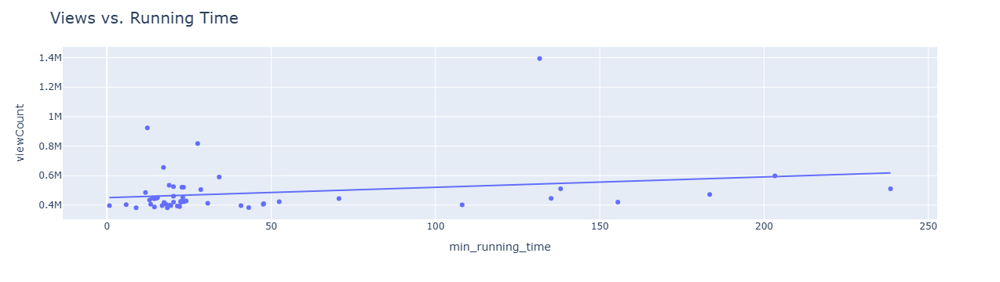

In [428]:
fig = px.scatter(top_50_viewed_videos, x='min_running_time', y='viewCount', custom_data=['channelTitle'], trendline="ols")

fig.update_layout(title=dict(text="Views vs. Running Time", font=dict(size=20), x=0.05),
                  # title_subtitle_text="Top 20 by Subs",
                  
)

# fig.update_traces(hovertemplate =
#                 "<b>%{customdata[0]}</b><br>%{x} Keywords<br>%{y} Comments" 
# )
fig.show()

In [429]:
top_50_viewed_videos['min_running_time'].corr(top_50_viewed_videos['viewCount'])

0.23072444988053223

## Video Description Wordclouds 

For the top viewed videos, we aggregate each content creator's description text, remove stopwords, and visualize the frequency of terms used via wordclouds. As one of the content creators is French-speaking, we also include the stopword list for this language.

In [333]:
# Use Pandas group operations to assist in creating consolidated wordlists
grouped_top_50_viewed_videos = top_50_viewed_videos['description'].groupby(top_50_viewed_videos['channelTitle'])

In [343]:
wordlist_dict = {}

for name, group in grouped_top_50_viewed_videos:
    print(name)
    # Create empty string
    result_string = str()
    # print(group)
    for item in group:
        result_string = result_string + item
        # print(f"Item:\n==========\n{item}\n=========\n")
        # print()
    wordlist_dict[name] = result_string

print(wordlist_dict.keys())

DoctorBenjy FM
Domingo Replay
FM Scout
Omega Luke
TomFM
WorkTheSpace
Zealand
lollujo
dict_keys(['DoctorBenjy FM', 'Domingo Replay', 'FM Scout', 'Omega Luke', 'TomFM', 'WorkTheSpace', 'Zealand', 'lollujo'])


In [372]:
# Cache stopwords
cached_stopwords = stopwords.words('english')

# Include French stopwords for Domingo Replay
cached_stopwords = stopwords.words('french') + cached_stopwords

def remove_stopwords(text):
    text = ' '.join([word for word in text.split() if word not in cached_stopwords])
    return text

In [385]:
# Iterate over every key in our wordlist dictionary and generate a wordcloud for each creator.
for creator, wordlist in wordlist_dict.items():
    # Apply stopword removal
    cleaned_text = remove_stopwords(wordlist_dict[creator])

    # Remove bulk of URLs
    cleaned_text = re.sub(r'\shttps?:\/\/.*?\s', ' ', cleaned_text, flags=re.MULTILINE)

    # Remove URLs trailing at end of wordlist (edge case)
    cleaned_text = re.sub(r'\shttps?:\/\/.*?$', ' ', cleaned_text, flags=re.MULTILINE)

    wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='black', 
                      colormap='viridis', collocations=True).generate(cleaned_text)

    # Modify the creator name so output file will not have spaces
    creator_name = re.sub(' ', '_', creator)
    
    # Create outputfile name for wordcloud images
    output_filename = './images/wordcloud_' + creator_name + '.png'
    
    print(f"Wordcloud generated for {creator} called {output_filename}\n")
    wordcloud.to_file(output_filename)
    #test_plot_cloud(wordcloud)

Wordcloud generated for DoctorBenjy FM called ./images/wordcloud_DoctorBenjy_FM.png

Wordcloud generated for Domingo Replay called ./images/wordcloud_Domingo_Replay.png

Wordcloud generated for FM Scout called ./images/wordcloud_FM_Scout.png

Wordcloud generated for Omega Luke called ./images/wordcloud_Omega_Luke.png

Wordcloud generated for TomFM called ./images/wordcloud_TomFM.png

Wordcloud generated for WorkTheSpace called ./images/wordcloud_WorkTheSpace.png

Wordcloud generated for Zealand called ./images/wordcloud_Zealand.png

Wordcloud generated for lollujo called ./images/wordcloud_lollujo.png



In [396]:
# Create copy/paste image URL list
for creator in wordlist_dict.keys():
    # Recreate creator name
    creator_name = re.sub(' ', '_', creator)
    
    # Create outputfile name for wordcloud images
    input_filename = './images/wordcloud_' + creator_name + '.png'
    #Image(filename='input_filename', height=800, width=800)"
    print(f"print('{creator} Top 50 Viewed Videos Wordcloud')")
    print(f"Image(filename='{input_filename}', height=800, width=800)") 
    print()

print('DoctorBenjy FM Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_DoctorBenjy_FM.png', height=800, width=800)

print('Domingo Replay Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_Domingo_Replay.png', height=800, width=800)

print('FM Scout Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_FM_Scout.png', height=800, width=800)

print('Omega Luke Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_Omega_Luke.png', height=800, width=800)

print('TomFM Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_TomFM.png', height=800, width=800)

print('WorkTheSpace Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_WorkTheSpace.png', height=800, width=800)

print('Zealand Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_Zealand.png', height=800, width=800)

print('lollujo Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_lollujo.png', height=800, wi

DoctorBenjy FM Top 50 Viewed Videos Wordcloud


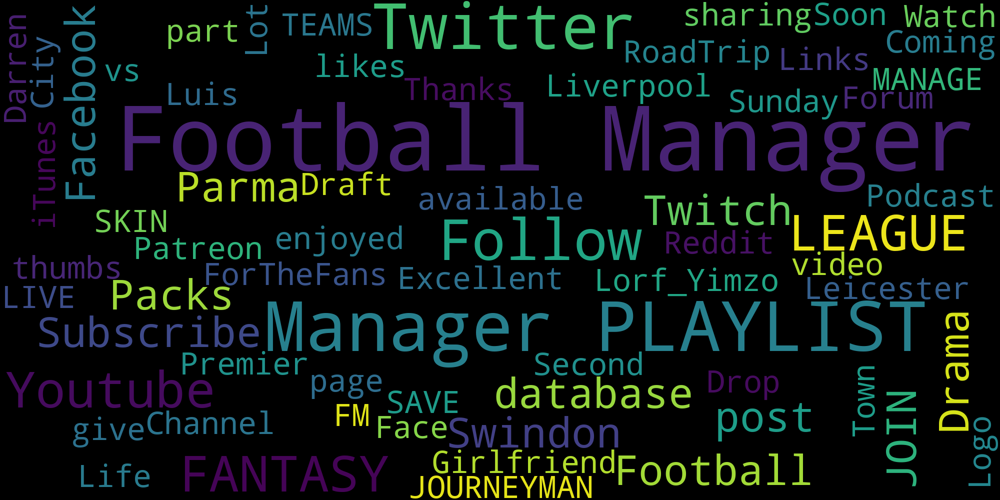

In [397]:
print('DoctorBenjy FM Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_DoctorBenjy_FM.png', height=800, width=800)

Domingo Replay Top 50 Viewed Videos Wordcloud


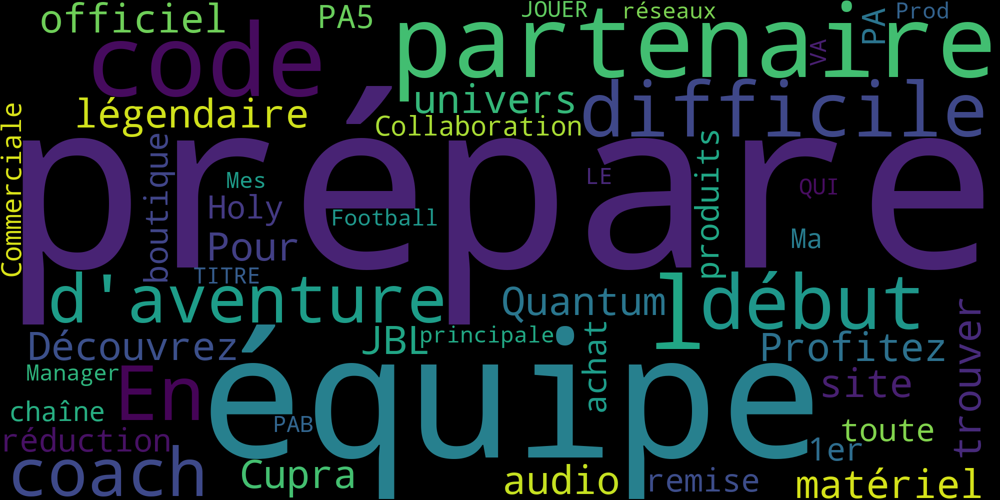

In [398]:
print('Domingo Replay Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_Domingo_Replay.png', height=800, width=800)

FM Scout Top 50 Viewed Videos Wordcloud


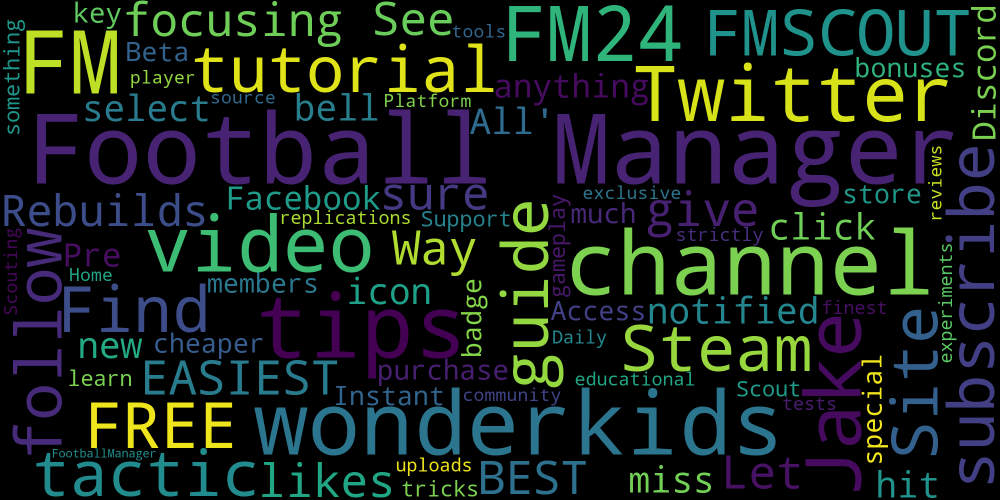

In [399]:
print('FM Scout Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_FM_Scout.png', height=800, width=800)

Omega Luke Top 50 Viewed Videos Wordcloud


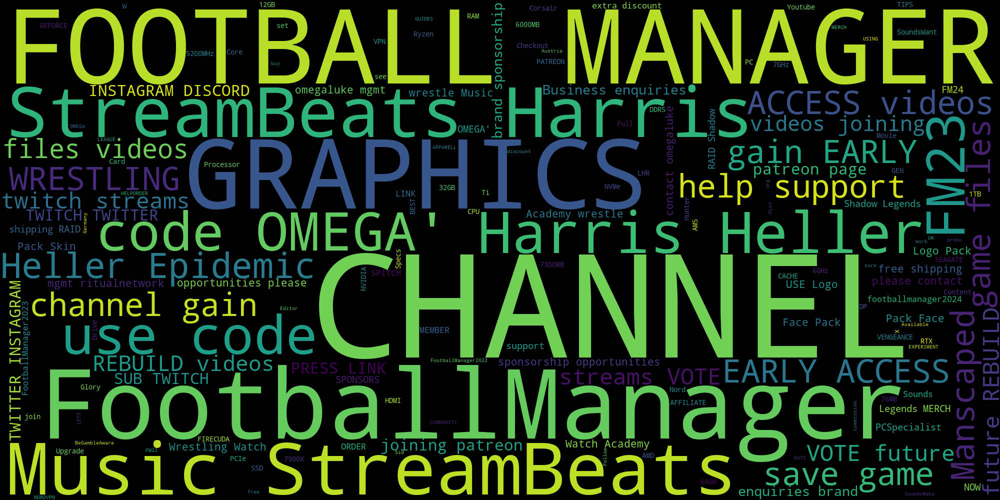

In [400]:
print('Omega Luke Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_Omega_Luke.png', height=800, width=800)

TomFM Top 50 Viewed Videos Wordcloud


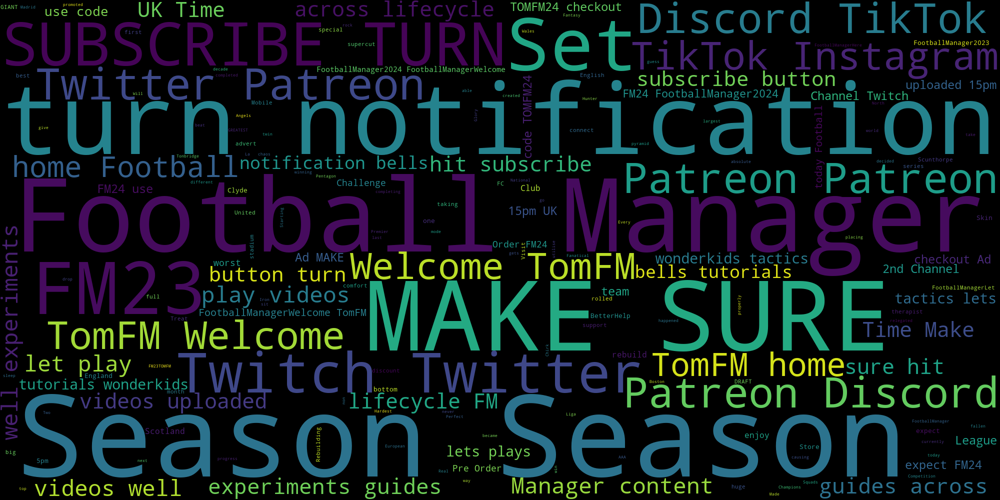

In [401]:
print('TomFM Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_TomFM.png', height=800, width=800)

WorkTheSpace Top 50 Viewed Videos Wordcloud


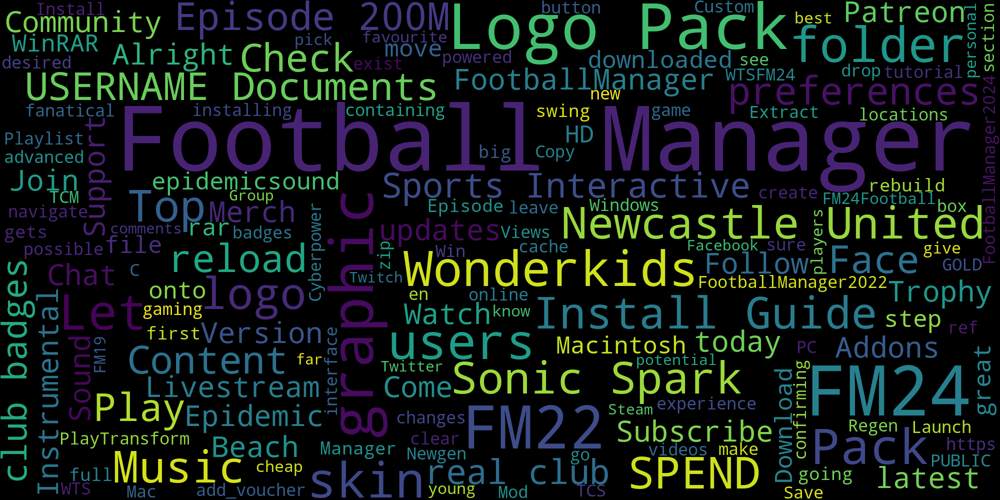

In [402]:
print('WorkTheSpace Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_WorkTheSpace.png', height=800, width=800)

Zealand Top 50 Viewed Videos Wordcloud


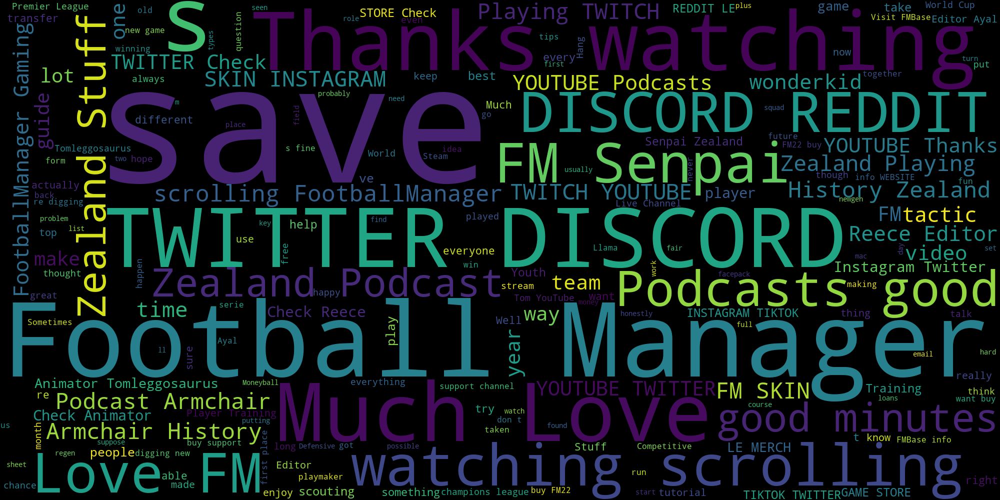

In [403]:
print('Zealand Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_Zealand.png', height=800, width=800)

lollujo Top 50 Viewed Videos Wordcloud


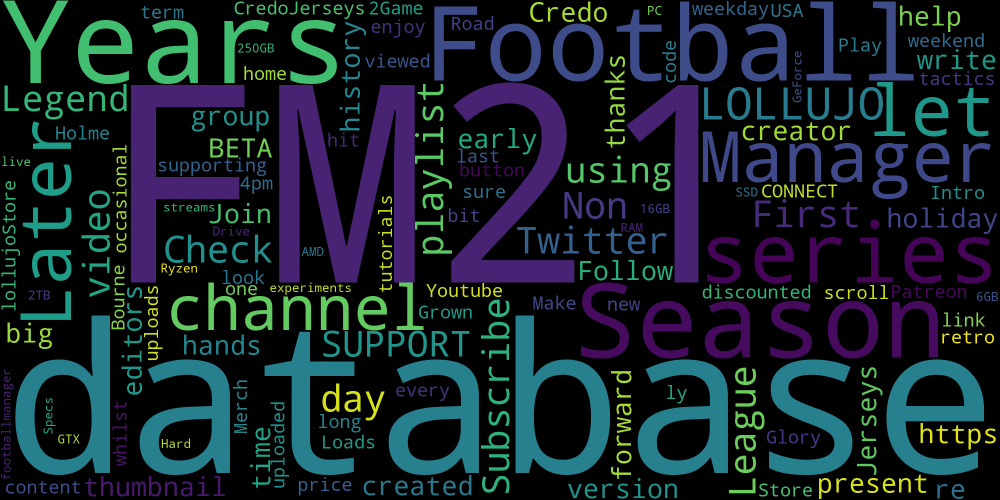

In [404]:
print('lollujo Top 50 Viewed Videos Wordcloud')
Image(filename='./images/wordcloud_lollujo.png', height=800, width=800)

### Wordcloud Insights by Creator

**DoctorBenjyFM**
- The wordcloud indicates a consistent branding strategy through a templated description.
- Terms such as "Parma," "Swindon," and "Girlfriend" refer to the creator's famous playlist series.
- "Liverpool" highlights the creator's fan allegiance.
- "Lorf_Yimzo" references a collaborator who simulated a Football Manager save game for 1000 years.

**Domingo Replay**
- Features terms like "PA5" and "Holy," which relate to a drink company and discount code.
- Mentions of "JBL" and "audio" showcase details of the creator’s streaming setup.
- "Cupra," a French car manufacturer, suggests sponsorship appealing to an audience with purchasing power.

**FM Scout**
- Keywords such as "Wonderkids," "tactics," and "tips" align with the channel's role as a Football Manager resource hub.
- Verbs like "learn," "support," and "follow" prompt viewer interaction.
- "Jake" likely refers to presenter Jake Cooper, a prominent figure in FM Scout's YouTube content.

**Omega Luke**
- Frequent terms like "StreamBeats Harris," "Epidemic," and "Harris Heller" reference copyright-free music for streamers.
- Promotions such as "Manscaped" and "use code" reflect sponsorships and affiliate marketing.
- The term "Wrestling" highlights the creator's dual career as a professional wrestler.

**TomFM**
- High-frequency calls to action: "MAKE SURE," "SUBSCRIBE," and "turn notification."
- Social media terms like "Patreon," "TikTok," and "Discord" reflect a multipronged engagement strategy.
- Phrases like "Welcome TomFM" aim to create a welcoming atmosphere for viewers.

**WorkTheSpace**
- Balanced word distribution reflects diverse video topics.
- Keywords like "Logo Pack," "Install Guide," and "Pack" suggest a focus on detailed tutorials for installing game assets.
- "Newcastle United" and "200M" relate to in-game content, reflecting real-world club ownership and financial dynamics.

**Zealand**
- Prominent use of "Save" suggests a focus on save-game narratives.
- Social networking terms such as "TWITTER" and "DISCORD" indicate community engagement across platforms.
- References to "YOUTUBE Podcasts" and "Armchair History" point to the creator’s involvement in podcasting and their history background.

**Lollujo**
- Terms like "FM21," "database," and "Years" link to the "1000 Years in the Future" simulation.
- Sponsorship mentions include "CredoJerseys" and "2Game."
- "Legend" aligns with the creator's "Non-League To Legend" series, emphasizing long-term gameplay challenges.

Each creators seeks out their own branding and engagement strategy, with their associated content ranging from focused tutorial content to long-form narratives. Product placements, service offerings, and sponsorships are prevalent and may target different audience demographics.
Attempts at deepened social networking integration between creator and subscribers reflects differing levels of community interaction and engagement.

## Fastest Growing Creator in Top Subscribed Channels

To determine the fastest growing channels possessing FM-related content as of the time of our data collection we will use the channel's publish date in combination with data related to subscriber count to estimate channel growth rate. This presumes a linear growth model, as we do not have access to any individual channel's growth metrics. There may be situations wherein a channel has existed for some time and then experienced meteoric growth, channels that had large subscriber activity near creation and then flattened out over time, or channels that do have linear growth.  

We execute a query against the full set of content creators, omitting creators we believe are not Football Manager oriented generally. 

In [142]:
sub_growth_df = con.sql("""SELECT channelName, channelId, subscribers, publishedAt 
                           FROM stats
                           WHERE channelName NOT IN ('NickRTFM', 'Nick28T', 'DK FALCON')
                           ORDER BY subscribers DESC
                        """).df()
sub_growth_df.head(10)

,channelName,channelId,subscribers,publishedAt
0,Domingo Replay,UCfAV0Lg4IPzZyRQq_Nh-5KA,432000,2017-05-14 13:55:55-07:00
1,Zealand,UC0sHHy5A8VUTHE_ysXeCO2Q,372000,2011-07-25 11:02:46-07:00
2,docks,UC2DPhH9Q_3Ah1nYqOi2Hm-w,244000,2007-02-22 08:16:37-08:00
3,Ataberk Doğan,UCenmkBehf4szi5V-O6EoMaQ,233000,2019-07-14 05:14:16-07:00
4,Manny Plus,UCVzKJvNg6RAtwAwIJ9tflng,218000,2020-09-30 04:23:19.409192-07:00
5,Kırmızı Kep,UCjfMl4KRZ8dF68VdOsxGkvg,217000,2014-11-07 10:24:59-08:00
6,WorkTheSpace,UCO3AJGFCk2fnB_P6RnwzSog,212000,2013-01-16 03:30:12-08:00
7,TomFM,UC0B_surYDWjLFNV7Iix3A3Q,209000,2017-01-14 04:54:58-08:00
8,FM Scout,UCJPE-cqo-rFbvOIE-37G09g,194000,2011-05-20 09:21:38-07:00
9,lollujo,UCTAdC3L4oSqEVrqTtZb_xkg,190000,2015-10-17 14:32:36-07:00


With this data frame, we then set our final data collection date as the cutoff. We compute the time delta from the channel creation date (`publishedAt`) and simply divide this by total number of subscribers, to get the average subscribers added by day rate. 

In [147]:
# Data_collection_date
data_collection_date = datetime(2024, 11, 22, tzinfo=timezone.utc)

# Function to process timestamp data and subtract from our data collection date
def ts_to_dt(ts):
    return (data_collection_date - ts.to_pydatetime()).days
    
# Find the time between channel creation and data collection, and create column to capture
sub_growth_df['time_delta'] = sub_growth_df['publishedAt'].apply(ts_to_dt)

# Create a new column capturing the average subscribers per day the channels have acquired.
sub_growth_df['subs_per_day'] = sub_growth_df['subscribers'] / sub_growth_df['time_delta']

sub_growth_df[['channelName', 'subscribers', 'subs_per_day']].sort_values('subs_per_day', ascending=False).style.hide()

channelName,subscribers,subs_per_day
Domingo Replay,432000,157.205240
Manny Plus,218000,144.084600
Ataberk Doğan,233000,119.059785
Zealand,372000,76.417420
Omega Luke,151000,74.604743
TomFM,209000,72.873082
Kırmızı Kep,217000,59.176439
lollujo,190000,57.177249
ZackNaniTV,161000,51.785140
WorkTheSpace,212000,48.994685


The fastest growing channels are dominated by content creators that overlap with FIFA/FC oriented content creators such as `Manny Plus` and   `Domingo Replay`. `Manny Plus` is renown for FIFA/FC streaming as he is for Football Manager content and `Domingo Replay` appears to be a variety streaming with a large collection of different games streamed, such as Crusader Kings III, Planet Coaster 2, Pro Cycling Manager, and League of Legends. Using different content niches may expand a content creator's audience in various ways and may attract and retain diverse audiences. The focus is on the creator's experience playing the games, and not necessarily focused on the game in and of itself. The presence of a creator called `Ataberk Doğan` reminds us that there is appetite for Turkish language content in this space, as discovered with our language detection run against channel branding descriptions.

## Videos Published Per Week

In [47]:
con.sql("DESCRIBE stats")

┌───────────────┬──────────────────────────┬─────────┬─────────┬─────────┬─────────┐
│  column_name  │       column_type        │  null   │   key   │ default │  extra  │
│    varchar    │         varchar          │ varchar │ varchar │ varchar │ varchar │
├───────────────┼──────────────────────────┼─────────┼─────────┼─────────┼─────────┤
│ publishedAt   │ TIMESTAMP WITH TIME ZONE │ YES     │ NULL    │ NULL    │ NULL    │
│ thumbnail_url │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelName   │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ subscribers   │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ views         │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ totalVideos   │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ playlistId    │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelId     │ VARCHAR                  │ YES     │ NULL    │ 

In [52]:
vid_publish_df = con.sql("""SELECT channelName, channelId, subscribers, totalVideos, publishedAt 
                           FROM stats
                           WHERE channelName NOT IN ('NickRTFM', 'Nick28T', 'DK FALCON')
                           ORDER BY subscribers DESC
                        """).df()

In [54]:
# Data_collection_date
data_collection_date = datetime(2024, 11, 22, tzinfo=timezone.utc)

# Function to process timestamp data and subtract from our data collection date
def ts_to_dt(ts):
    return (data_collection_date - ts.to_pydatetime()).days
    
# Find the time between channel creation and data collection, and create column to capture.
vid_publish_df['time_delta'] = vid_publish_df['publishedAt'].apply(ts_to_dt)

# Create a new column capturing the average videos per week. Multiple the days value by 7. 
vid_publish_df['vids_per_week'] = (vid_publish_df['totalVideos'] / vid_publish_df['time_delta']) * 7

vid_publish_df[['channelName', 'totalVideos', 'vids_per_week', 'publishedAt']].sort_values('vids_per_week', ascending=False).style.hide()

channelName,totalVideos,vids_per_week,publishedAt
lollujo,3793,7.990069,2015-10-17 14:32:36-07:00
docks,5968,6.444924,2007-02-22 08:16:37-08:00
Arthur Ray,3218,6.404891,2015-04-06 01:25:09-07:00
Domingo Replay,2500,6.368268,2017-05-14 13:55:55-07:00
WorkTheSpace,3277,5.301364,2013-01-16 03:30:12-08:00
Kırmızı Kep,2514,4.799018,2014-11-07 10:24:59-08:00
DoctorBenjy FM,2465,4.586656,2014-08-04 09:27:05-07:00
TomFM,1684,4.110181,2017-01-14 04:54:58-08:00
ZackNaniTV,1800,4.052750,2016-05-18 04:51:28-07:00
Omega Luke,1126,3.894269,2019-05-08 08:48:00-07:00


`lollujo` remains true to their channel byline of "Daily Football Manager videos" with a phenomenal average of 8 videos per week. The rate of videos per week should be adjustedy by the lifetime of the respective channel, as we see `docks` is in second place, but seems to have begun their content creation the earliest of all in the list. `Zealand` clocks in at approximately one video per week, but it is likely that their content creation journey began much before their Football Manager niche developed.

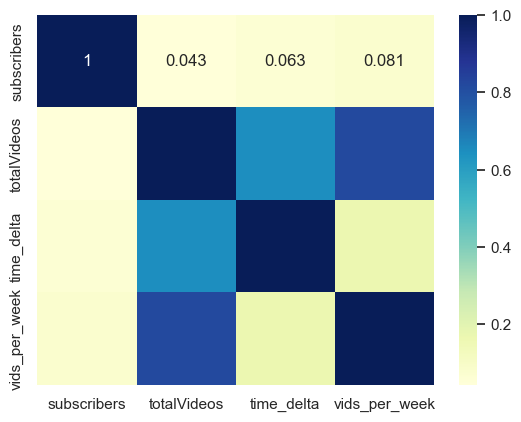

In [56]:
# Plotting correlation heatmap
dataplot = sns.heatmap(vid_publish_df.corr(numeric_only=True), cmap="YlGnBu", annot=True)
# Displaying heatmap
plt.show()

Subscriber count has no correlation with the total number of videos a channel, how much time has elapsed since channel creation, and not on the rate of videos produced per week. This speaks to a purity of content quality and topic creativity, and less any advantages gleaned from algorithmic benefits of producing content at a regular cadence. 

## Most Efficient Content

We gauge the "most efficient"  content from among the Top 20 ranking utilizing `commentRatio` and `likeRatio` values from our database. Higher values meaning more engagement per view. 

In [58]:
con.sql("DESCRIBE videos")

┌──────────────────┬──────────────────────────┬─────────┬─────────┬─────────┬─────────┐
│   column_name    │       column_type        │  null   │   key   │ default │  extra  │
│     varchar      │         varchar          │ varchar │ varchar │ varchar │ varchar │
├──────────────────┼──────────────────────────┼─────────┼─────────┼─────────┼─────────┤
│ video_id         │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelTitle     │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ title            │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ description      │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ tags             │ VARCHAR[]                │ YES     │ NULL    │ NULL    │ NULL    │
│ publishedAt      │ TIMESTAMP WITH TIME ZONE │ YES     │ NULL    │ NULL    │ NULL    │
│ viewCount        │ DOUBLE                   │ YES     │ NULL    │ NULL    │ NULL    │
│ likeCount        │ DOUBLE     

We added another variety streamer, `Seals 311` to our exclusion list, since including their records mostly returned FIFA or variety content, and we are deliberately focusing creators targeting Football Manager content primarily. Again, this is the issue of separating creators from content, and from their _primary_ content creation niche. The niches and creators are fluid in this regard.

### LikeRatio

In [154]:
# Top 20 LikeRatio
top_20_like_ratio_vids = con.sql("""SELECT channelTitle, video_id, commentCount, likeCount, viewCount, LikeRatio, publishedAt
           FROM videos
           WHERE channelTitle NOT IN ('NickRTFM', 'Nick28T', 'DK FALCON', 'Seals 311')
           -- WHERE channelTitle NOT IN ('NickRTFM', 'Nick28T', 'DK FALCON')
           AND viewCount > 0
           ORDER BY LikeRatio DESC
           LIMIT 20
        """).df()
top_20_like_ratio_vids['url'] = "https://www.youtube.com/watch?v=" + top_20_like_ratio_vids['video_id']
# Remove index
top_20_like_ratio_vids.index=[''] * len(top_20_like_ratio_vids)
top_20_like_ratio_vids[['channelTitle', 'LikeRatio','url', 'publishedAt']]

,channelTitle,LikeRatio,url,publishedAt
,lollujo,219.92,https://www.youtube.com/watch?v=lkJ-0EumbHM,2020-07-10 08:00:23-07:00
,Omega Luke,212.26,https://www.youtube.com/watch?v=h604OlgwLlg,2020-07-27 04:00:13-07:00
,DoctorBenjy FM,192.22,https://www.youtube.com/watch?v=volTKpFVvZ4,2021-09-20 09:00:23-07:00
,lollujo,181.96,https://www.youtube.com/watch?v=DjJAVtVGacg,2021-04-05 08:00:13-07:00
,Kırmızı Kep,181.61,https://www.youtube.com/watch?v=SZ4w62mrb6o,2024-12-05 06:55:40-08:00
,lollujo,177.16,https://www.youtube.com/watch?v=J7pA2tdB5Qw,2020-01-13 08:00:03-08:00
,DoctorBenjy FM,176.41,https://www.youtube.com/watch?v=AwepnGwmrpk,2020-06-05 09:00:05-07:00
,DoctorBenjy FM,175.52,https://www.youtube.com/watch?v=h5WmgiyLWNk,2017-05-19 09:00:06-07:00
,Ataberk Doğan,173.37,https://www.youtube.com/watch?v=_7dRkUkAUdA,2022-10-14 07:01:13-07:00
,WorkTheSpace,173.30,https://www.youtube.com/watch?v=9LAmpVCsrlo,2023-04-25 04:00:09-07:00


In [75]:
top_20_like_ratio_vids['LikeRatio'].describe()

count    20.00
mean    176.34
std      15.62
min     161.39
25%     166.85
50%     172.70
75%     178.27
max     219.92
Name: LikeRatio, dtype: float64

Using our normalized `LikeRatio` value, highly engaged content obtained a maximum of **219.92** likes per 1000 views, and an average value of **176.34** likes per 1000 views.

### CommentRatio

In [156]:
# Top 20 CommentRatio
top_20_comment_ratio_vids = con.sql("""SELECT channelTitle, video_id, commentCount, likeCount, viewCount, CommentRatio, publishedAt
           FROM videos
           WHERE channelTitle NOT IN ('NickRTFM', 'Nick28T', 'DK FALCON', 'Seals 311')
           AND viewCount > 0
           ORDER BY CommentRatio DESC
           LIMIT 20
        """).df()
top_20_comment_ratio_vids['url'] = "https://www.youtube.com/watch?v=" + top_20_comment_ratio_vids['video_id']
top_20_comment_ratio_vids.index=[''] * len(top_20_comment_ratio_vids)
top_20_comment_ratio_vids[['channelTitle', 'CommentRatio','url', 'publishedAt']]

,channelTitle,CommentRatio,url,publishedAt
,Kırmızı Kep,137.11,https://www.youtube.com/watch?v=-IDzMmG-0fw,2020-04-26 09:51:05-07:00
,WorkTheSpace,132.65,https://www.youtube.com/watch?v=QdauHlWeb_E,2013-09-12 04:20:07-07:00
,TomFM,117.12,https://www.youtube.com/watch?v=Xx-ijzyInvI,2017-12-23 10:00:03-08:00
,Kırmızı Kep,107.57,https://www.youtube.com/watch?v=W13gZVEAA4U,2015-07-21 01:23:33-07:00
,Kırmızı Kep,83.60,https://www.youtube.com/watch?v=GBz9j20YH1A,2015-01-30 06:09:39-08:00
,Kırmızı Kep,80.39,https://www.youtube.com/watch?v=9srmD7JdDGs,2020-04-28 10:05:06-07:00
,FM Scout,74.59,https://www.youtube.com/watch?v=YtzdRihl-84,2015-12-17 11:08:44-08:00
,Omega Luke,73.11,https://www.youtube.com/watch?v=h604OlgwLlg,2020-07-27 04:00:13-07:00
,docks,70.58,https://www.youtube.com/watch?v=YmKRvrOJjWI,2013-12-09 08:00:01-08:00
,docks,69.02,https://www.youtube.com/watch?v=Tej7awsFsO8,2013-06-25 07:30:45-07:00


In [87]:
top_20_comment_ratio_vids['CommentRatio'].describe()

count    20.00
mean     75.83
std      26.62
min      52.82
25%      58.17
50%      65.31
75%      81.19
max     137.11
Name: CommentRatio, dtype: float64

For `CommentRatio` we see a maximum of **137.11** comments per 1000 views, and a mean value of **75.83** comments per 1000 views. The `LikeRatio` value would generally outpace any `CommentRatio` value due to the ease of liking, versus the time and effort needed to comment, though creators would likely appreciate both engagement patterns.

### Most Efficient Creators

We normalize the ratio of comments and likes to views then sort in descending order. 

#### CommentRatio

In [94]:
con.sql("""SELECT channelTitle, SUM(commentCount) * 1000 / SUM(viewCount)  AS commentRatio 
           FROM videos
           WHERE channelTitle NOT IN ('NickRTFM', 'Nick28T', 'DK FALCON', 'Seals 311')
           GROUP BY channelTitle
           ORDER BY commentRatio DESC
           LIMIT 10
        """)

┌────────────────┬────────────────────┐
│  channelTitle  │    commentRatio    │
│    varchar     │       double       │
├────────────────┼────────────────────┤
│ Ataberk Doğan  │  5.284519338703122 │
│ docks          │  4.376035986795841 │
│ Kırmızı Kep    │  4.188635478596258 │
│ Arthur Ray     │  4.012512168642957 │
│ DoctorBenjy FM │ 3.5888332734361033 │
│ lollujo        │  3.050411417063497 │
│ WorkTheSpace   │ 2.5235882420011113 │
│ Steini         │  2.296799256151416 │
│ Zealand        │ 1.8579573115243462 │
│ Omega Luke     │ 1.8539514572434017 │
├────────────────┴────────────────────┤
│ 10 rows                   2 columns │
└─────────────────────────────────────┘

`Ataberk Doğan` and `Kırmızı Kep` are Turkish language streamers, with `Ataberk Doğan` possessing a large amount of IRL content, which may speak to a potentially untapped Football Manager content space, along with the benefits of streaming in multiple niches. 

#### LikeRatio

In [96]:
con.sql("""SELECT channelTitle, SUM(likeCount) * 1000 / SUM(viewCount)  AS likeRatio 
           FROM videos
           WHERE channelTitle NOT IN ('NickRTFM', 'Nick28T', 'DK FALCON', 'Seals 311')
           GROUP BY channelTitle
           ORDER BY likeRatio DESC
           LIMIT 10
        """)

┌────────────────┬───────────────────┐
│  channelTitle  │     likeRatio     │
│    varchar     │      double       │
├────────────────┼───────────────────┤
│ DoctorBenjy FM │ 59.15228710186735 │
│ Steini         │ 56.91254750689085 │
│ lollujo        │ 55.02239970447087 │
│ docks          │ 54.70343598638308 │
│ Arthur Ray     │ 47.28231358805704 │
│ Ataberk Doğan  │ 46.99039506874576 │
│ Kırmızı Kep    │ 39.41300247049192 │
│ WorkTheSpace   │ 37.74584150442822 │
│ Zealand        │ 33.15102230228797 │
│ ZackNaniTV     │ 31.27664220014119 │
├────────────────┴───────────────────┤
│ 10 rows                  2 columns │
└────────────────────────────────────┘

#### Subscribers Per Video

In [97]:
con.sql("DESCRIBE stats")

┌───────────────┬──────────────────────────┬─────────┬─────────┬─────────┬─────────┐
│  column_name  │       column_type        │  null   │   key   │ default │  extra  │
│    varchar    │         varchar          │ varchar │ varchar │ varchar │ varchar │
├───────────────┼──────────────────────────┼─────────┼─────────┼─────────┼─────────┤
│ publishedAt   │ TIMESTAMP WITH TIME ZONE │ YES     │ NULL    │ NULL    │ NULL    │
│ thumbnail_url │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelName   │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ subscribers   │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ views         │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ totalVideos   │ BIGINT                   │ YES     │ NULL    │ NULL    │ NULL    │
│ playlistId    │ VARCHAR                  │ YES     │ NULL    │ NULL    │ NULL    │
│ channelId     │ VARCHAR                  │ YES     │ NULL    │ 

In [102]:
con.sql("""SELECT channelName, subscribers, totalVideos, (subscribers / totalVideos) AS subs_per_video 
           FROM stats
           WHERE channelName NOT IN ('NickRTFM', 'Nick28T', 'DK FALCON', 'Seals 311')
           GROUP BY channelName, subs_per_video, subscribers, totalVideos
           ORDER BY subs_per_video DESC
           LIMIT 10
        """)

┌────────────────┬─────────────┬─────────────┬────────────────────┐
│  channelName   │ subscribers │ totalVideos │   subs_per_video   │
│    varchar     │    int64    │    int64    │       double       │
├────────────────┼─────────────┼─────────────┼────────────────────┤
│ Zealand        │      372000 │         678 │  548.6725663716815 │
│ Ataberk Doğan  │      233000 │         559 │ 416.81574239713774 │
│ Manny Plus     │      218000 │         533 │ 409.00562851782365 │
│ Steini         │       97100 │         419 │ 231.74224343675417 │
│ Domingo Replay │      432000 │        2500 │              172.8 │
│ Omega Luke     │      151000 │        1126 │ 134.10301953818828 │
│ TomFM          │      209000 │        1684 │ 124.10926365795724 │
│ FM Scout       │      194000 │        1884 │  102.9723991507431 │
│ ZackNaniTV     │      161000 │        1800 │  89.44444444444444 │
│ Kırmızı Kep    │      217000 │        2514 │  86.31662688941925 │
├────────────────┴─────────────┴─────────────┴──

`Zealand` is at it again, with a whopping **548.67** subscribers per video, with `Ataberk Doğan` and `Manny Plus` trailing with **416.82** and **409** subscribers per video respectively. The niche `Zealand` occupies in terms of instructing viewers in _how_ to play the game seems to have benefitted their channel growth immensely, given they only have 678 videos in total.

# Variable Storage

We store variables to avoid having to re-download data via API and incur quota cost.

In [303]:
# Write data locally for future reference
%store cleaned_fm_channels
%store all_fm_channels
%store channel_stats

Stored 'cleaned_fm_channels' (DataFrame)
Stored 'all_fm_channels' (DataFrame)
Stored 'channel_stats' (DataFrame)


In [116]:
# Set dataframe names for later user
%store viewcount_ts_df
%store likecount_ts_df
%store commentcount_ts_df
%store top_50_viewed_videos
# %store high_perf_videos_df

Stored 'viewcount_ts_df' (DataFrame)
Stored 'likecount_ts_df' (DataFrame)
Stored 'commentcount_ts_df' (DataFrame)
Stored 'top_50_viewed_videos' (DataFrame)


In [123]:
%store video_data_df

Stored 'video_data_df' (DataFrame)


In [3]:
# Retrieve variables from disk
%store -r cleaned_fm_channels
%store -r all_fm_channels
%store -r channel_stats

%store -r  viewcount_ts_df
%store -r likecount_ts_df
%store -r commentcount_ts_df
#%store -r high_perf_videos_df

# End of Notebook

We close the `DuckDB` database explicitly to prevent issues with long-running connections impacting notebook operation.

In [103]:
con.close()